# Srilanka Dengue Outbreak Forecasting using Darts

## Environment Setup

In [1]:
!pip install darts
!pip install dask[dataframe]
!pip install statsmodels

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## 1. Imports

In [3]:
import os
import pickle
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np

from darts import TimeSeries

%matplotlib inline

## 2. Load Dataset

In [4]:
df = pd.read_csv("/content/drive/MyDrive/Datasets/Copy of Sri_lanka_dengue_cases_weather_weekly_2007_2024_.csv")

In [5]:
df.head()

,Unnamed: 0,District,Number_of_Cases,Week_Start_Date,Month,Year,Week,Week_End_Date,Avg Max Temp (°C),Avg Min Temp (°C),Avg Apparent Max Temp (°C),Avg Apparent Min Temp (°C),Total Precipitation (mm),Total Rain (mm),Avg Wind Speed (km/h),Max Wind Gusts (km/h),Weather Code,Avg Daylight Duration (hours),Avg Sunrise Time,Avg Sunset Time
0,0,Ampara,0,2007-01-01,1,2007,1,2007-01-08,26.9375,21.8625,28.8500,24.1000,8.0,8.0,18.2000,44.3,3,11.714583,376,1079
1,1,Ampara,0,2007-01-08,1,2007,2,2007-01-15,26.3500,23.3250,30.2625,26.7000,86.1,86.1,17.0250,43.6,53,11.733333,378,1082
2,2,Ampara,0,2007-01-15,1,2007,3,2007-01-22,27.2125,23.1625,29.5750,25.9625,3.1,3.1,20.1875,48.2,51,11.754167,380,1085
3,3,Ampara,0,2007-01-22,1,2007,4,2007-01-29,26.7250,23.0375,29.9500,26.1125,53.6,53.6,17.2000,42.5,61,11.783333,381,1088
4,4,Ampara,0,2007-01-29,1,2007,5,2007-02-05,27.3625,22.9625,30.7500,26.1250,8.2,8.2,17.2625,40.0,51,11.812500,382,1090


In [6]:
df = df.drop(columns = ["Unnamed: 0"])

In [7]:
len(df)

22900

In [8]:
districts = df['District'].unique()
districts

array(['Ampara', 'Anuradhapura', 'Badulla', 'Batticaloa', 'Colombo',
       'Galle', 'Gampaha', 'Hambantota', 'Jaffna', 'Kalutara', 'Kandy',
       'Kegalle', 'Kilinochchi', 'Kurunegala', 'Mannar', 'Matale',
       'Matara', 'Monaragala', 'Mullaitivu', 'NuwaraEliya', 'Polonnaruwa',
       'Puttalam', 'Ratnapura', 'Trincomalee', 'Vavuniya'], dtype=object)

## 3. Small Visualization

In [9]:
# Check Duplicate values
duplicates = df[['District', 'Week_Start_Date', 'Week_End_Date']].duplicated().any()
if duplicates:
    print("There are duplicate values.")
else:
    print("No duplicates found.")

No duplicates found.


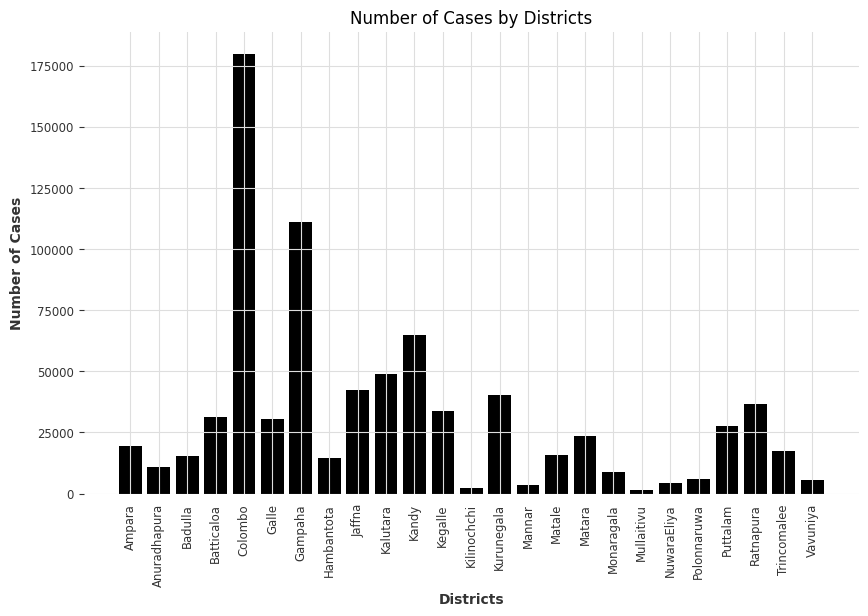

In [10]:
# Group by District and sum the Number of Cases
district_cases = df.groupby('District')['Number_of_Cases'].sum().reset_index()

# Plotting the histogram
plt.figure(figsize=(10, 6))
plt.bar(district_cases['District'], district_cases['Number_of_Cases'])
plt.xlabel('Districts')
plt.ylabel('Number of Cases')
plt.title('Number of Cases by Districts')
plt.xticks(rotation=90)
plt.show()


## 4. Minor pre-processing
1. Only taking single timestamp for each row. Either `Week_Start_Date` or `Week_Start_Date`. We gonna take `Week_End_Date`.
2. Convert the `Week_End_Date` to Python Datetime format.
3. Eliminate un-used features such as `Week_Start_Date`, `Month`, `Year`, and `Week`

In [11]:
df['Week_End_Date'] = pd.to_datetime(df['Week_End_Date'])

In [12]:
df.head()

,District,Number_of_Cases,Week_Start_Date,Month,Year,Week,Week_End_Date,Avg Max Temp (°C),Avg Min Temp (°C),Avg Apparent Max Temp (°C),Avg Apparent Min Temp (°C),Total Precipitation (mm),Total Rain (mm),Avg Wind Speed (km/h),Max Wind Gusts (km/h),Weather Code,Avg Daylight Duration (hours),Avg Sunrise Time,Avg Sunset Time
0,Ampara,0,2007-01-01,1,2007,1,2007-01-08,26.9375,21.8625,28.8500,24.1000,8.0,8.0,18.2000,44.3,3,11.714583,376,1079
1,Ampara,0,2007-01-08,1,2007,2,2007-01-15,26.3500,23.3250,30.2625,26.7000,86.1,86.1,17.0250,43.6,53,11.733333,378,1082
2,Ampara,0,2007-01-15,1,2007,3,2007-01-22,27.2125,23.1625,29.5750,25.9625,3.1,3.1,20.1875,48.2,51,11.754167,380,1085
3,Ampara,0,2007-01-22,1,2007,4,2007-01-29,26.7250,23.0375,29.9500,26.1125,53.6,53.6,17.2000,42.5,61,11.783333,381,1088
4,Ampara,0,2007-01-29,1,2007,5,2007-02-05,27.3625,22.9625,30.7500,26.1250,8.2,8.2,17.2625,40.0,51,11.812500,382,1090


** The trend of cases of all 25 districts

In [13]:
import plotly.express as px

# List of all districts
districts = df['District'].unique()

for district in districts:
    # Filter data for the current district
    df_district = df[df['District'] == district]

    # Create an interactive line plot using Plotly without markers
    fig = px.line(
        df_district,
        x="Week_End_Date",
        y="Number_of_Cases",
        title=f"Number of Cases Over Time - {district}",
        labels={'Week_End_Date': 'Week End Date', 'Number_of_Cases': 'Number of Cases'}
    )

    # Customize the layout for a bigger and clearer plot
    fig.update_layout(
        width=1000,  # Width of the figure
        height=600,  # Height of the figure
        title_font_size=18,
        xaxis_title_font_size=14,
        yaxis_title_font_size=14,
        hovermode="x"  # Show hover data for the x-axis
    )

    # Show the interactive plot with zoom and pan features
    fig.show()


/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  v = v.dt.to_pydatetime()


/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



/usr/local/lib/python3.10/dist-packages/_plotly_utils/basevalidators.py:105: FutureWarning:

The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result



## 5. Modelling
List of regression models.
- RegressionModel
- LinearRegressionModel
- RandomForest
- LightGBMModel
- XGBModel
- CatBoostModel



In [14]:
from darts.models import RegressionModel, RandomForest, LinearRegressionModel, XGBModel, LightGBMModel, CatBoostModel
from sklearn.linear_model import Ridge
from darts.metrics import rmse, mae, smape, r2_score, rmsle
import plotly.graph_objects as go

In [15]:
!pip install "u8darts[all]"

In [16]:
reg = RegressionModel(
    lags = [-1, -2, -3, -52],
    lags_future_covariates=[-52],
    model = Ridge(),
    output_chunk_length=12,  # Number of time steps predicted at once (per chunk) by the internal model.
)
lr  = LinearRegressionModel(
    lags = [-1, -2, -3, -52],
    lags_future_covariates=[-1, -2, -3, -52],
    output_chunk_length=12, # Number of time steps predicted at once (per chunk) by the internal model.
    random_state=42
)

rf = RandomForest(
    lags = [-1, -2, -3, -52],
    lags_future_covariates=[-1, -2, -3, -52],
    output_chunk_length=12, # Number of time steps predicted at once (per chunk) by the internal model.
    random_state=42
)

lgbm = LightGBMModel(
    lags = [-1, -2, -3, -52],
    lags_future_covariates=[-1, -2, -3, -52],
    output_chunk_length=12, # Number of time steps predicted at once (per chunk) by the internal model.
    random_state=42
)
xgb = XGBModel(
    lags = [-1, -2, -3, -52],
    lags_future_covariates=[-1, -2, -3, -52],
    output_chunk_length=12, # Number of time steps predicted at once (per chunk) by the internal model.
    random_state=42
)
cat = CatBoostModel(
    lags = [-1, -2, -3, -52],
    lags_future_covariates=[-1, -2, -3, -52],
    output_chunk_length=12, # Number of time steps predicted at once (per chunk) by the internal model.
    random_state=42
)

In [17]:
models = [reg, lr, rf, lgbm, xgb, cat]

In [18]:
def save_model(model, model_name, district_name, folder='saved_models'):
    # Create directory if it doesn't exist
    os.makedirs(folder, exist_ok=True)

    # Define the model file path
    model_file = os.path.join(folder, f'{district_name}_{model_name}.pkl')

    # Save the model using pickle
    with open(model_file, 'wb') as f:
        pickle.dump(model, f)
    print(f"Model saved for {district_name}: {model_file}")

In [19]:
def train_and_forecast(train_series, val_series, future_covariates, model, district_name):
    model.fit(train_series, future_covariates=future_covariates)

    model_folder = f"/content/drive/MyDrive/Models/{district_name}"
    # Save Model
    save_model(model, type(model).__name__, model_folder)

    # Forecast for the next 12 weeks
    forecast = model.predict(n=len(val_series), future_covariates=future_covariates)

    # Plot the results
    plt.figure(figsize=(12, 6))
    train_series.plot(label='Historical Data')
    val_series.plot(label='Validation Data', color='orange')
    forecast.plot(label='Forecast', color='green')
    plt.legend()
    plt.title(f"Forecast vs Validation for {district_name}")
    plt.show()

    # Calculate metrics
    val_values = val_series.values()
    forecast_values = forecast.values()

    # Ensure the forecast and validation values are the same length
    assert len(val_values) == len(forecast_values), "Forecast and validation series must have the same length for metrics calculation."

    # Compute metrics
    error_rmse = rmse(val_series, forecast)
    error_mae = mae(val_series, forecast)
    error_smape = smape(val_series, forecast)
    error_r2 = r2_score(val_series, forecast)
    error_rmsle = rmsle(val_series, forecast)

    errors = {
        "RMSE": error_rmse,
        "MAE": error_mae,
        "SMAPE": error_smape,
        "R2": error_r2,
        "RMSLE": error_rmsle
    }
    results = [forecast, errors]
    return results

In [20]:
def main(data, models):
    districts = data['District'].unique()
    final_output = []
    for district in districts:
      # Filter data for the specified district
      district_data = data[data['District'] == district]

      # Ensure the 'Week_End_Date' column is in datetime format
      district_data['Week_End_Date'] = pd.to_datetime(district_data['Week_End_Date'])

      # Prepare the data for ARIMA
      series = TimeSeries.from_dataframe(district_data, time_col='Week_End_Date', value_cols=['Number_of_Cases', 'Avg Max Temp (°C)', "Avg Min Temp (°C)", "Avg Apparent Max Temp (°C)", "Avg Apparent Min Temp (°C)", "Total Precipitation (mm)", "Avg Daylight Duration (hours)", "Avg Sunrise Time", "Avg Sunset Time", "Avg Wind Speed (km/h)"])

      # Split series
      # Set aside the last 12 weeks as a validation series
      train_data, val_data = series["Number_of_Cases"][:-12], series["Number_of_Cases"][-12:]
      future_covariates = series[["Avg Max Temp (°C)", "Avg Min Temp (°C)", "Avg Apparent Max Temp (°C)", "Avg Apparent Min Temp (°C)", "Total Precipitation (mm)", "Avg Daylight Duration (hours)", "Avg Sunrise Time", "Avg Sunset Time", "Avg Wind Speed (km/h)"]]

      print(f"Training length: {len(train_data)}")
      print(f"Validation length: {len(val_data)}")

      district_output = []
      for m in models:
        result = train_and_forecast(train_data, val_data, future_covariates, m, district)
        district_output.append(result)

      final_output.append(district_output)

    return final_output


<ipython-input-20-9a1940f4a35d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Ampara: /content/drive/MyDrive/Models/Ampara_RegressionModel.pkl


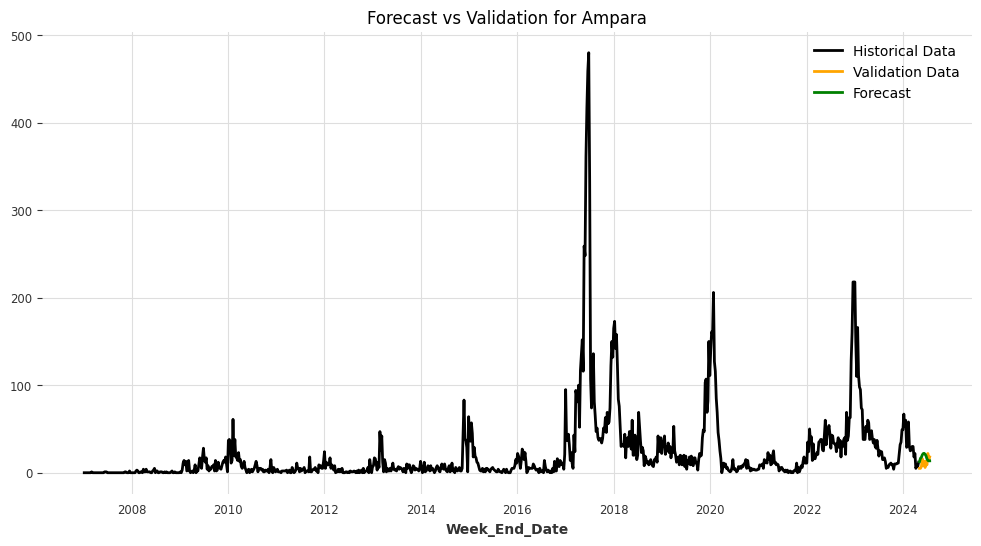

Model saved for /content/drive/MyDrive/Models/Ampara: /content/drive/MyDrive/Models/Ampara_LinearRegressionModel.pkl


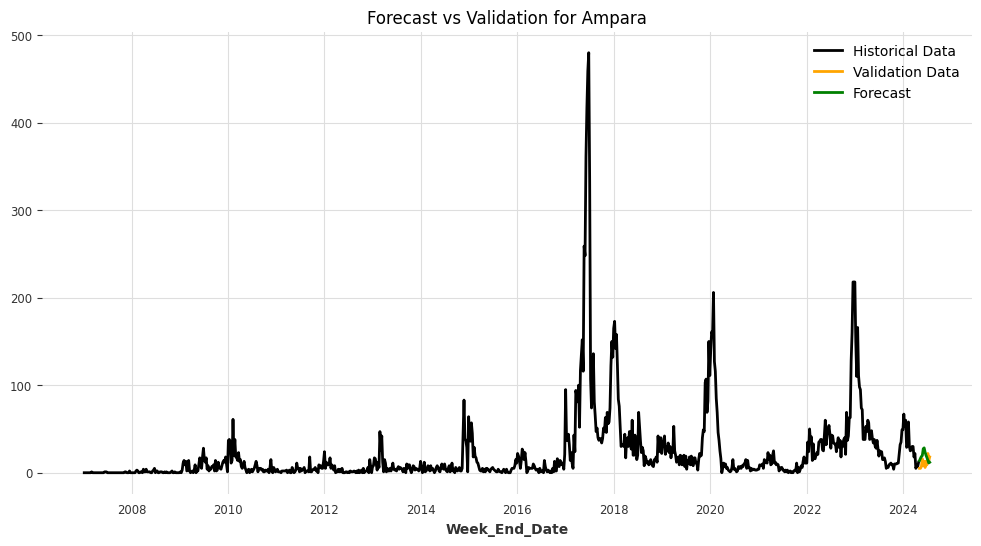

Model saved for /content/drive/MyDrive/Models/Ampara: /content/drive/MyDrive/Models/Ampara_RandomForest.pkl


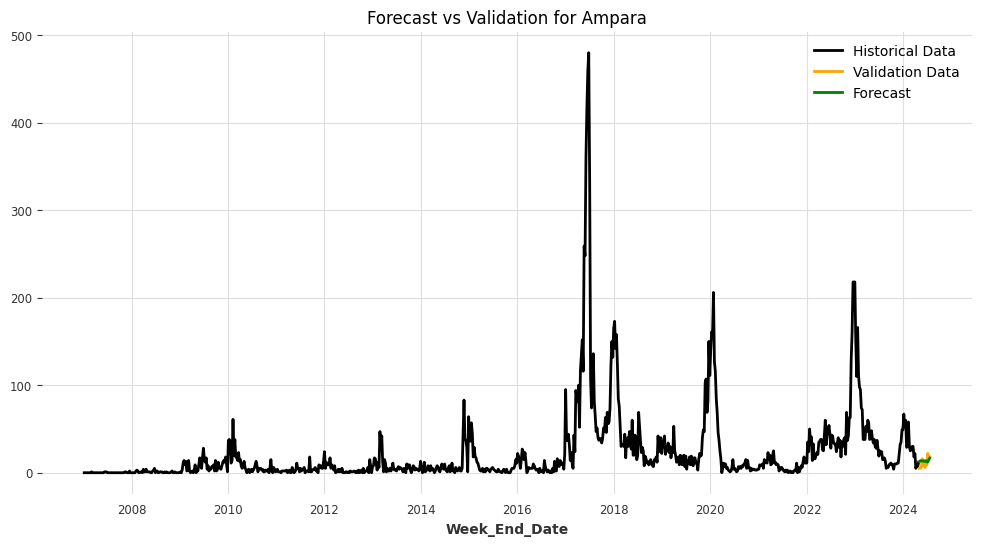

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000814 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7641
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 22.847800
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000698 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7641
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 22.883472
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000710 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7641
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start trainin

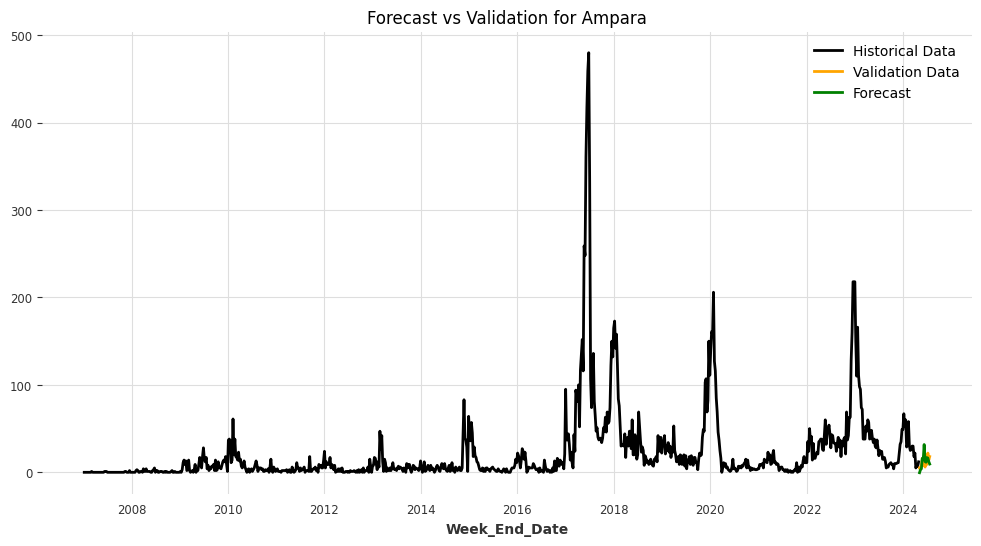

Model saved for /content/drive/MyDrive/Models/Ampara: /content/drive/MyDrive/Models/Ampara_XGBModel.pkl


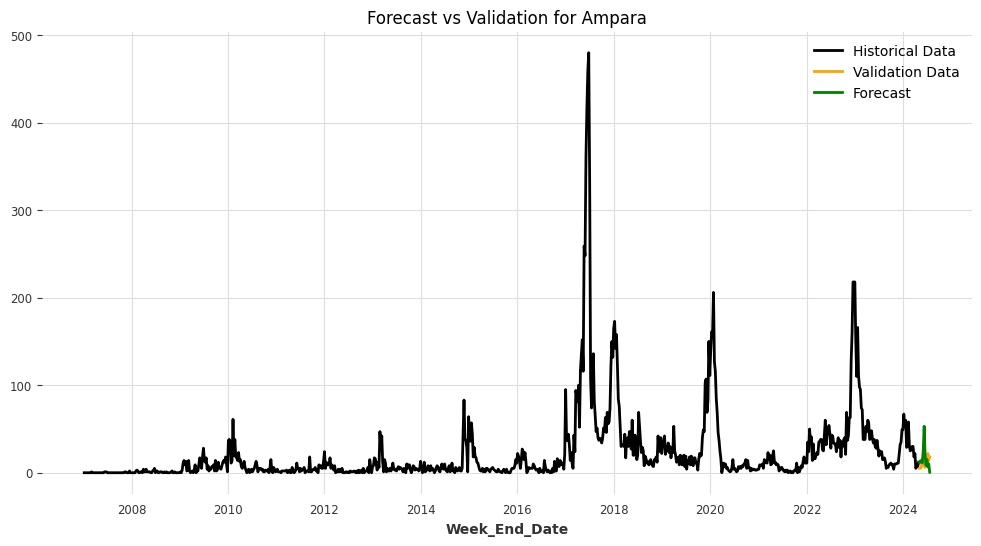

Model saved for /content/drive/MyDrive/Models/Ampara: /content/drive/MyDrive/Models/Ampara_CatBoostModel.pkl


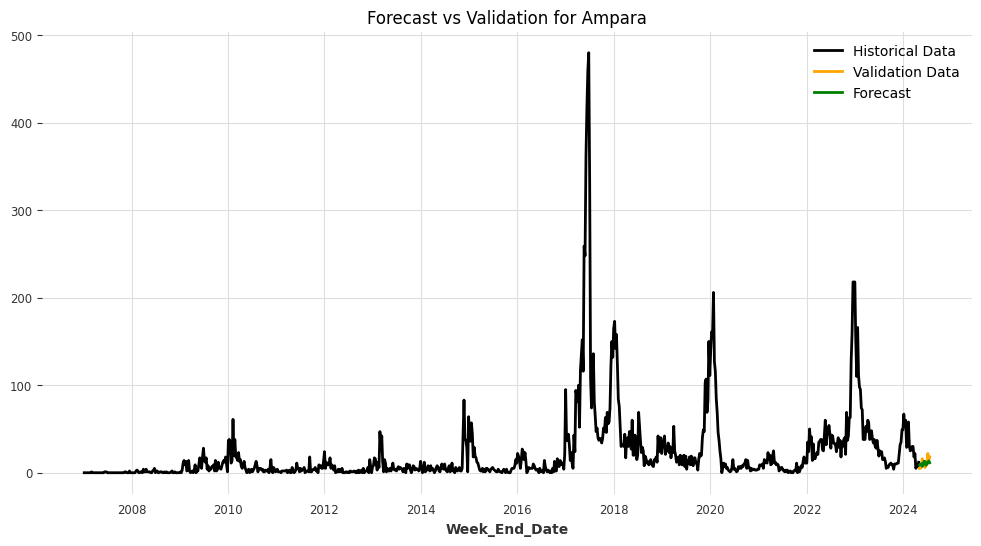

<ipython-input-20-9a1940f4a35d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Anuradhapura: /content/drive/MyDrive/Models/Anuradhapura_RegressionModel.pkl


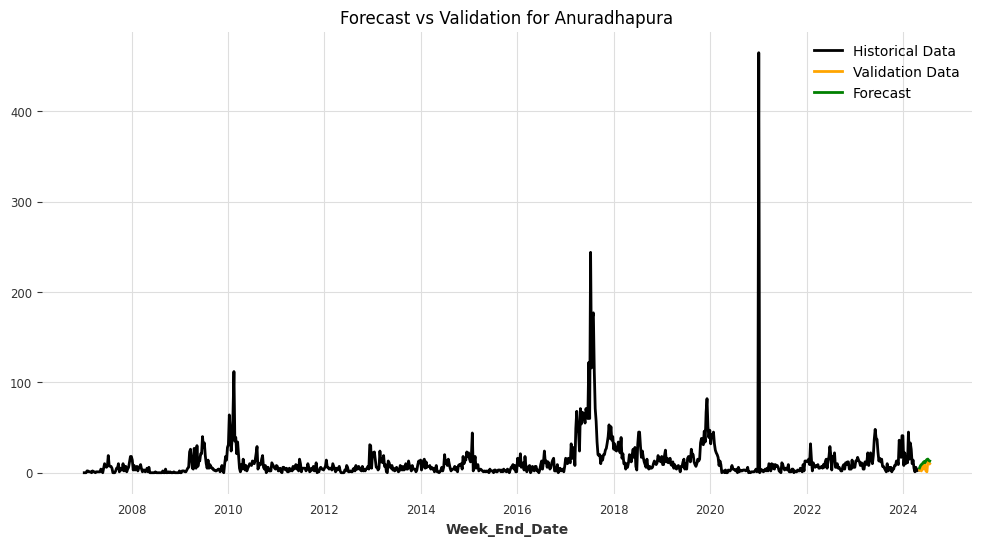

Model saved for /content/drive/MyDrive/Models/Anuradhapura: /content/drive/MyDrive/Models/Anuradhapura_LinearRegressionModel.pkl


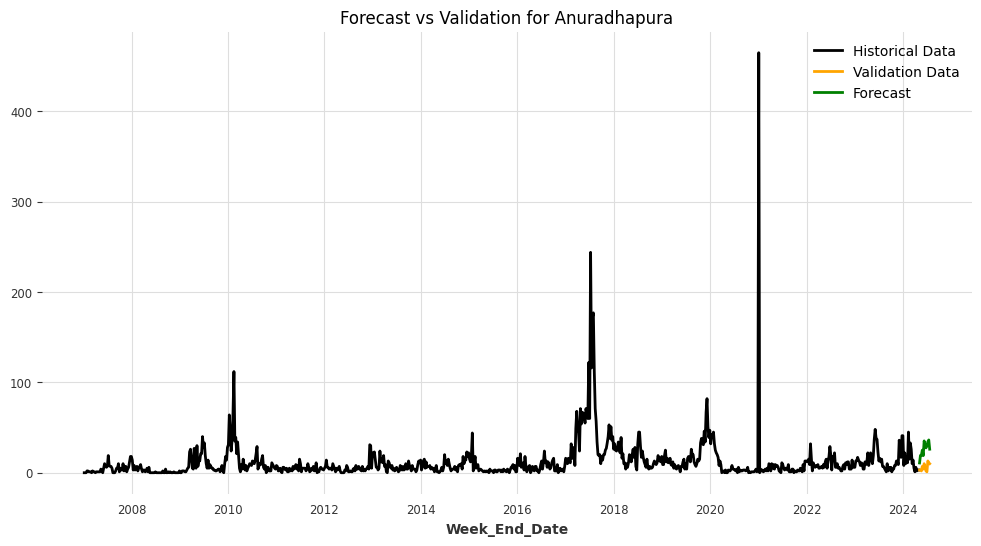

Model saved for /content/drive/MyDrive/Models/Anuradhapura: /content/drive/MyDrive/Models/Anuradhapura_RandomForest.pkl


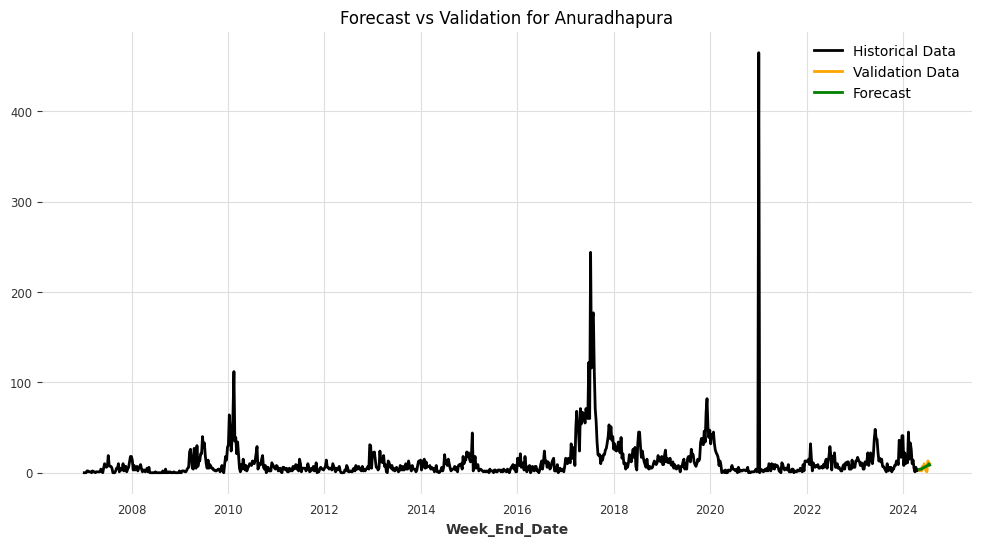

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000447 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7591
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 12.379310
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000396 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7591
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 12.380499
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] 

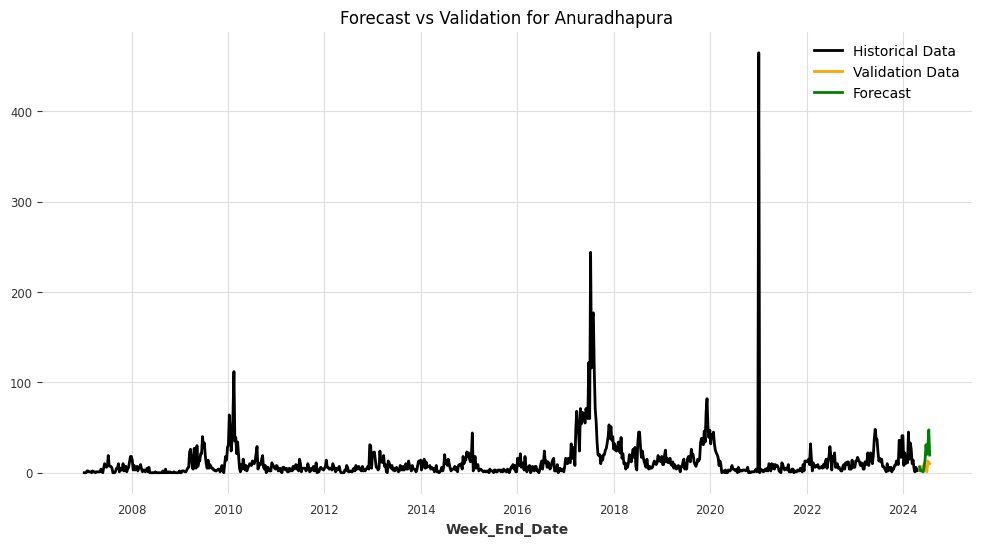

Model saved for /content/drive/MyDrive/Models/Anuradhapura: /content/drive/MyDrive/Models/Anuradhapura_XGBModel.pkl


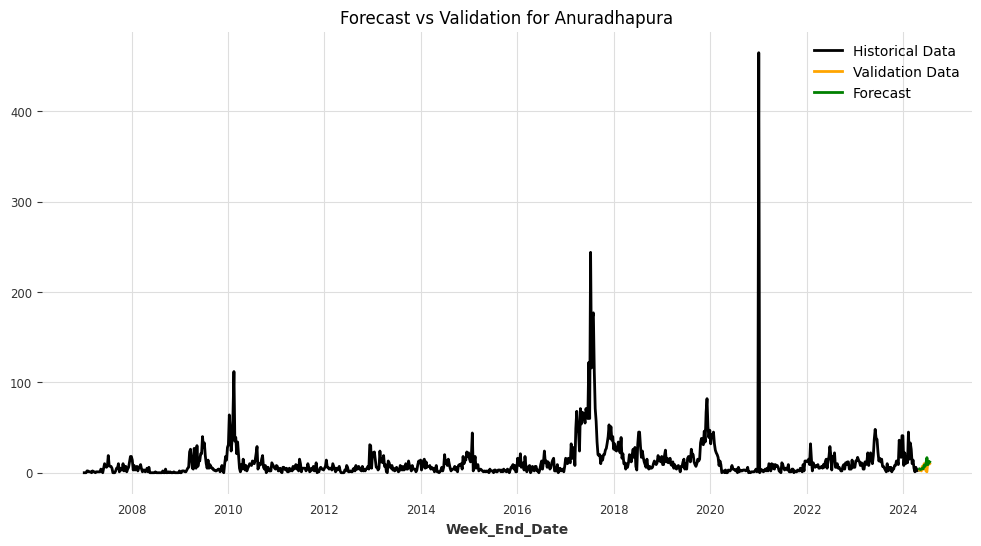

Model saved for /content/drive/MyDrive/Models/Anuradhapura: /content/drive/MyDrive/Models/Anuradhapura_CatBoostModel.pkl


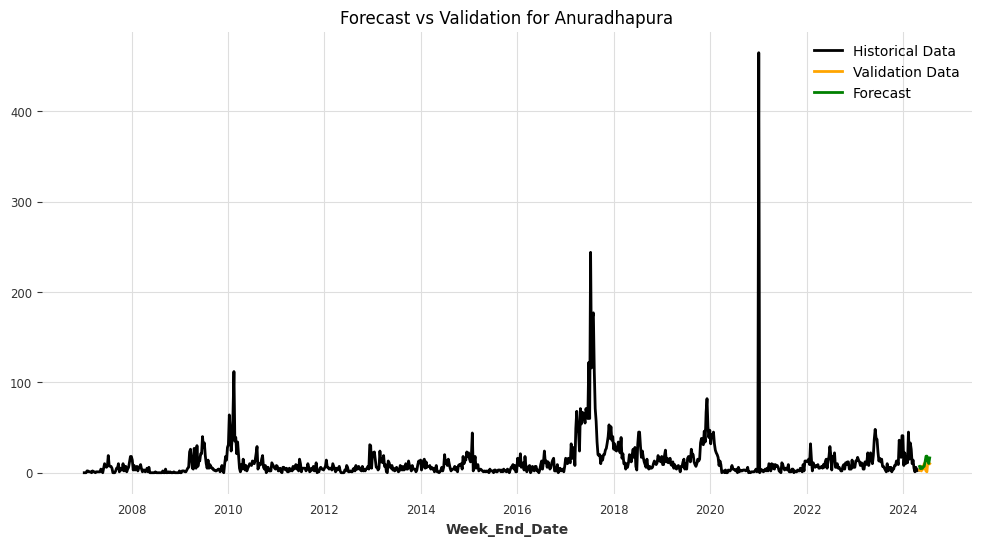

<ipython-input-20-9a1940f4a35d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Badulla: /content/drive/MyDrive/Models/Badulla_RegressionModel.pkl


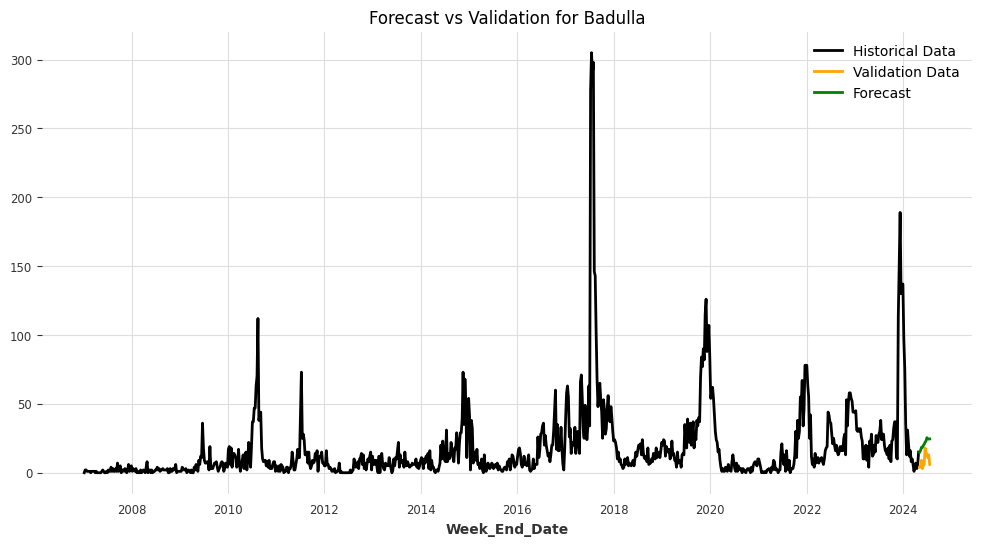

Model saved for /content/drive/MyDrive/Models/Badulla: /content/drive/MyDrive/Models/Badulla_LinearRegressionModel.pkl


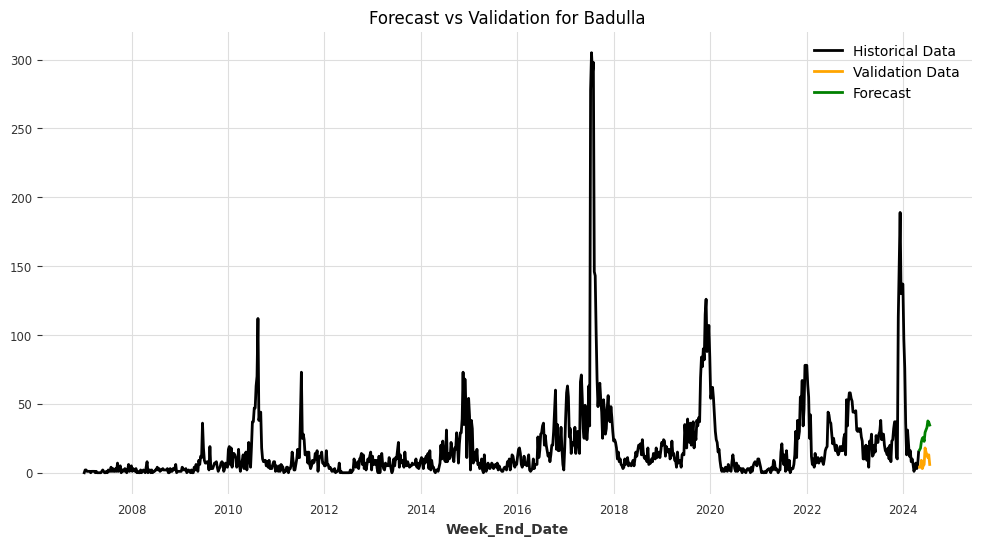

Model saved for /content/drive/MyDrive/Models/Badulla: /content/drive/MyDrive/Models/Badulla_RandomForest.pkl


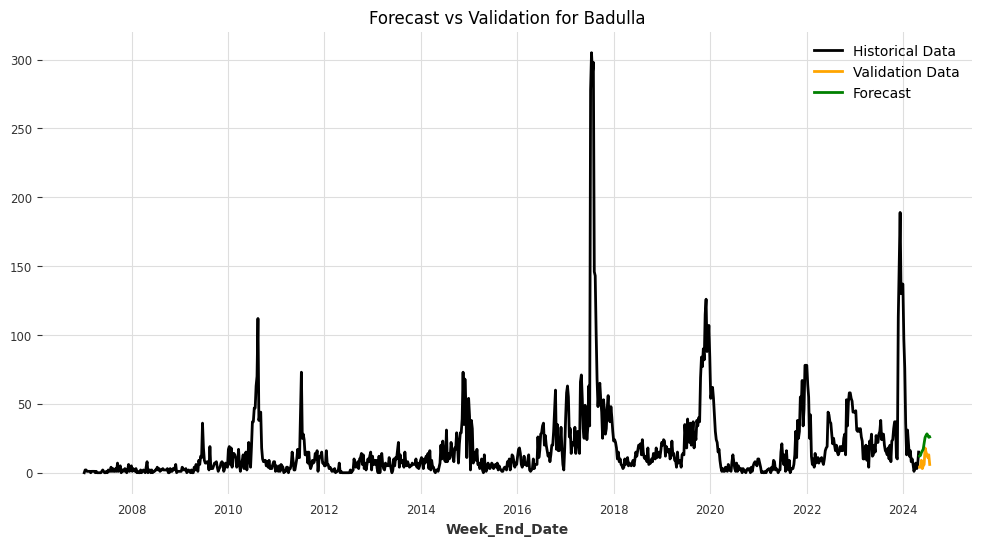

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000449 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7616
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 18.066587
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7616
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 18.079667
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] 

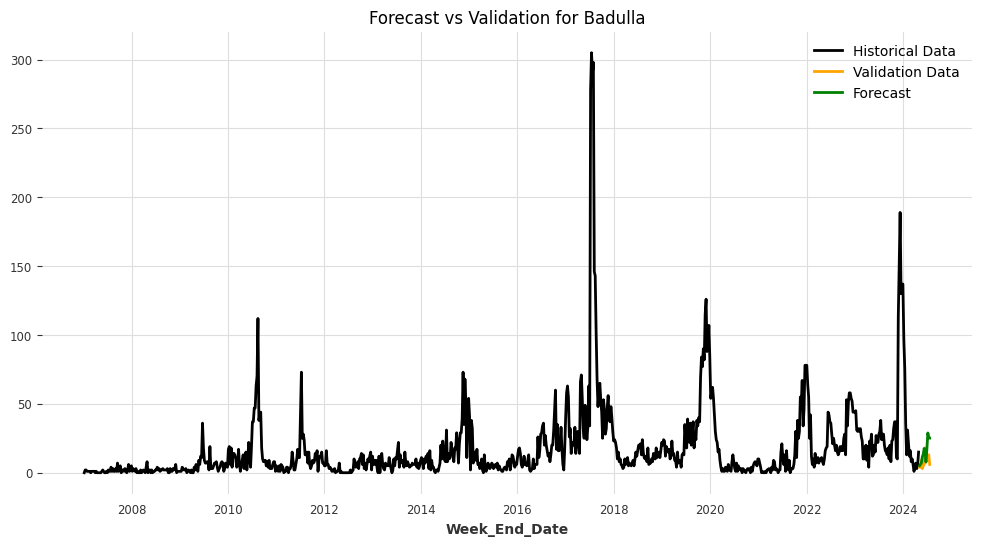

Model saved for /content/drive/MyDrive/Models/Badulla: /content/drive/MyDrive/Models/Badulla_XGBModel.pkl


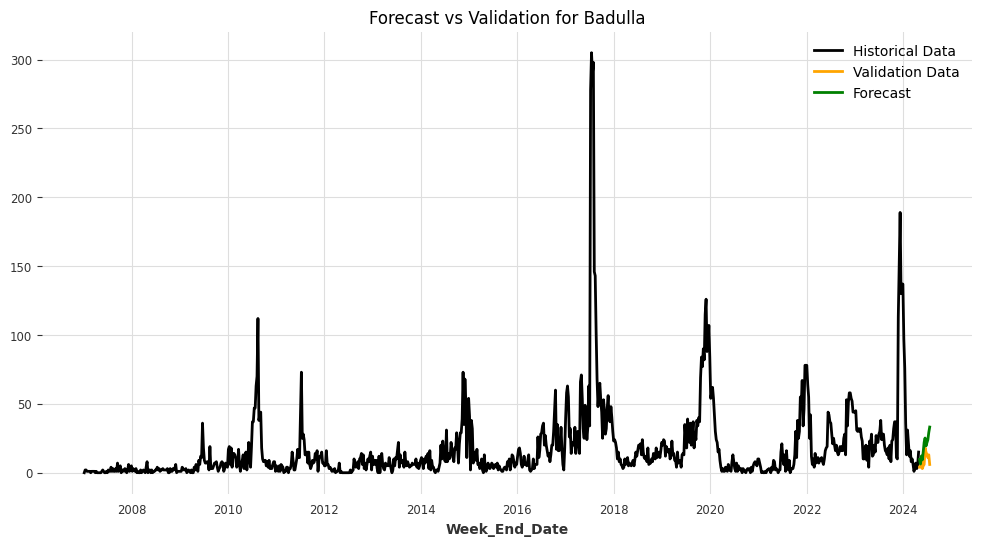

Model saved for /content/drive/MyDrive/Models/Badulla: /content/drive/MyDrive/Models/Badulla_CatBoostModel.pkl


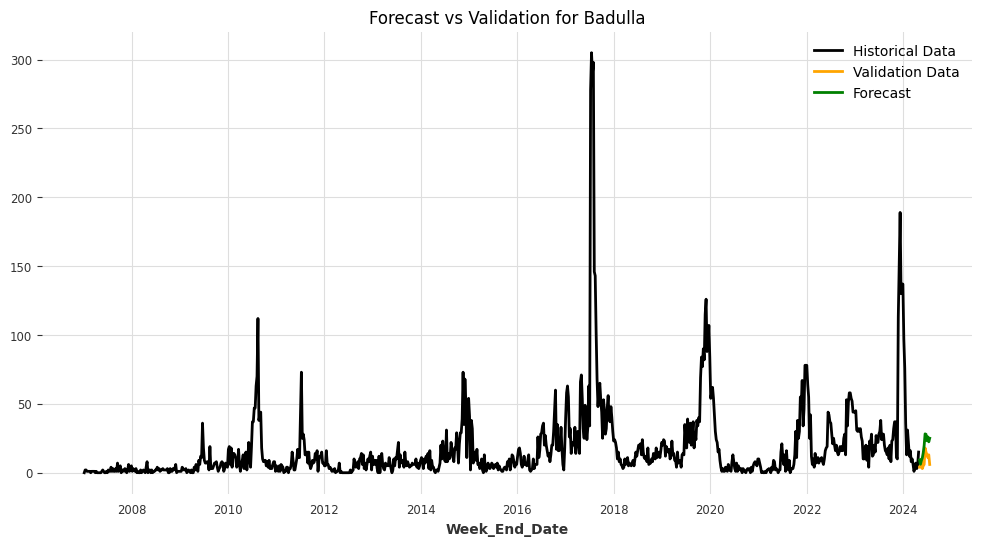

<ipython-input-20-9a1940f4a35d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Batticaloa: /content/drive/MyDrive/Models/Batticaloa_RegressionModel.pkl


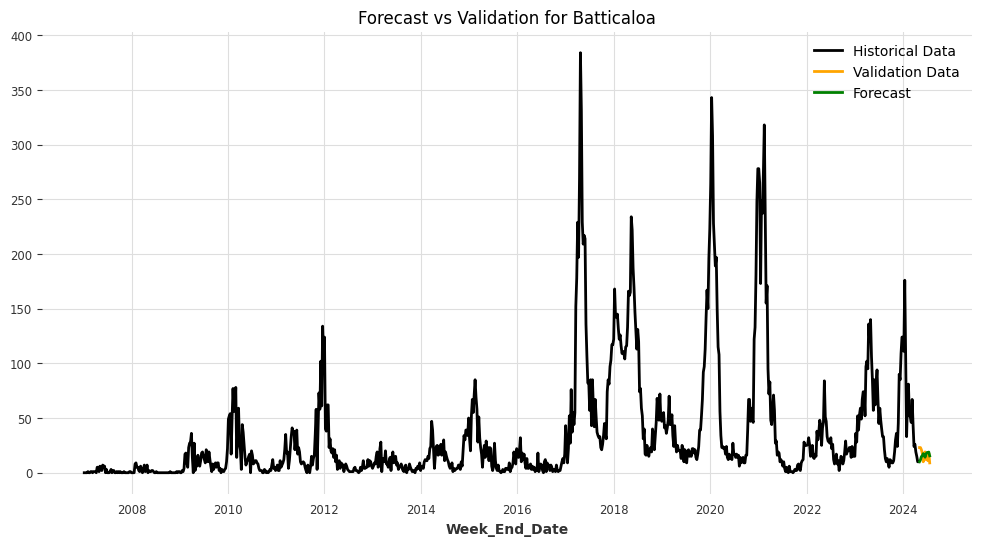

Model saved for /content/drive/MyDrive/Models/Batticaloa: /content/drive/MyDrive/Models/Batticaloa_LinearRegressionModel.pkl


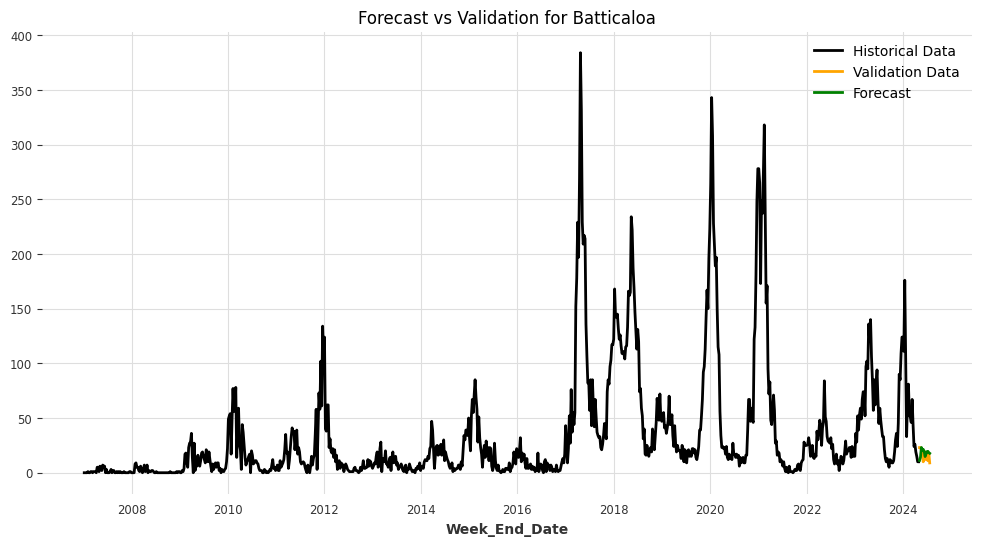

Model saved for /content/drive/MyDrive/Models/Batticaloa: /content/drive/MyDrive/Models/Batticaloa_RandomForest.pkl


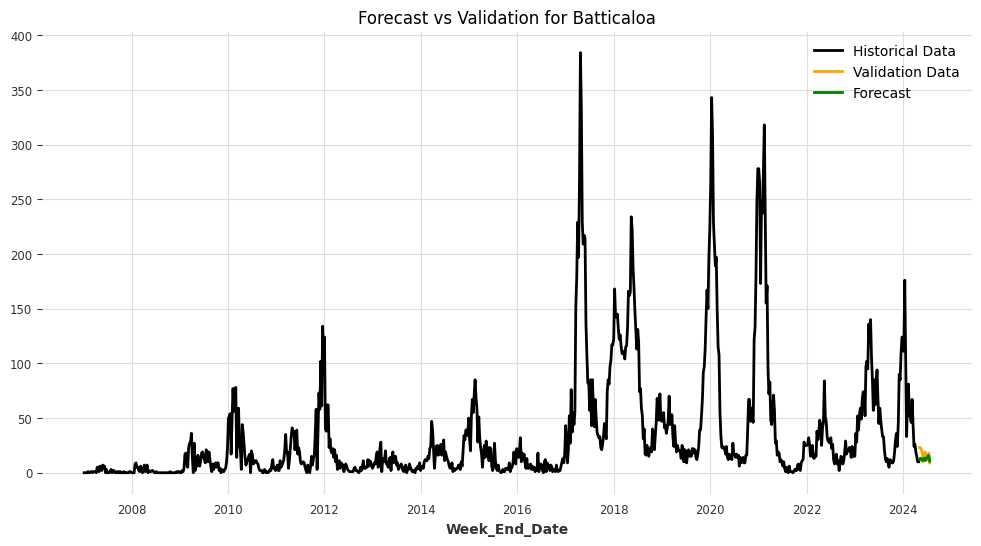

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000439 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7774
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 36.437574
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7774
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 36.499405
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

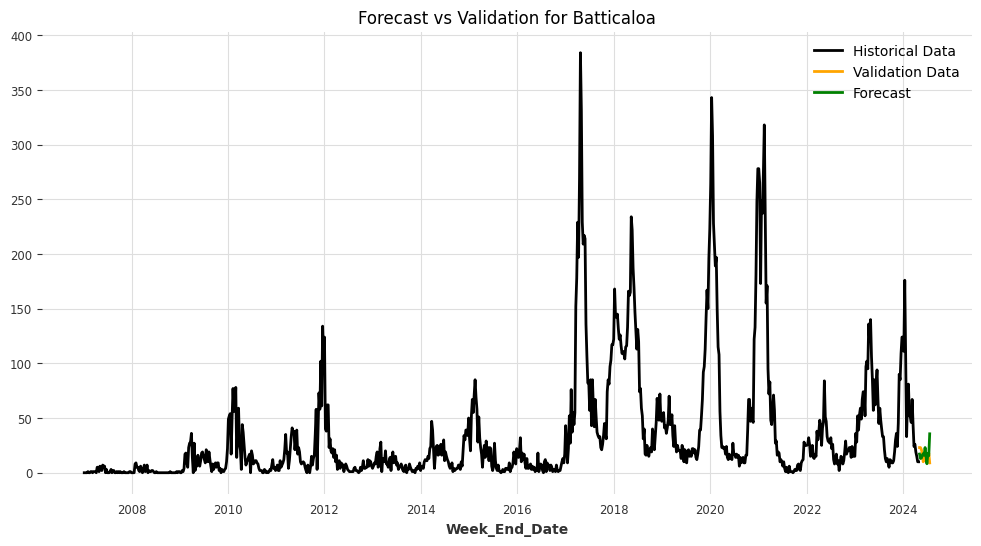

Model saved for /content/drive/MyDrive/Models/Batticaloa: /content/drive/MyDrive/Models/Batticaloa_XGBModel.pkl


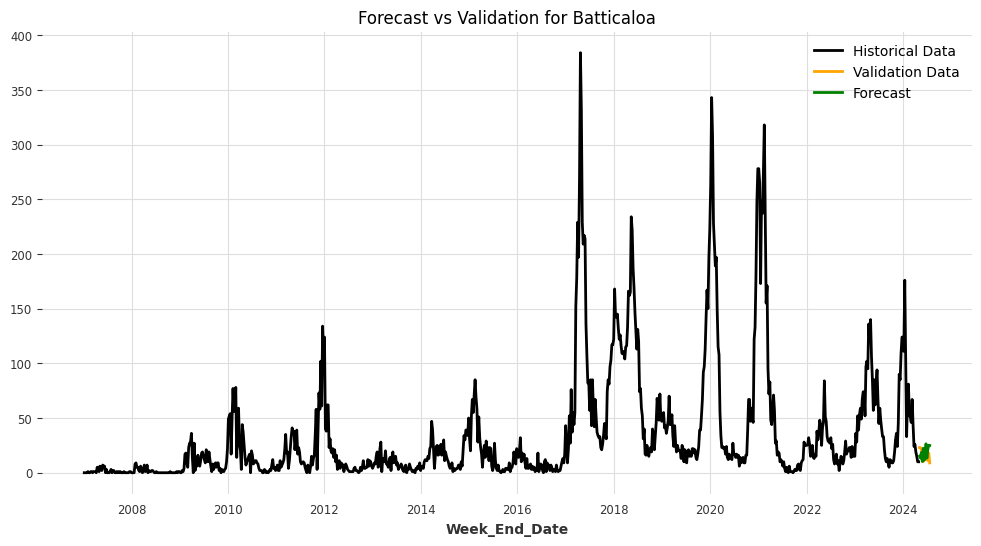

Model saved for /content/drive/MyDrive/Models/Batticaloa: /content/drive/MyDrive/Models/Batticaloa_CatBoostModel.pkl


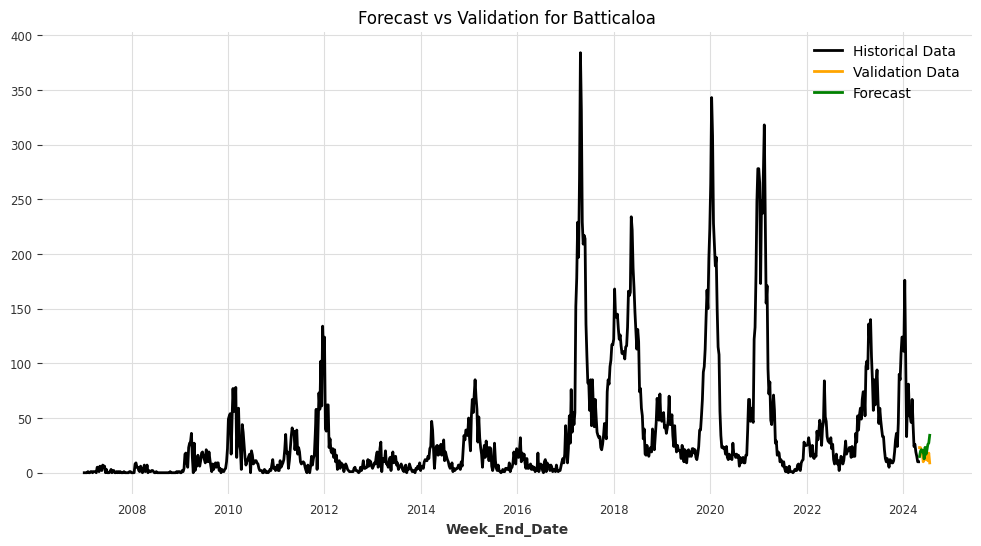

<ipython-input-20-9a1940f4a35d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Colombo: /content/drive/MyDrive/Models/Colombo_RegressionModel.pkl


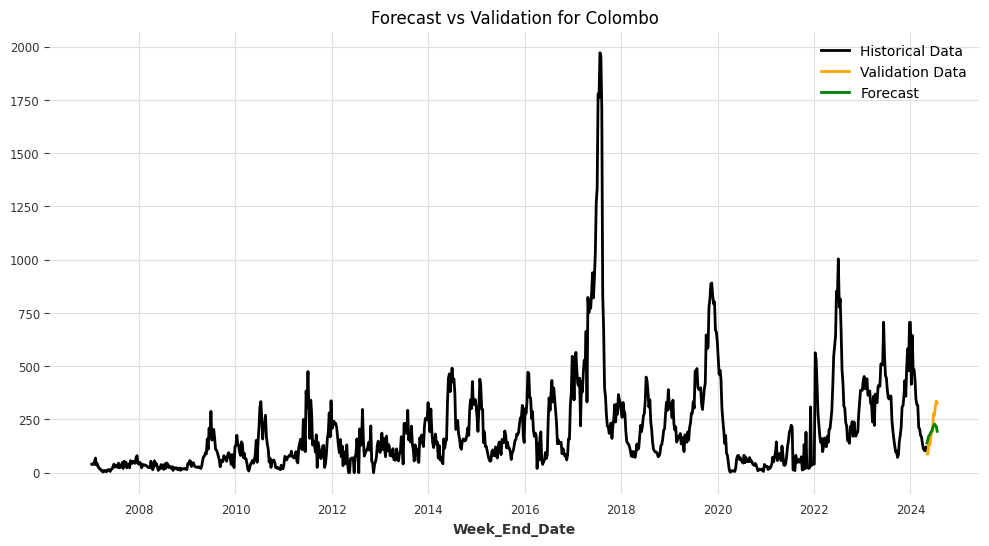

Model saved for /content/drive/MyDrive/Models/Colombo: /content/drive/MyDrive/Models/Colombo_LinearRegressionModel.pkl


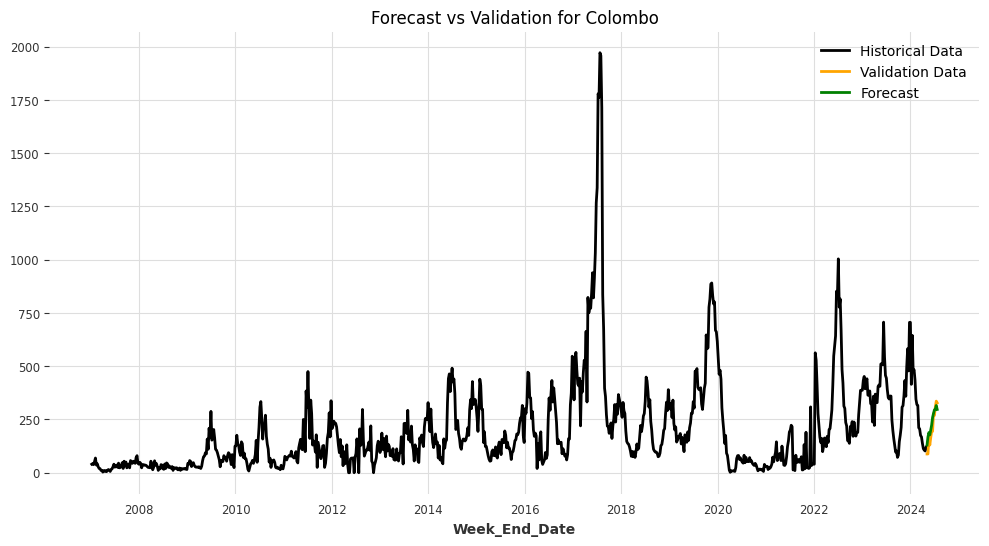

Model saved for /content/drive/MyDrive/Models/Colombo: /content/drive/MyDrive/Models/Colombo_RandomForest.pkl


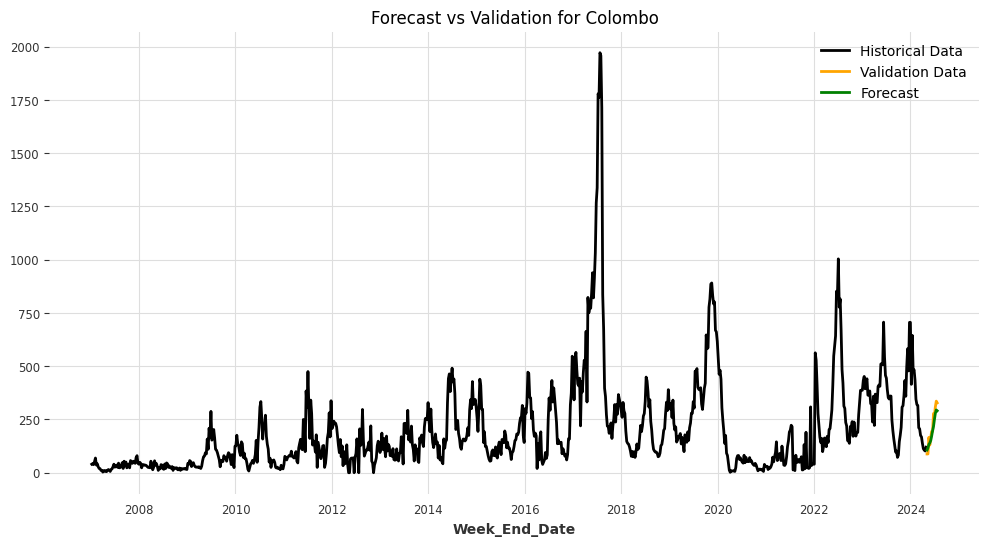

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8325
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 206.502973
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000397 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8325
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 206.825208
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000388 seconds.
You can set `force_col_wise=true` to remove the overhead.
[Lig

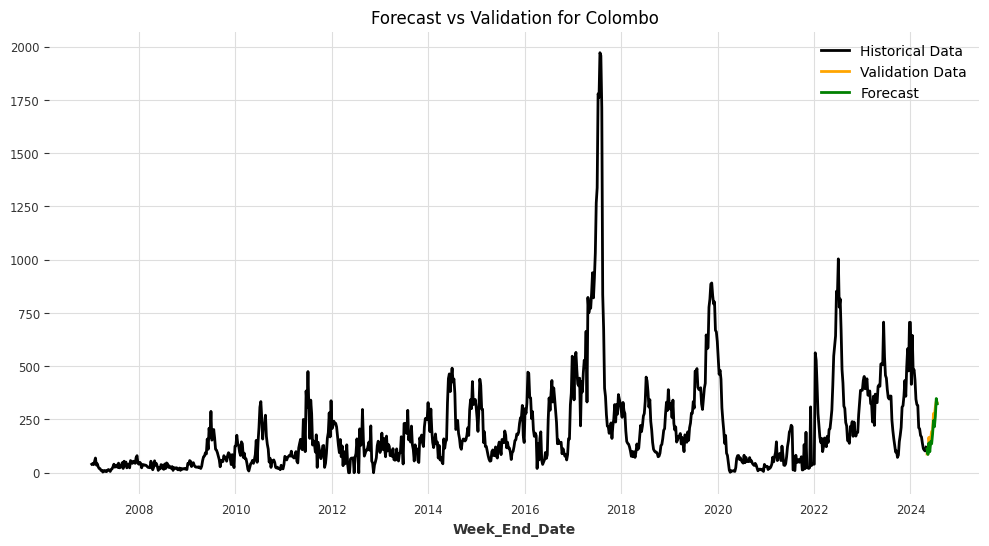

Model saved for /content/drive/MyDrive/Models/Colombo: /content/drive/MyDrive/Models/Colombo_XGBModel.pkl


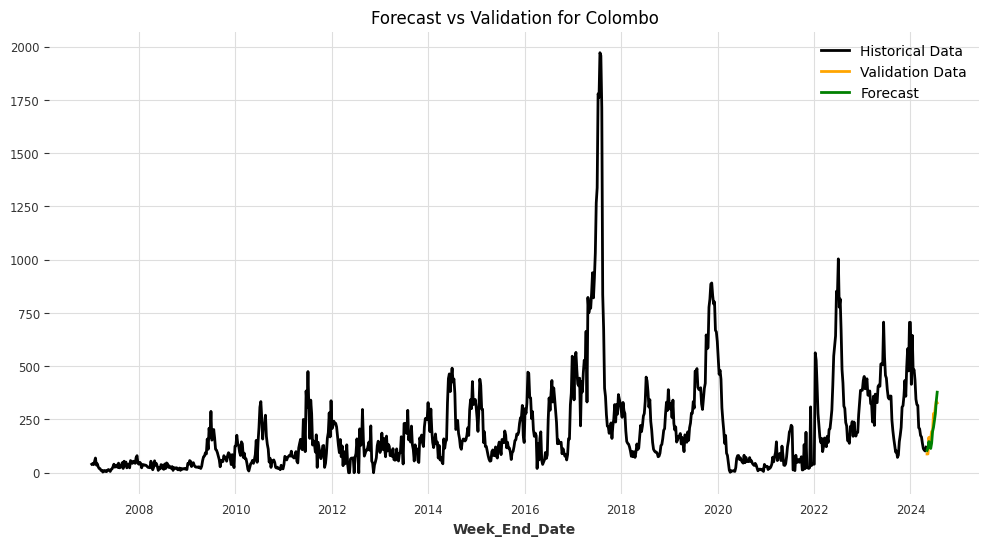

Model saved for /content/drive/MyDrive/Models/Colombo: /content/drive/MyDrive/Models/Colombo_CatBoostModel.pkl


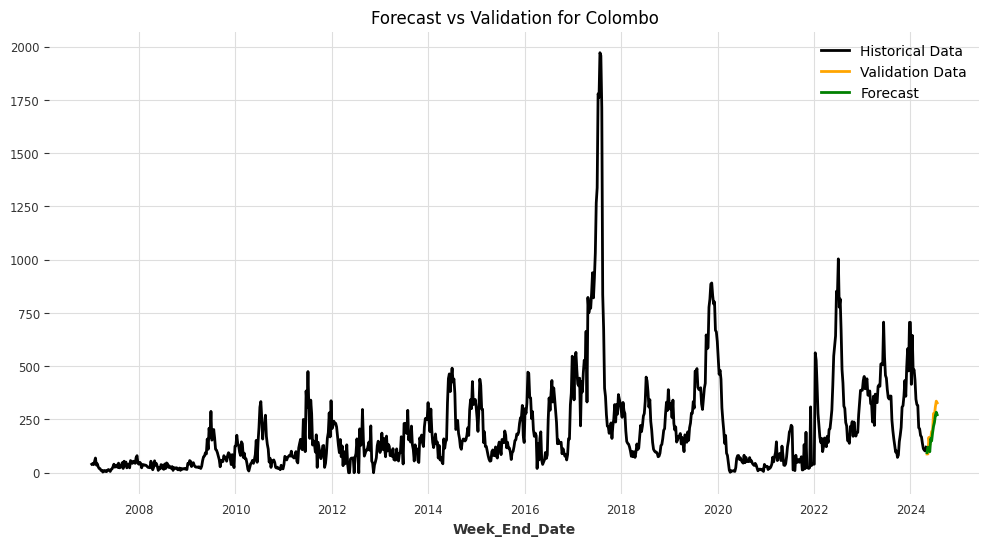

<ipython-input-20-9a1940f4a35d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Galle: /content/drive/MyDrive/Models/Galle_RegressionModel.pkl


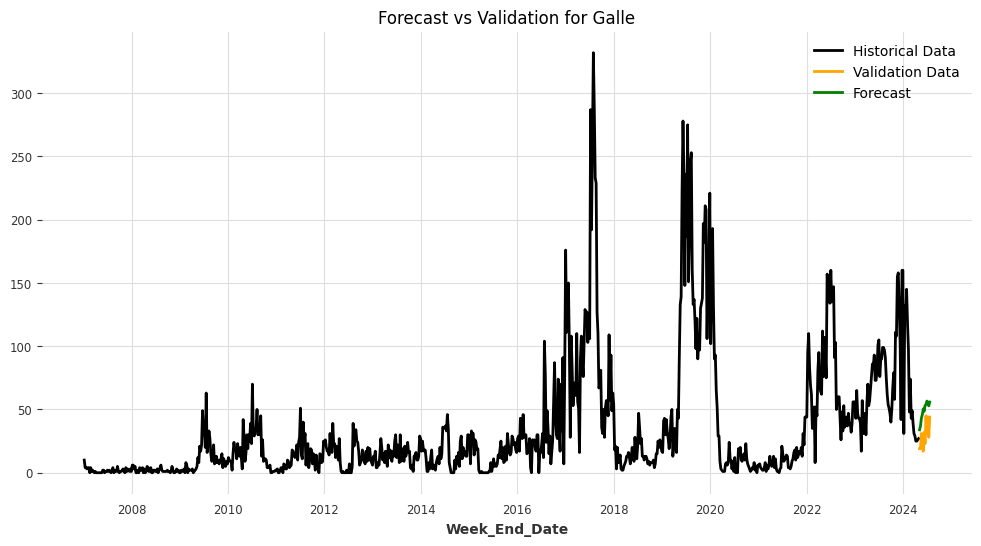

Model saved for /content/drive/MyDrive/Models/Galle: /content/drive/MyDrive/Models/Galle_LinearRegressionModel.pkl


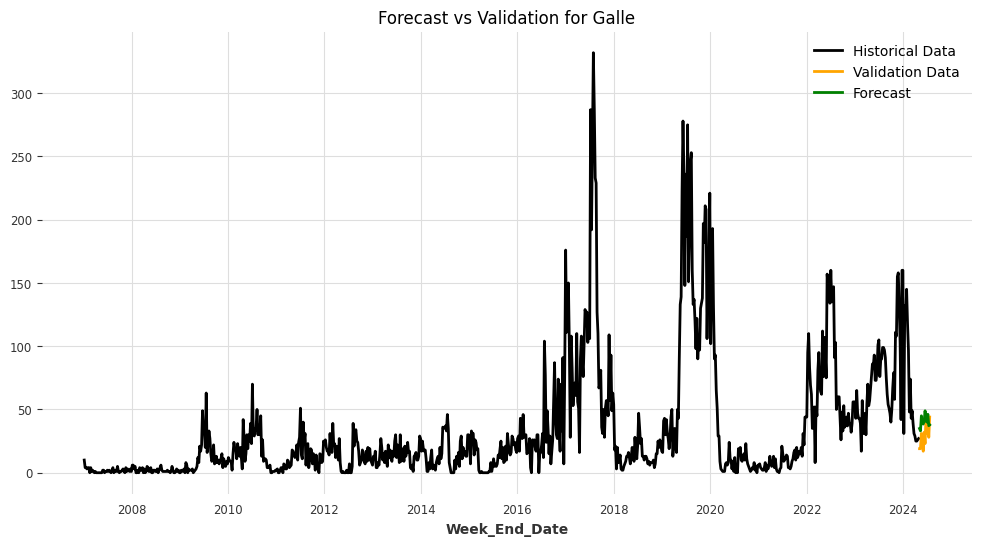

Model saved for /content/drive/MyDrive/Models/Galle: /content/drive/MyDrive/Models/Galle_RandomForest.pkl


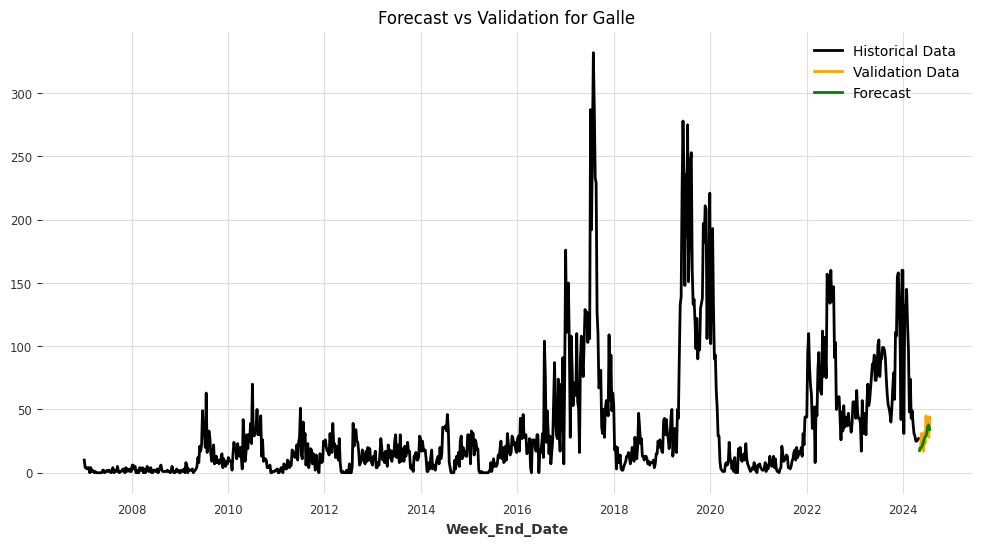

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7637
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 35.386445
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000692 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7637
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 35.436385
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.00031

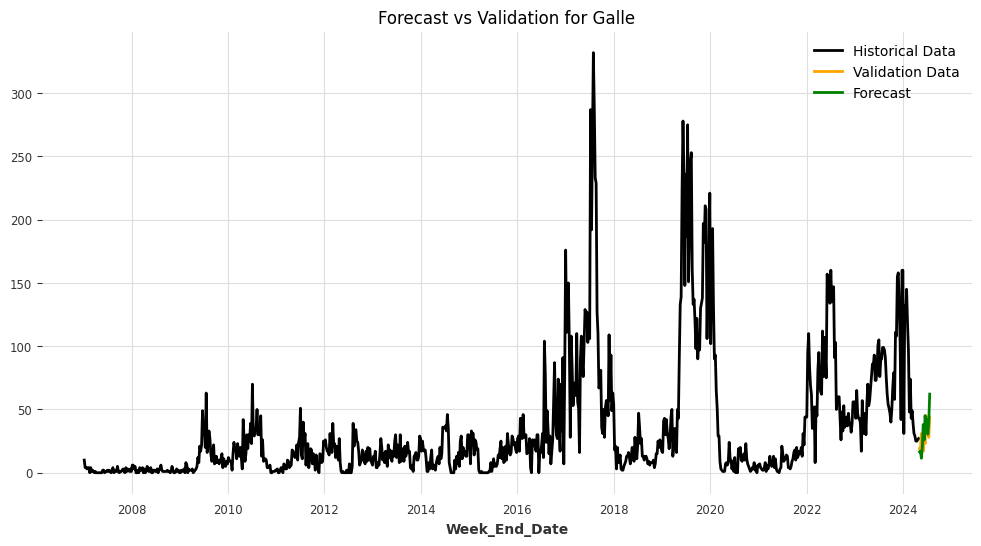

Model saved for /content/drive/MyDrive/Models/Galle: /content/drive/MyDrive/Models/Galle_XGBModel.pkl


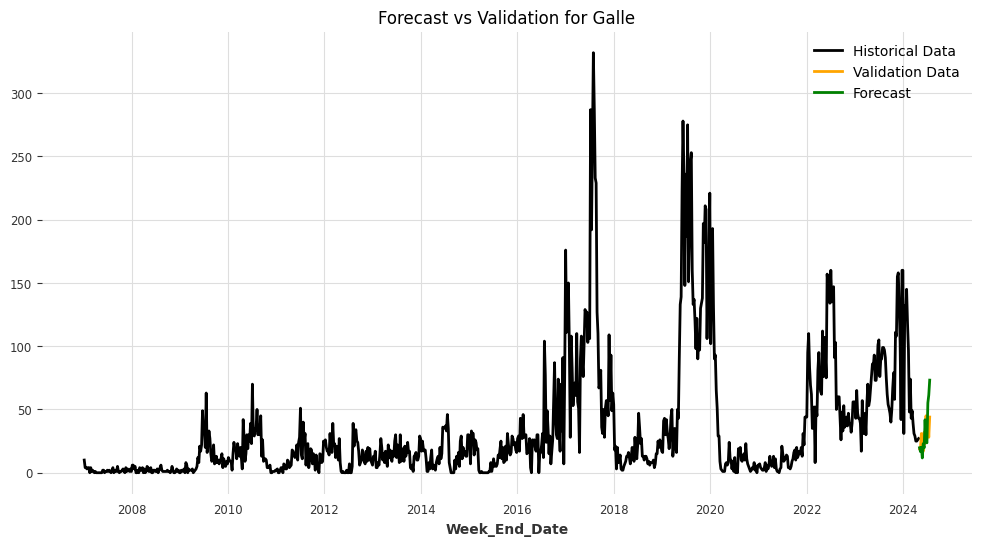

Model saved for /content/drive/MyDrive/Models/Galle: /content/drive/MyDrive/Models/Galle_CatBoostModel.pkl


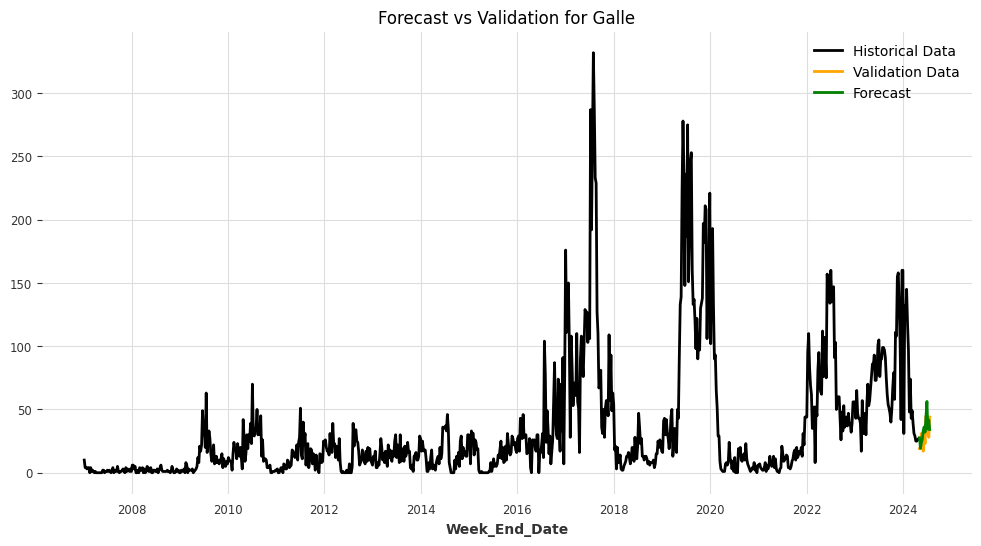

<ipython-input-20-9a1940f4a35d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Gampaha: /content/drive/MyDrive/Models/Gampaha_RegressionModel.pkl


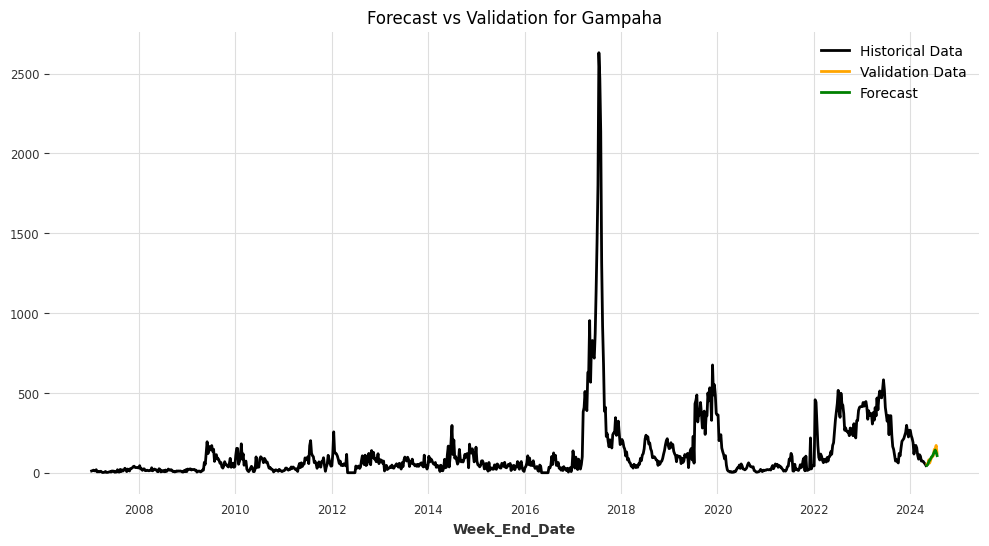

Model saved for /content/drive/MyDrive/Models/Gampaha: /content/drive/MyDrive/Models/Gampaha_LinearRegressionModel.pkl


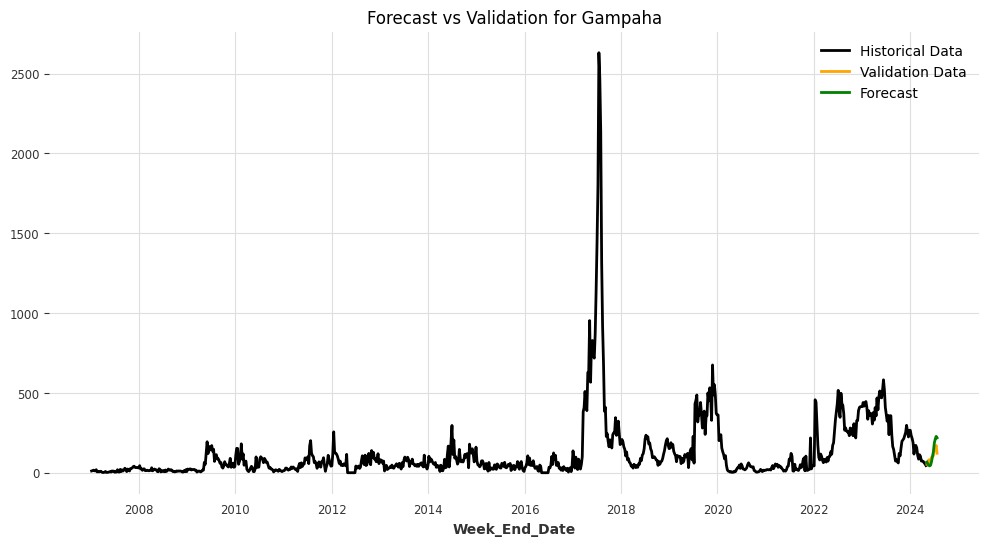

Model saved for /content/drive/MyDrive/Models/Gampaha: /content/drive/MyDrive/Models/Gampaha_RandomForest.pkl


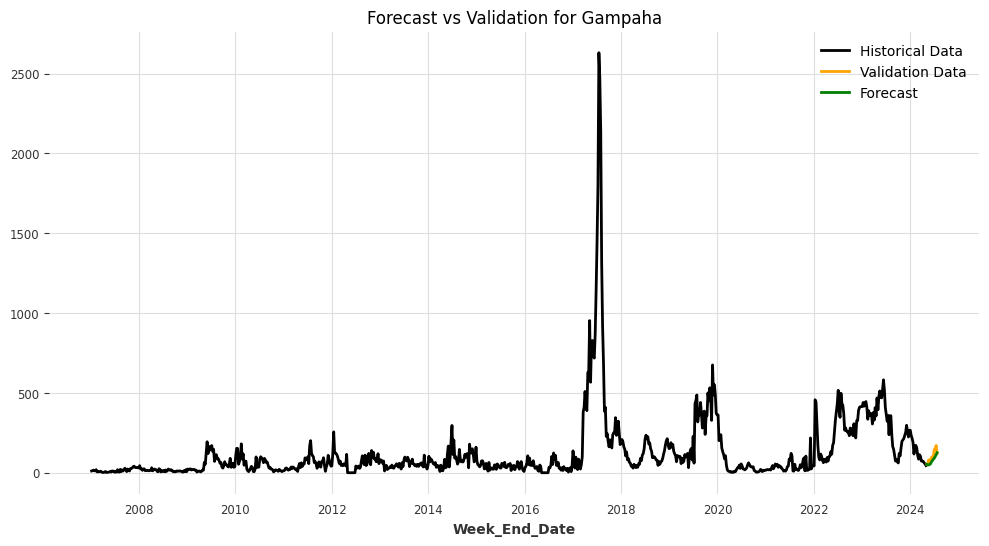

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000735 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8305
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 128.568371
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000674 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8305
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 128.701546
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000660 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 8305
[LightGBM] [Info] Number of data points in th

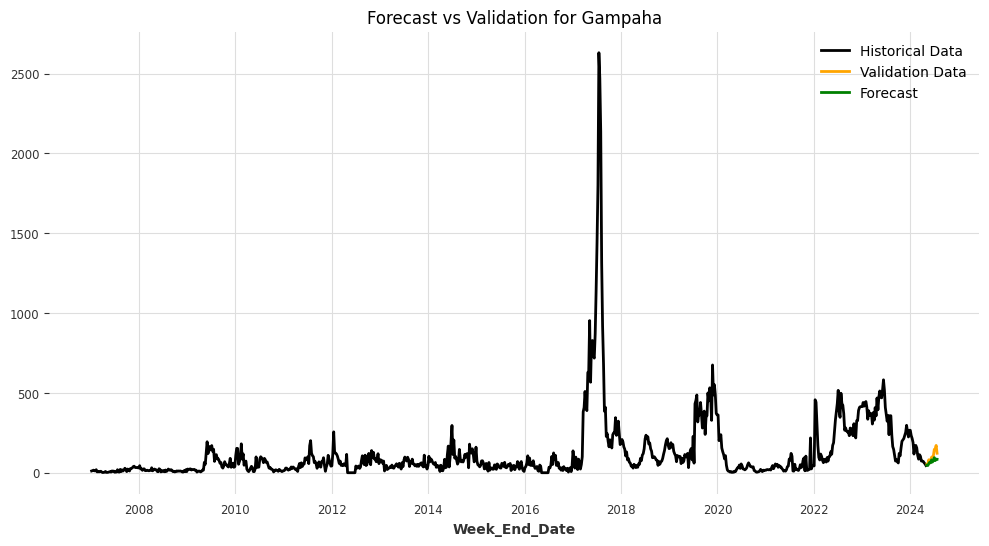

Model saved for /content/drive/MyDrive/Models/Gampaha: /content/drive/MyDrive/Models/Gampaha_XGBModel.pkl


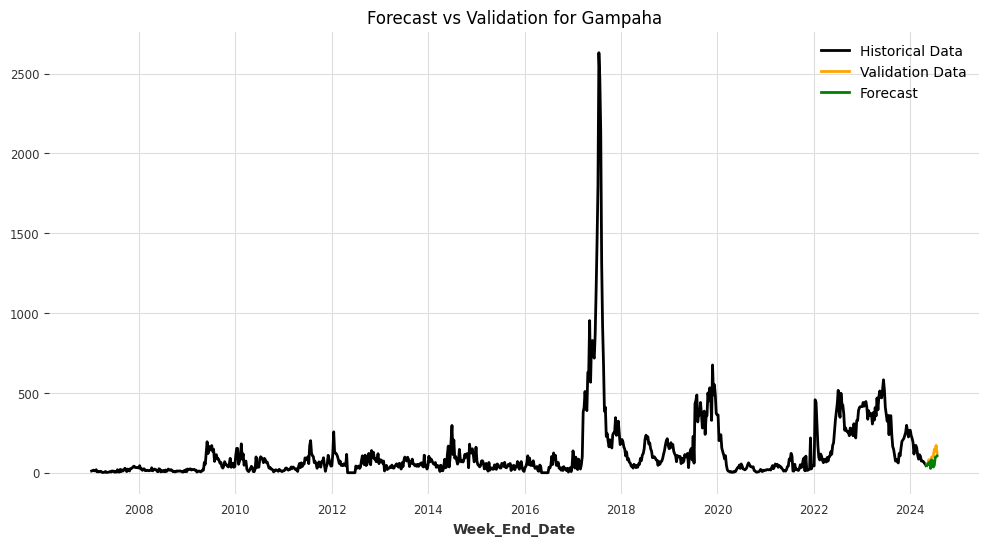

Model saved for /content/drive/MyDrive/Models/Gampaha: /content/drive/MyDrive/Models/Gampaha_CatBoostModel.pkl


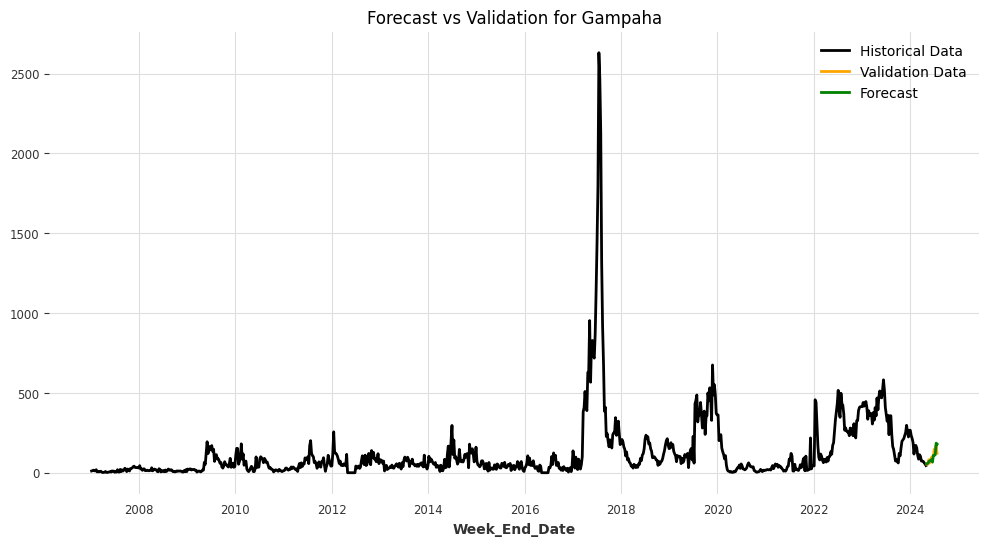

<ipython-input-20-9a1940f4a35d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Hambantota: /content/drive/MyDrive/Models/Hambantota_RegressionModel.pkl


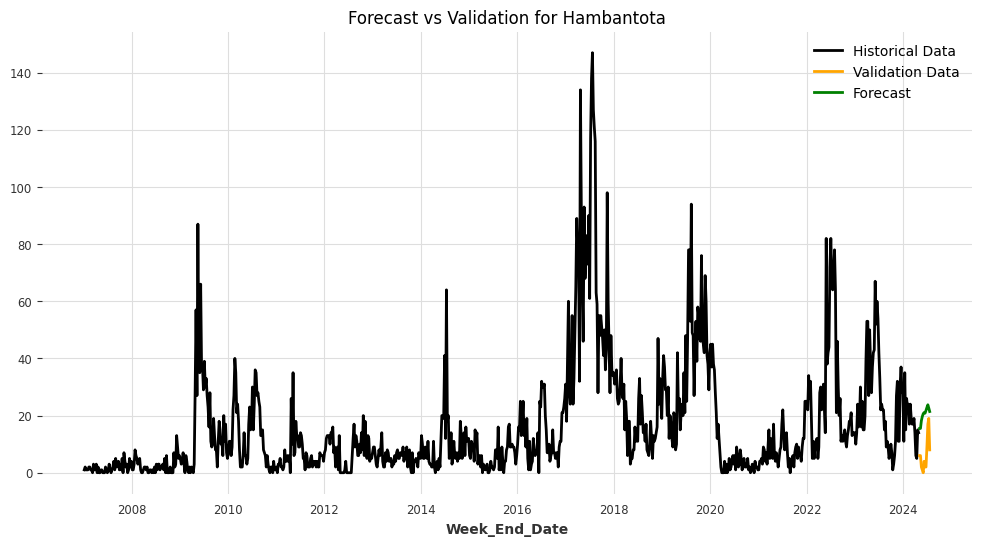

Model saved for /content/drive/MyDrive/Models/Hambantota: /content/drive/MyDrive/Models/Hambantota_LinearRegressionModel.pkl


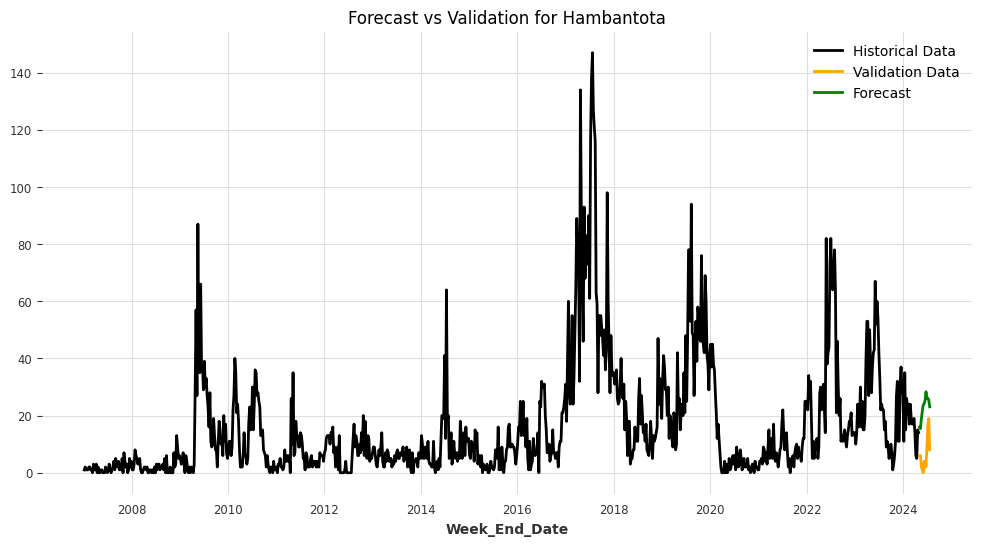

Model saved for /content/drive/MyDrive/Models/Hambantota: /content/drive/MyDrive/Models/Hambantota_RandomForest.pkl


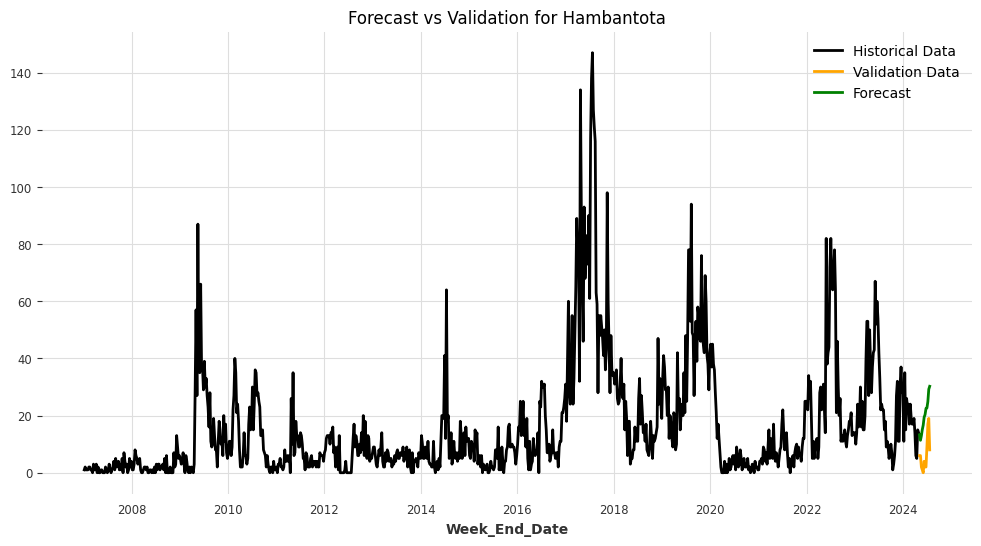

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000472 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7527
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 16.916766
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000450 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7527
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 16.935791
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

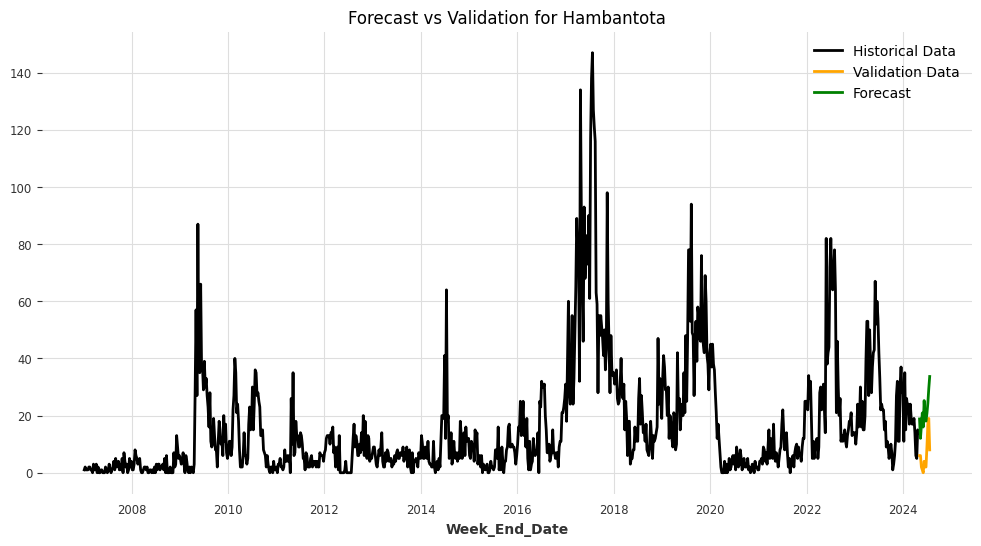

Model saved for /content/drive/MyDrive/Models/Hambantota: /content/drive/MyDrive/Models/Hambantota_XGBModel.pkl


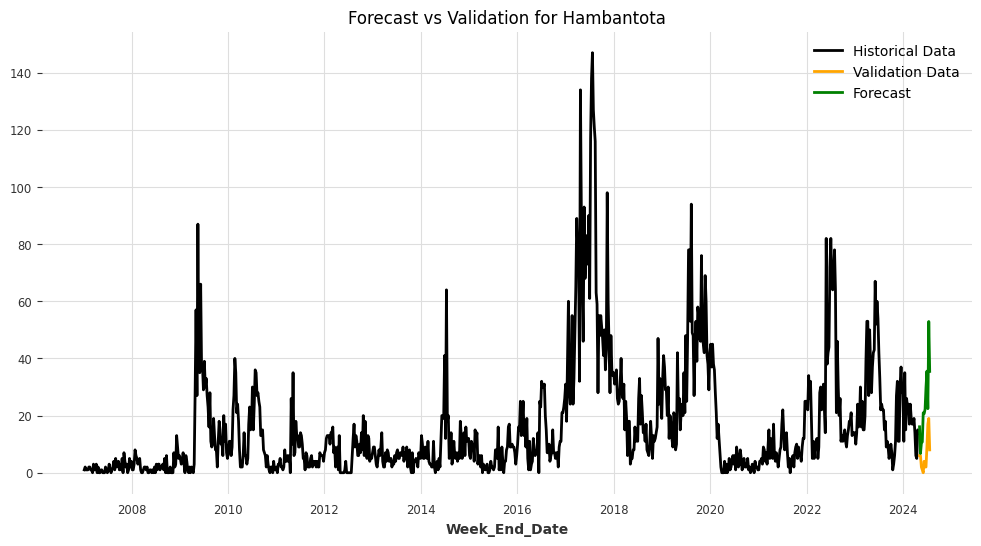

Model saved for /content/drive/MyDrive/Models/Hambantota: /content/drive/MyDrive/Models/Hambantota_CatBoostModel.pkl


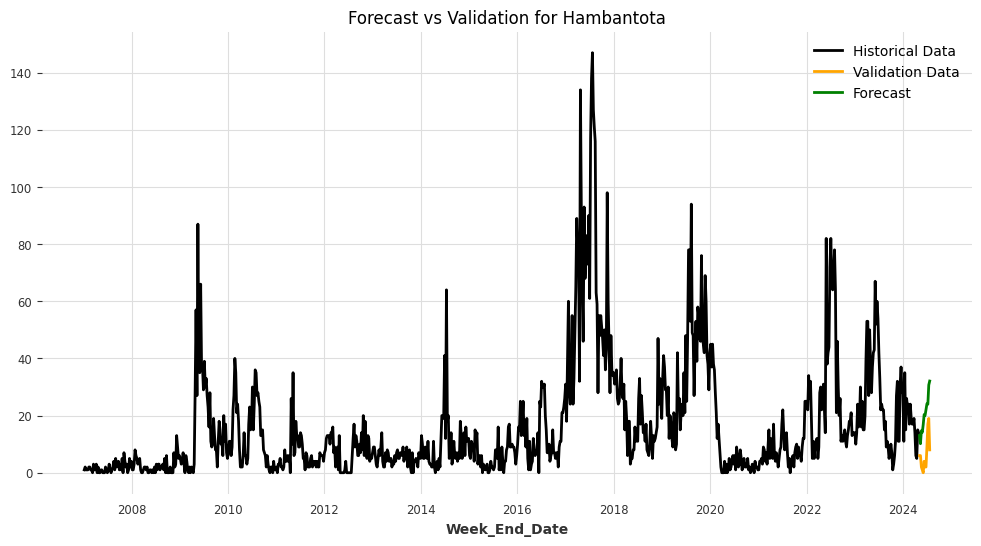

<ipython-input-20-9a1940f4a35d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Jaffna: /content/drive/MyDrive/Models/Jaffna_RegressionModel.pkl


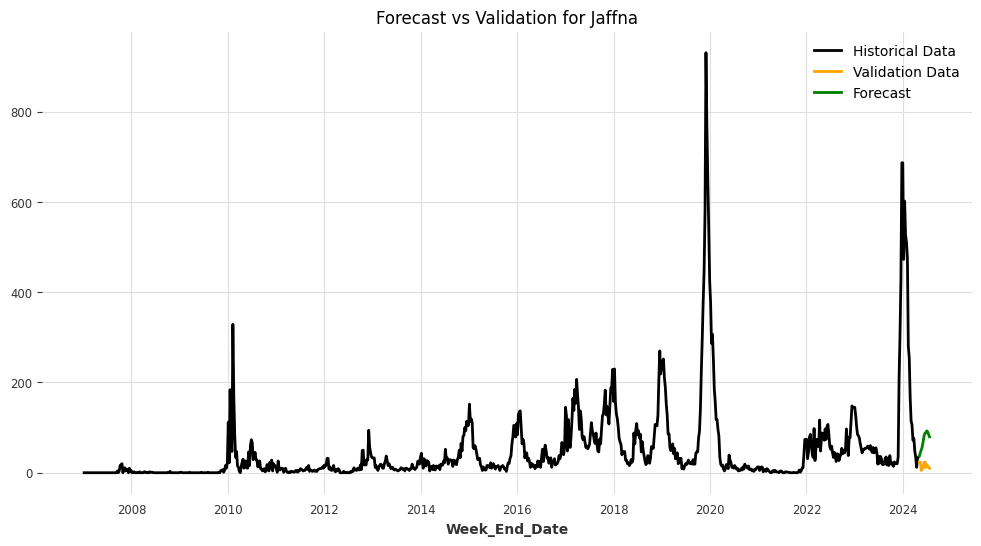

Model saved for /content/drive/MyDrive/Models/Jaffna: /content/drive/MyDrive/Models/Jaffna_LinearRegressionModel.pkl


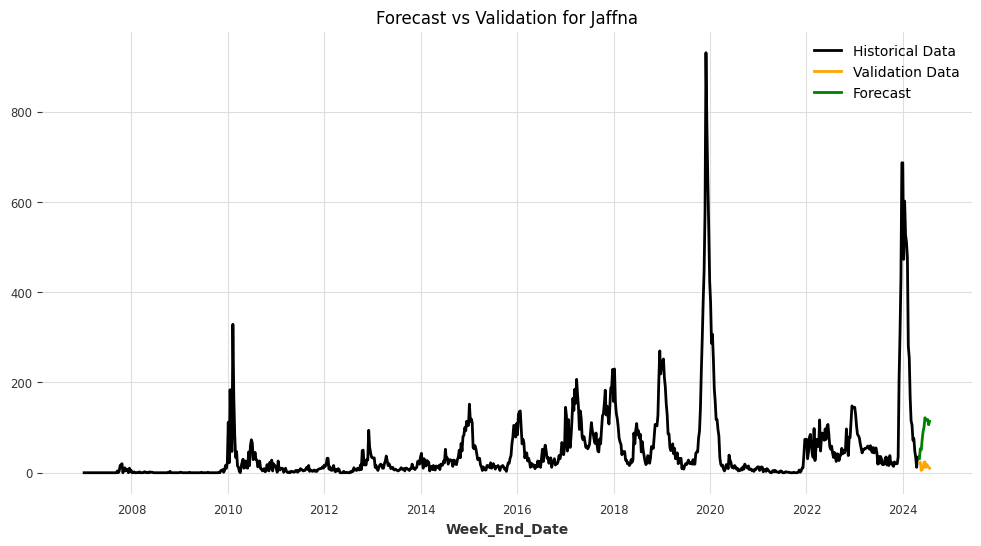

Model saved for /content/drive/MyDrive/Models/Jaffna: /content/drive/MyDrive/Models/Jaffna_RandomForest.pkl


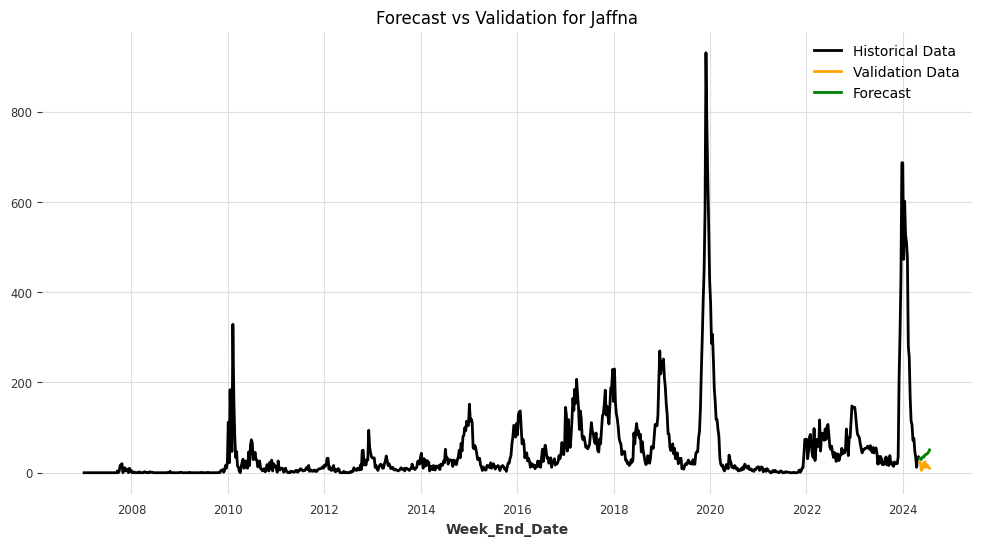

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000419 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7868
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 48.807372
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000408 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7868
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 49.110583
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000662 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7868
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start trainin

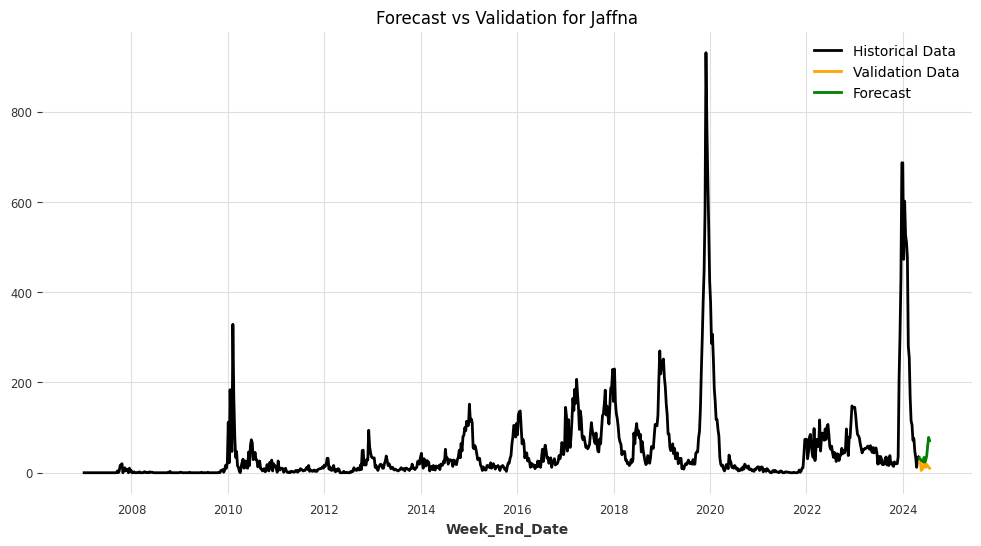

Model saved for /content/drive/MyDrive/Models/Jaffna: /content/drive/MyDrive/Models/Jaffna_XGBModel.pkl


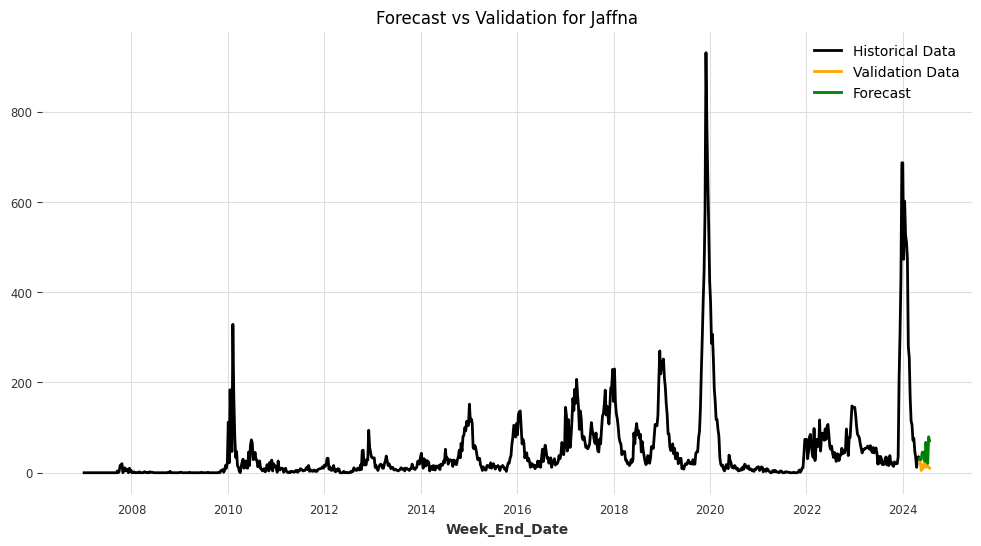

Model saved for /content/drive/MyDrive/Models/Jaffna: /content/drive/MyDrive/Models/Jaffna_CatBoostModel.pkl


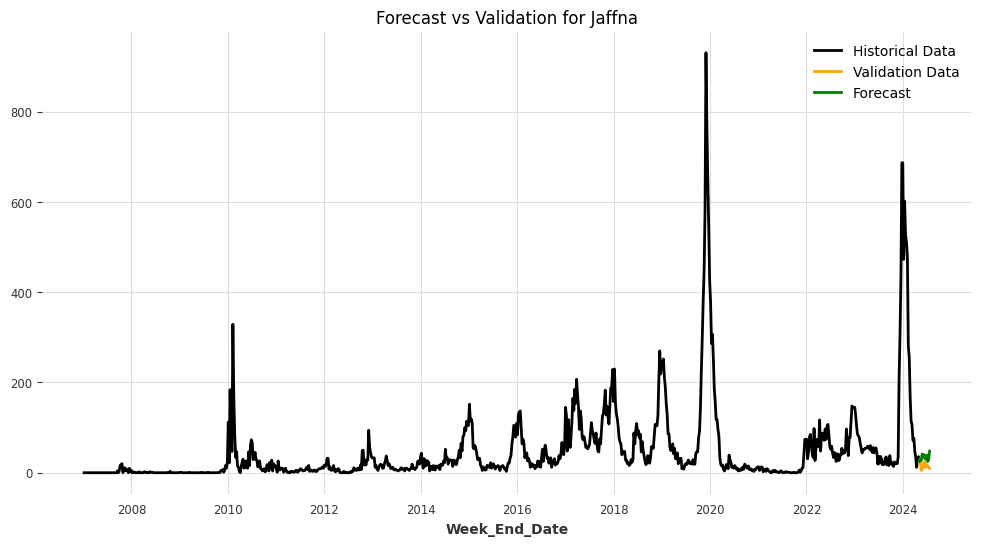

<ipython-input-20-9a1940f4a35d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Kalutara: /content/drive/MyDrive/Models/Kalutara_RegressionModel.pkl


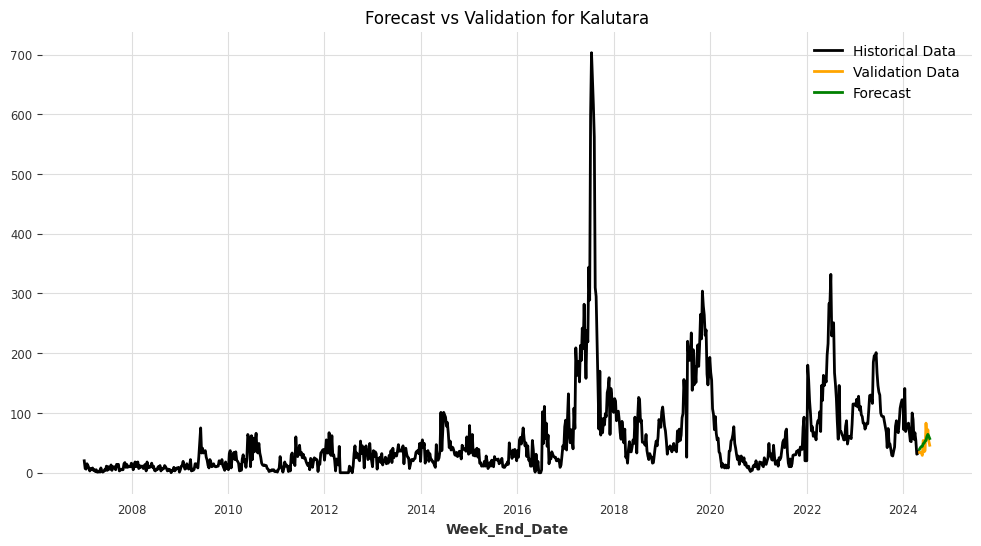

Model saved for /content/drive/MyDrive/Models/Kalutara: /content/drive/MyDrive/Models/Kalutara_LinearRegressionModel.pkl


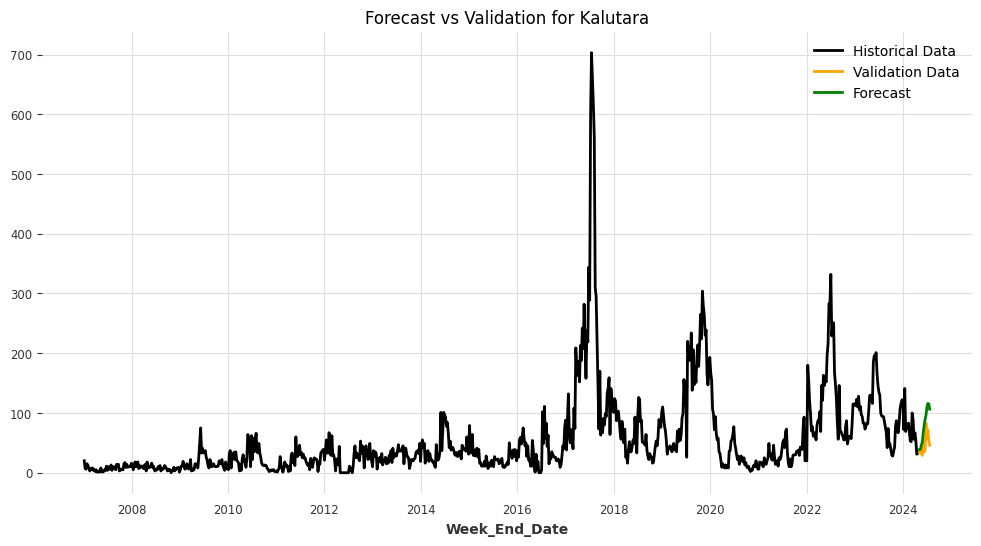

Model saved for /content/drive/MyDrive/Models/Kalutara: /content/drive/MyDrive/Models/Kalutara_RandomForest.pkl


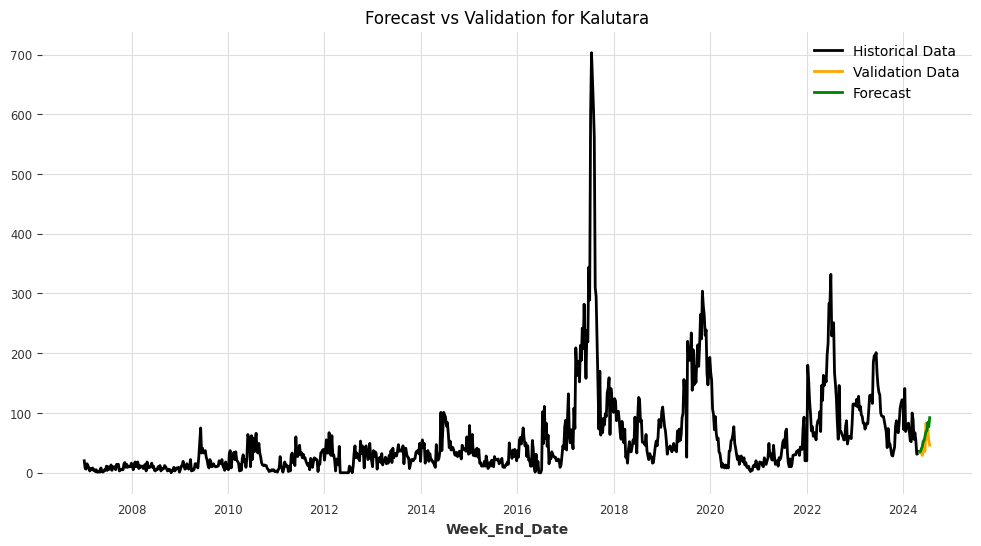

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000833 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7792
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 56.073722
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000436 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7792
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 56.139120
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000699 seconds.
You can set `force_col_wise=true` to remove the overhead.
[Light

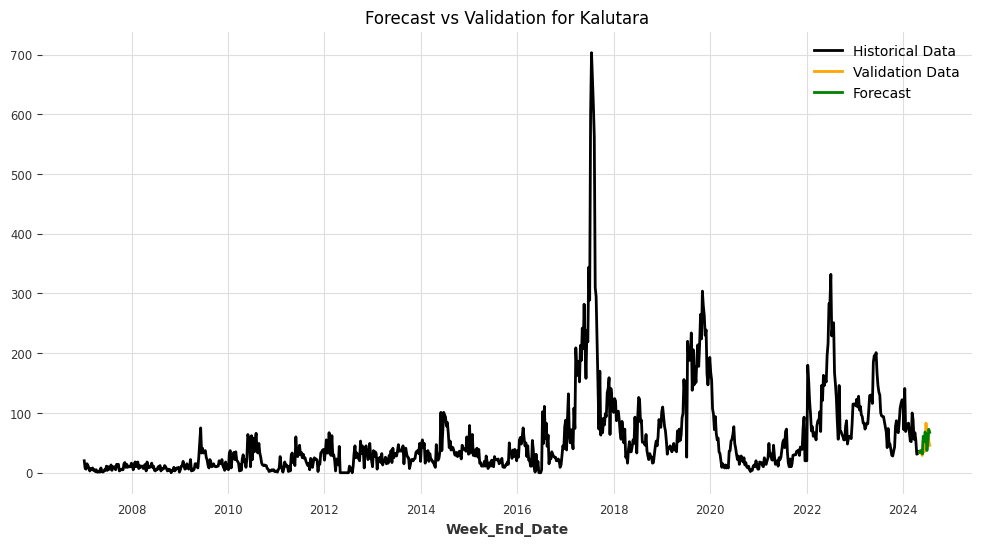

Model saved for /content/drive/MyDrive/Models/Kalutara: /content/drive/MyDrive/Models/Kalutara_XGBModel.pkl


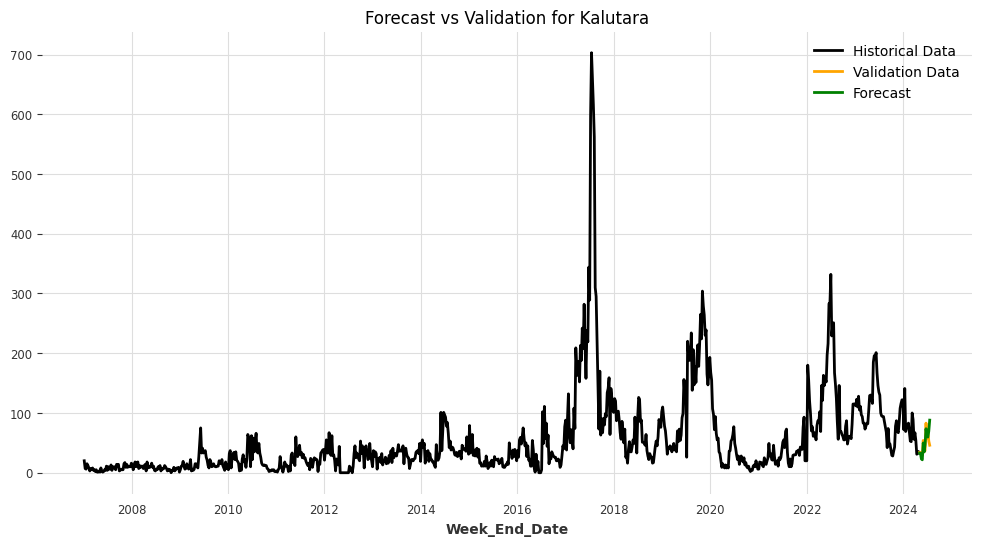

Model saved for /content/drive/MyDrive/Models/Kalutara: /content/drive/MyDrive/Models/Kalutara_CatBoostModel.pkl


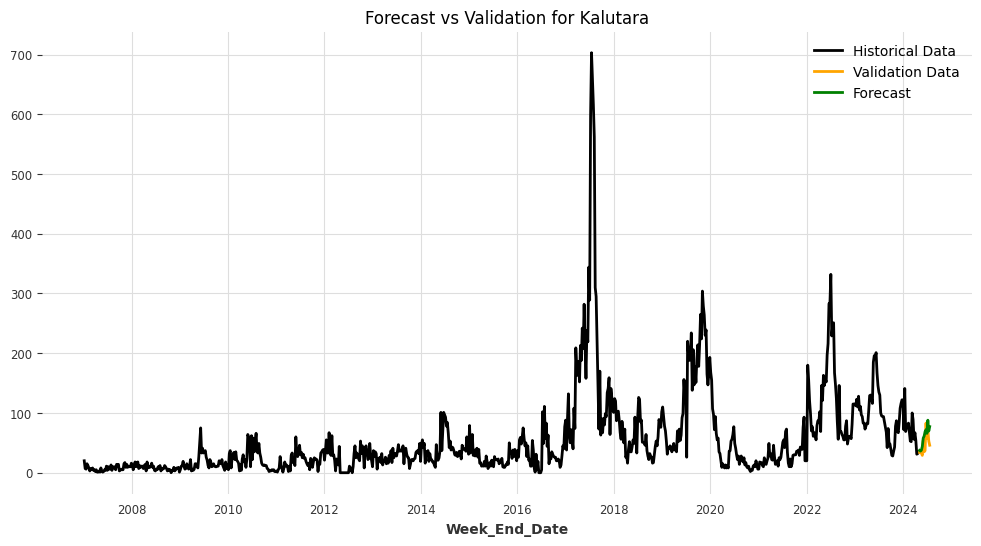

<ipython-input-20-9a1940f4a35d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Kandy: /content/drive/MyDrive/Models/Kandy_RegressionModel.pkl


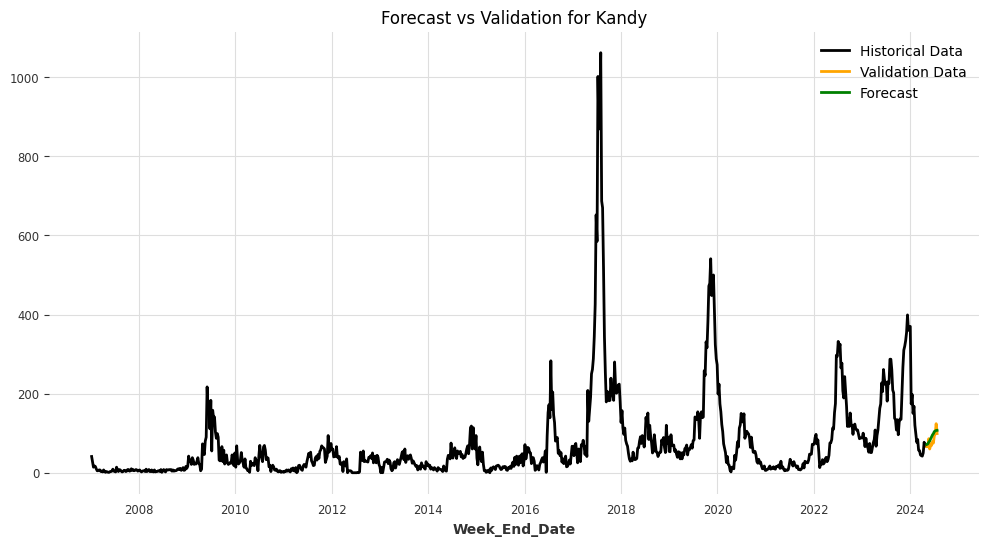

Model saved for /content/drive/MyDrive/Models/Kandy: /content/drive/MyDrive/Models/Kandy_LinearRegressionModel.pkl


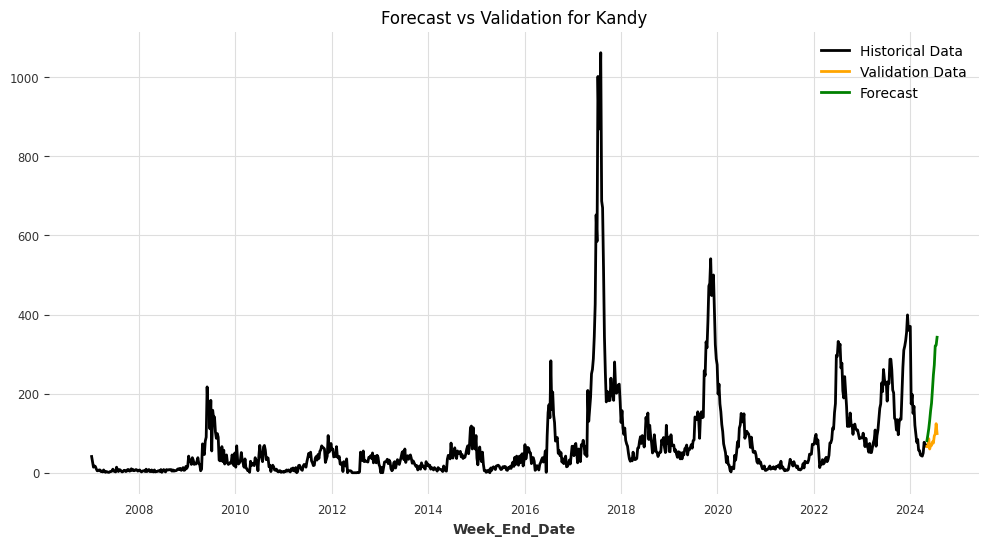

Model saved for /content/drive/MyDrive/Models/Kandy: /content/drive/MyDrive/Models/Kandy_RandomForest.pkl


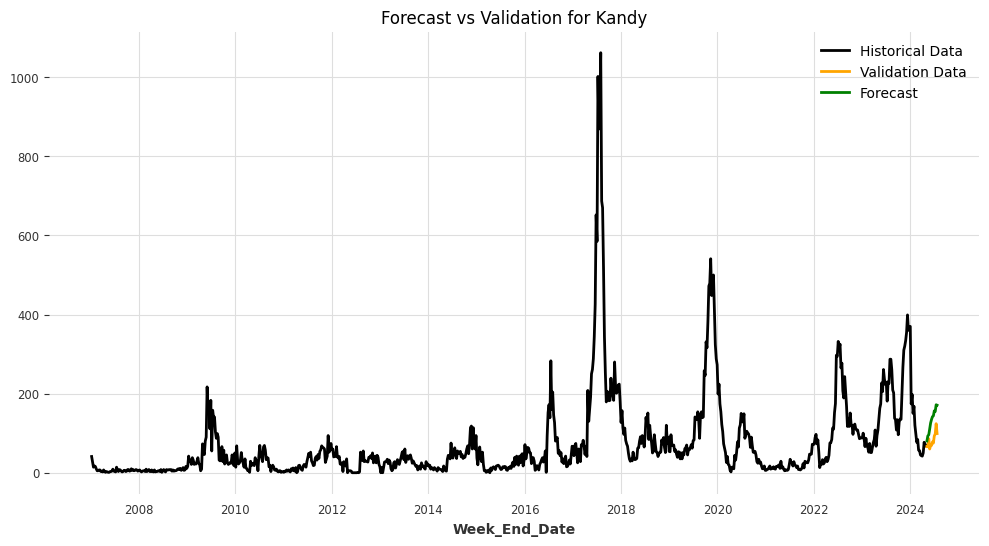

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000676 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7899
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 74.939358
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000202 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7899
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 75.022592
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000720 seconds.


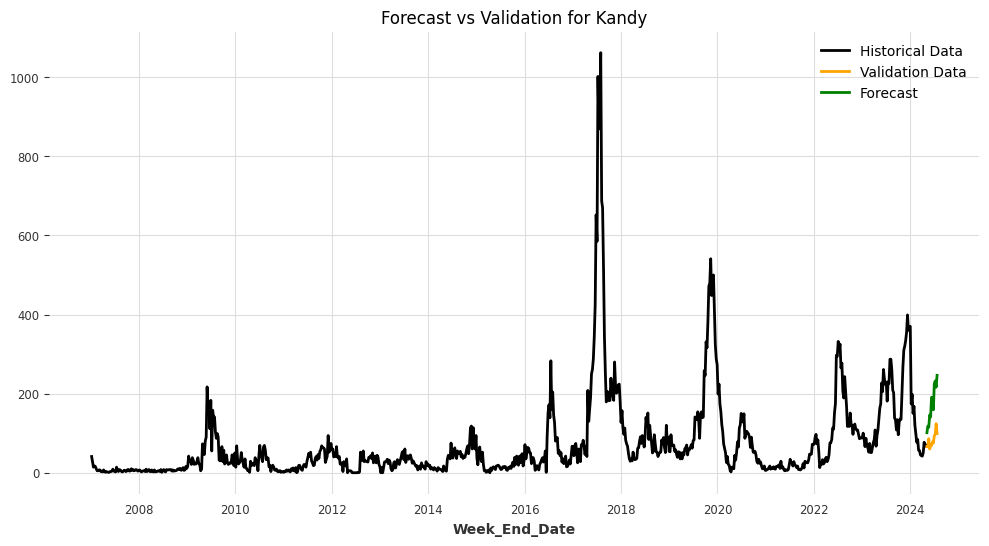

Model saved for /content/drive/MyDrive/Models/Kandy: /content/drive/MyDrive/Models/Kandy_XGBModel.pkl


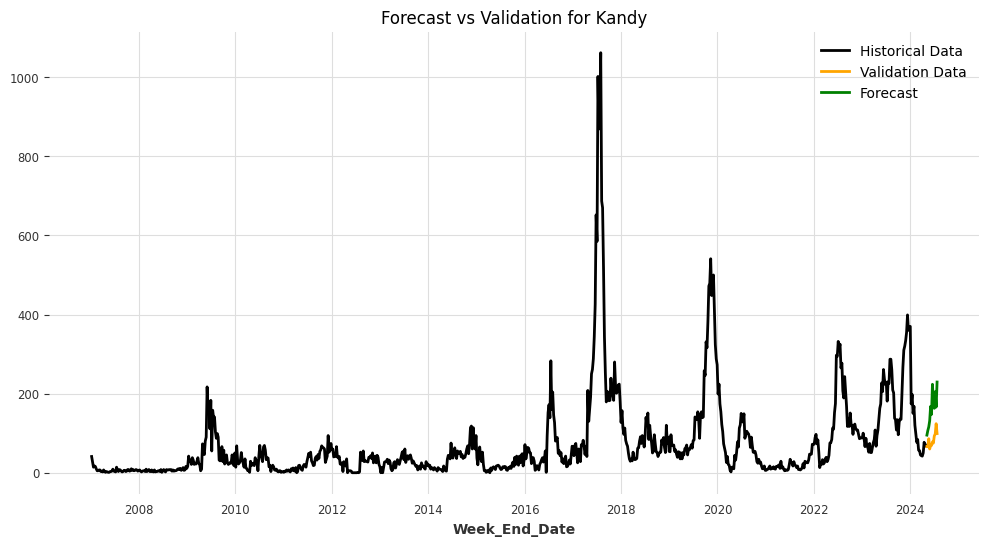

Model saved for /content/drive/MyDrive/Models/Kandy: /content/drive/MyDrive/Models/Kandy_CatBoostModel.pkl


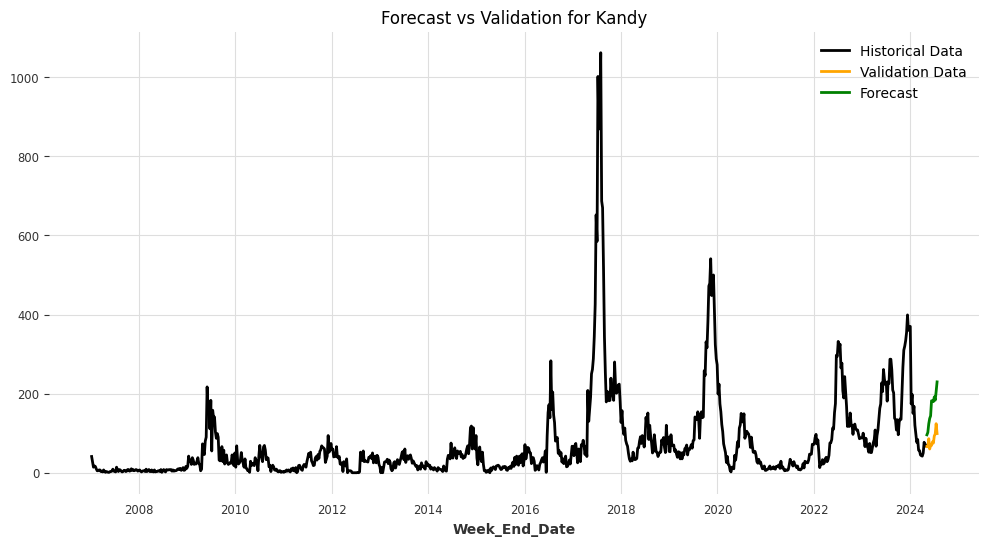

<ipython-input-20-9a1940f4a35d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Kegalle: /content/drive/MyDrive/Models/Kegalle_RegressionModel.pkl


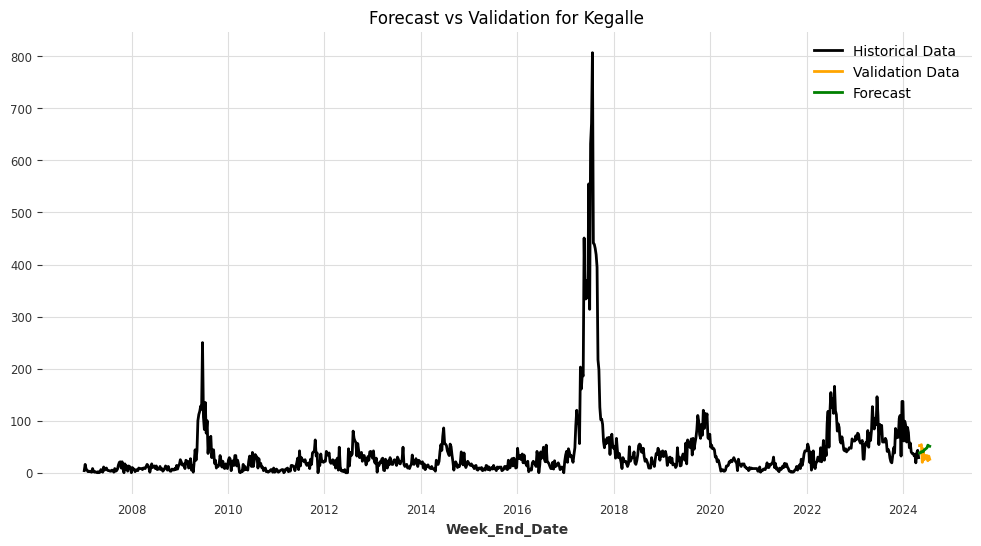

Model saved for /content/drive/MyDrive/Models/Kegalle: /content/drive/MyDrive/Models/Kegalle_LinearRegressionModel.pkl


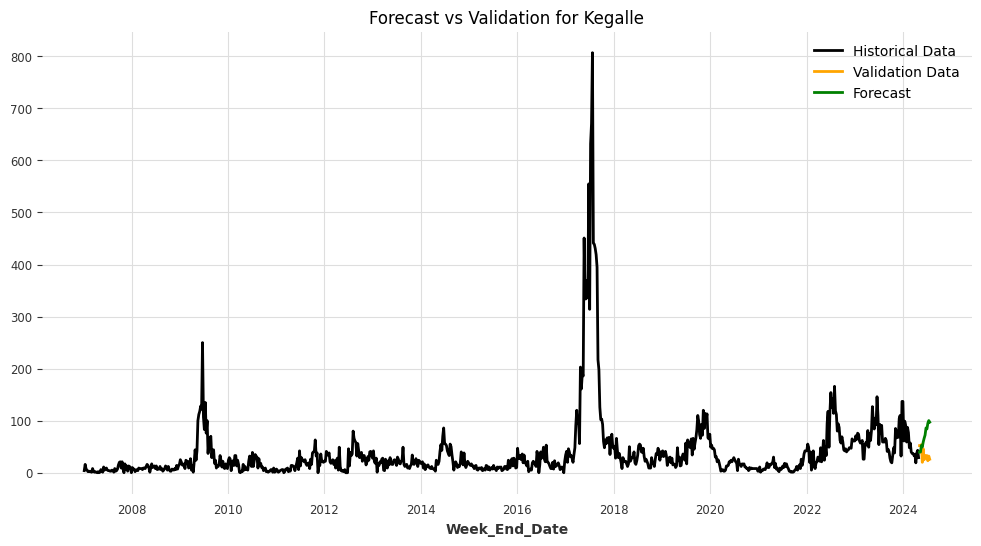

Model saved for /content/drive/MyDrive/Models/Kegalle: /content/drive/MyDrive/Models/Kegalle_RandomForest.pkl


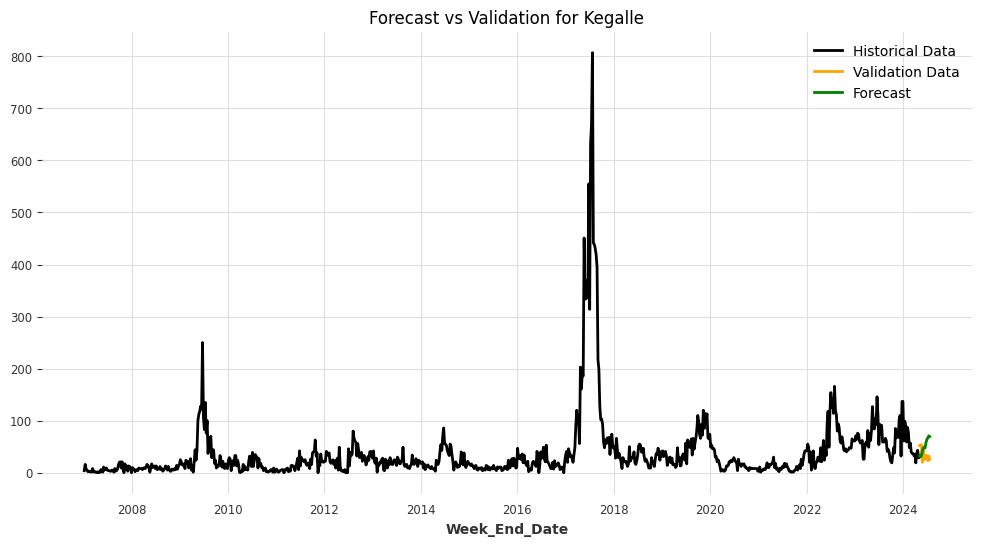

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000702 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7738
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 38.769322
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000417 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7738
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 38.814507
[LightGBM] [Warnin

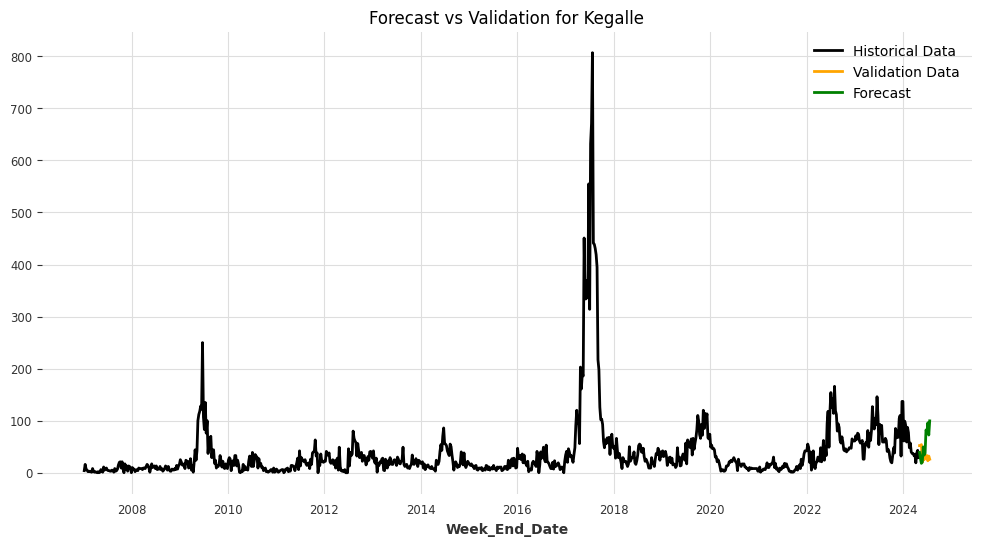

Model saved for /content/drive/MyDrive/Models/Kegalle: /content/drive/MyDrive/Models/Kegalle_XGBModel.pkl


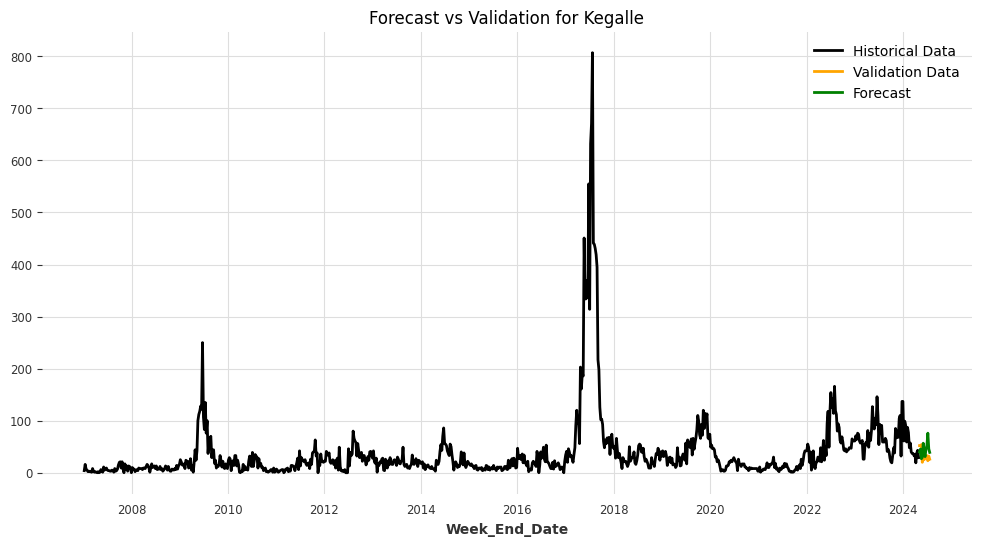

Model saved for /content/drive/MyDrive/Models/Kegalle: /content/drive/MyDrive/Models/Kegalle_CatBoostModel.pkl


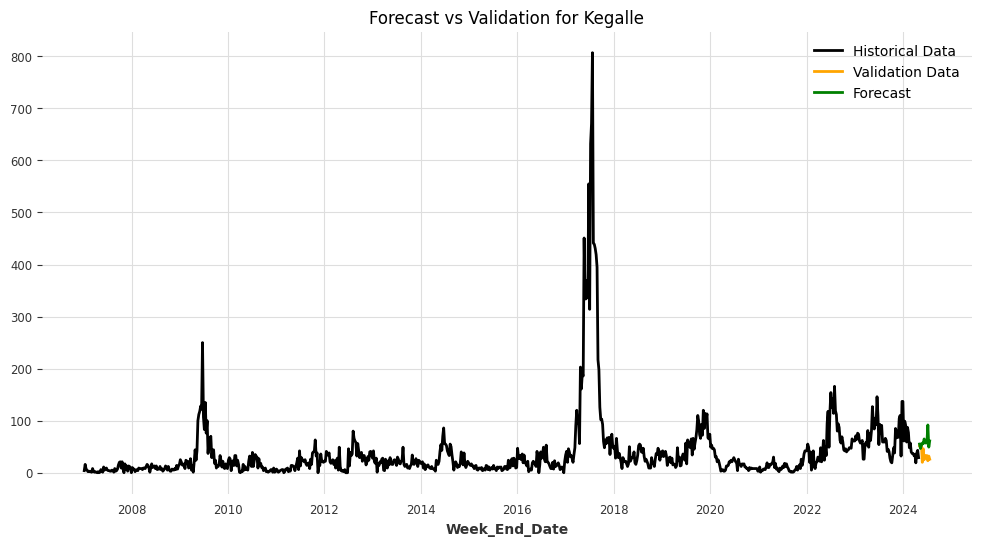

<ipython-input-20-9a1940f4a35d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Kilinochchi: /content/drive/MyDrive/Models/Kilinochchi_RegressionModel.pkl


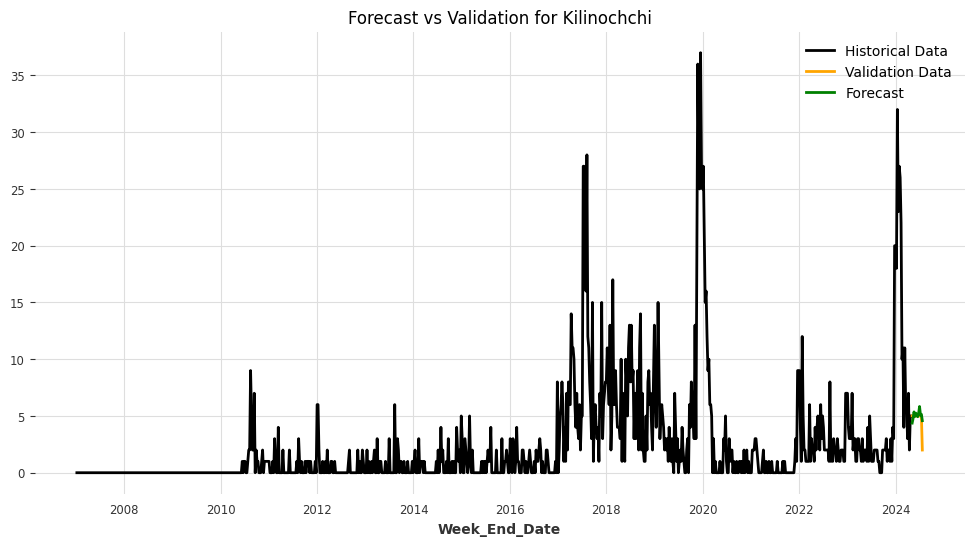

Model saved for /content/drive/MyDrive/Models/Kilinochchi: /content/drive/MyDrive/Models/Kilinochchi_LinearRegressionModel.pkl


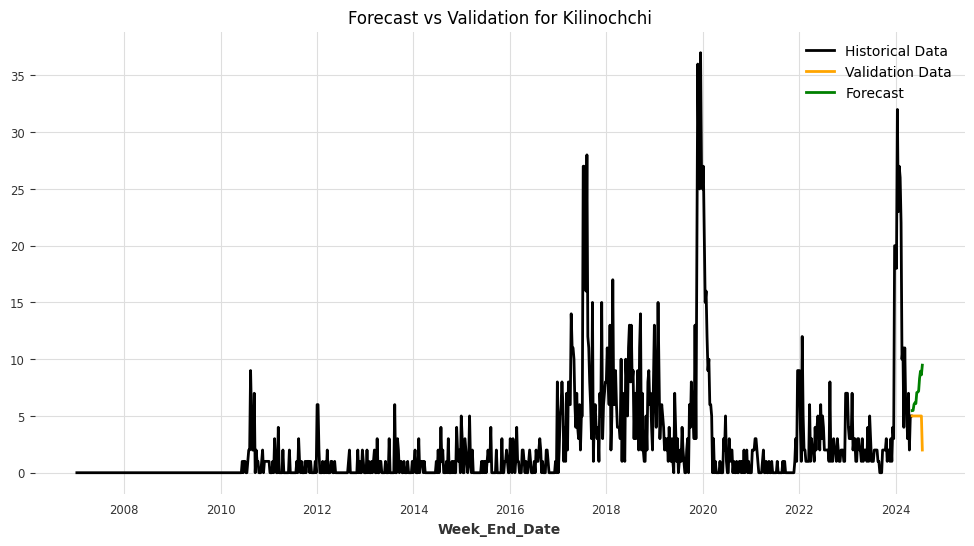

Model saved for /content/drive/MyDrive/Models/Kilinochchi: /content/drive/MyDrive/Models/Kilinochchi_RandomForest.pkl


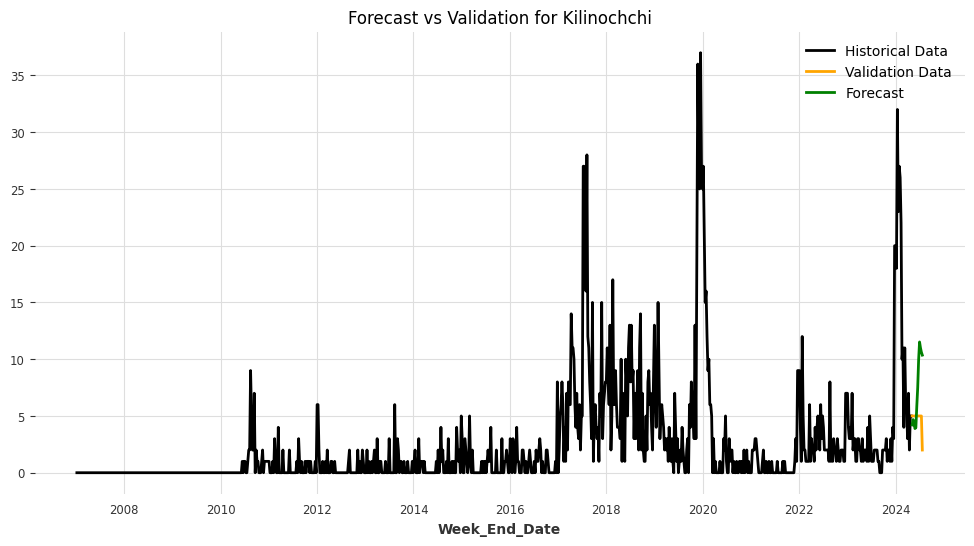

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000681 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7511
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 2.430440
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000427 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7511
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 2.442331
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000648 

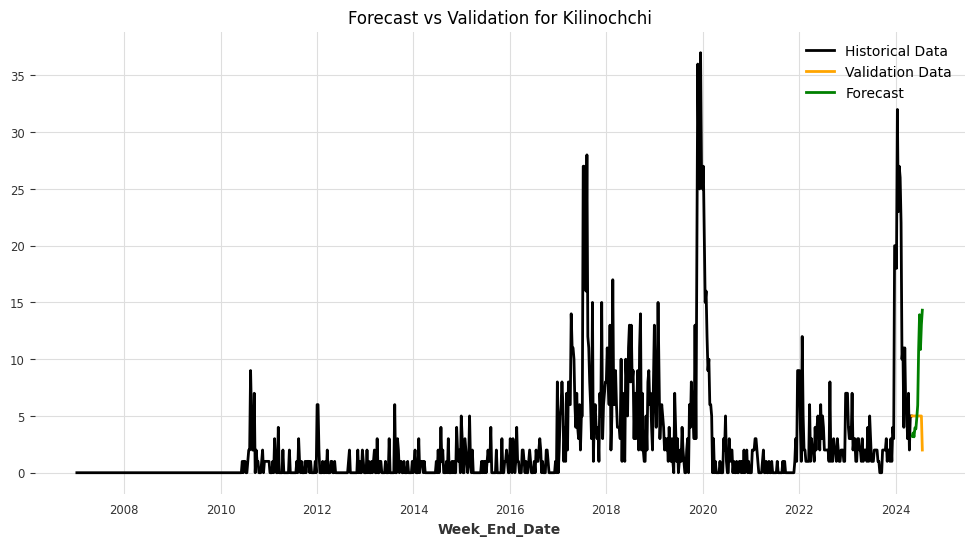

Model saved for /content/drive/MyDrive/Models/Kilinochchi: /content/drive/MyDrive/Models/Kilinochchi_XGBModel.pkl


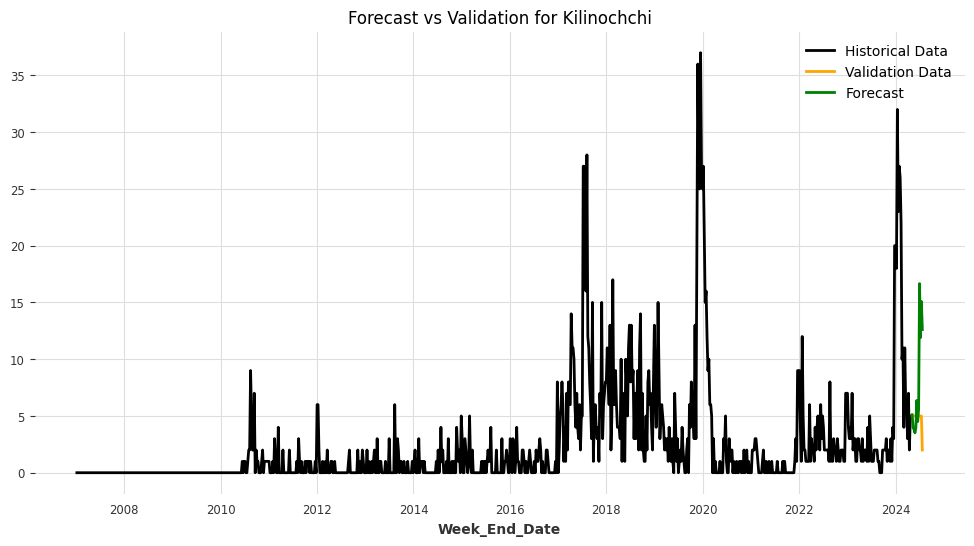

Model saved for /content/drive/MyDrive/Models/Kilinochchi: /content/drive/MyDrive/Models/Kilinochchi_CatBoostModel.pkl


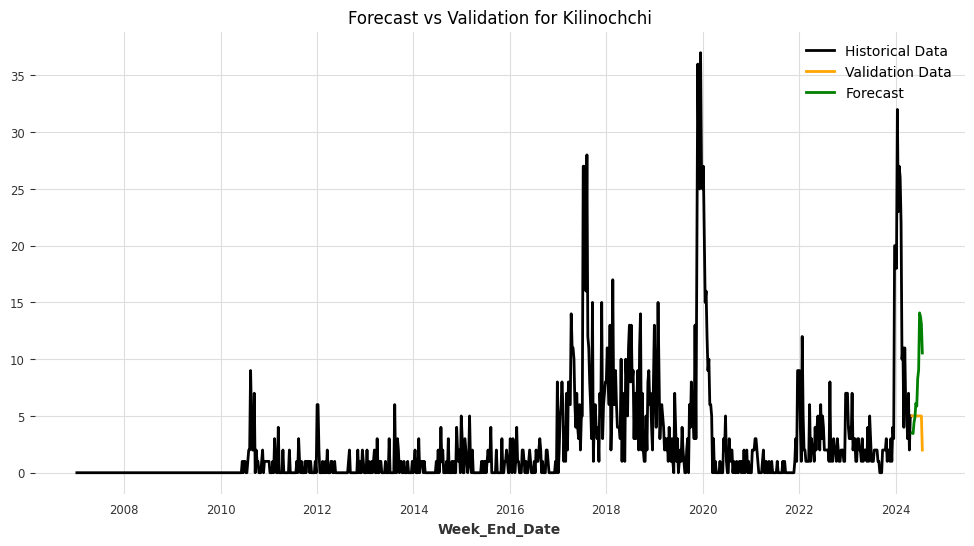

<ipython-input-20-9a1940f4a35d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Kurunegala: /content/drive/MyDrive/Models/Kurunegala_RegressionModel.pkl


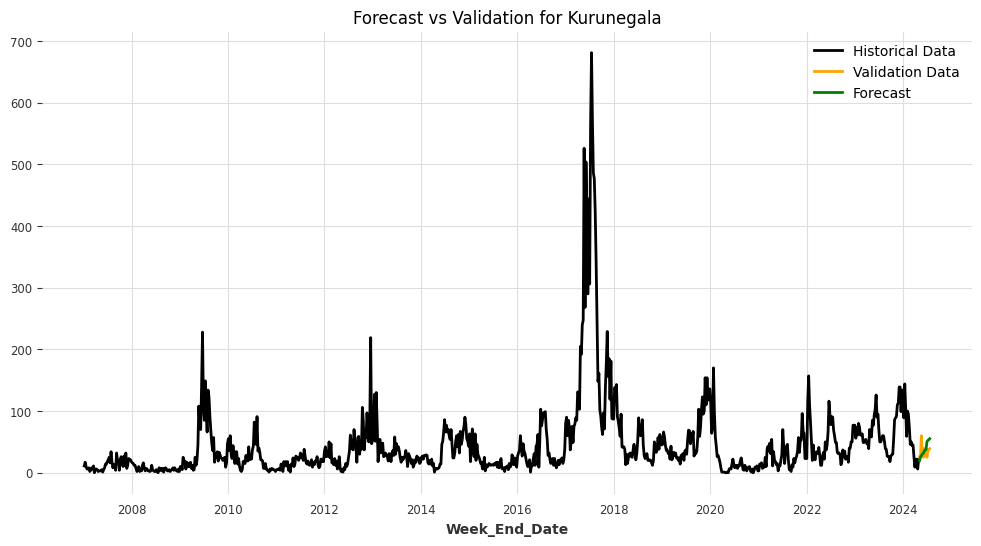

Model saved for /content/drive/MyDrive/Models/Kurunegala: /content/drive/MyDrive/Models/Kurunegala_LinearRegressionModel.pkl


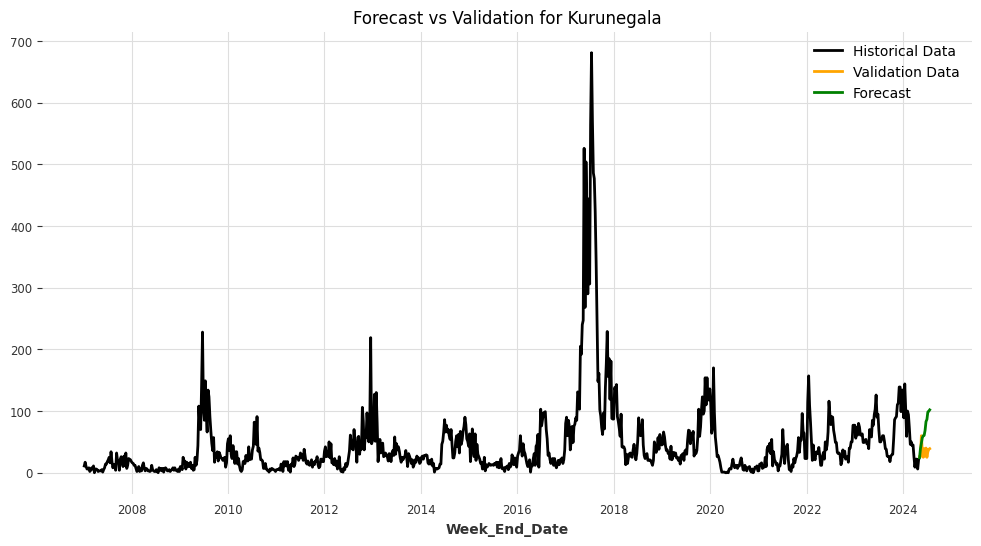

Model saved for /content/drive/MyDrive/Models/Kurunegala: /content/drive/MyDrive/Models/Kurunegala_RandomForest.pkl


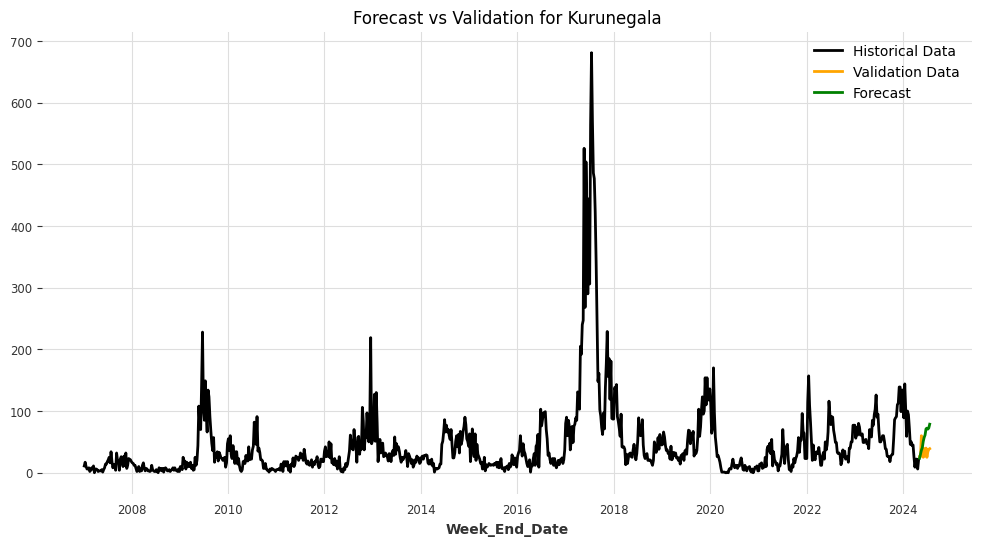

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000670 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7769
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 46.353151
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000716 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7769
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 46.419738
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.00065

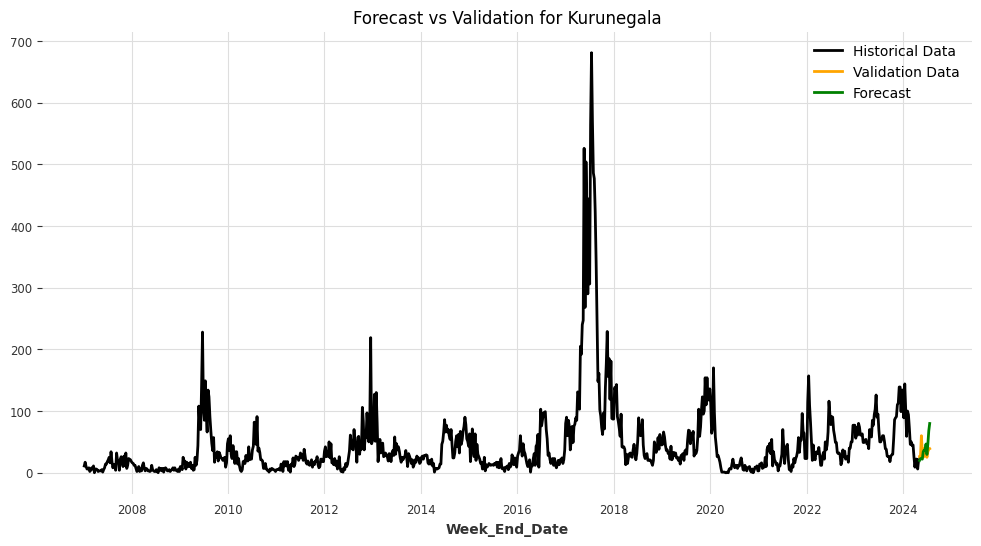

Model saved for /content/drive/MyDrive/Models/Kurunegala: /content/drive/MyDrive/Models/Kurunegala_XGBModel.pkl


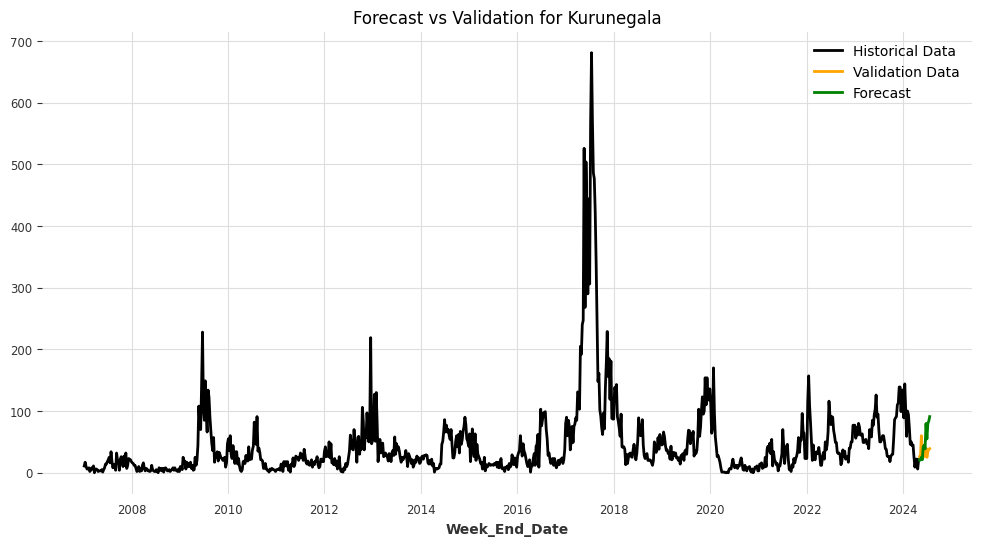

Model saved for /content/drive/MyDrive/Models/Kurunegala: /content/drive/MyDrive/Models/Kurunegala_CatBoostModel.pkl


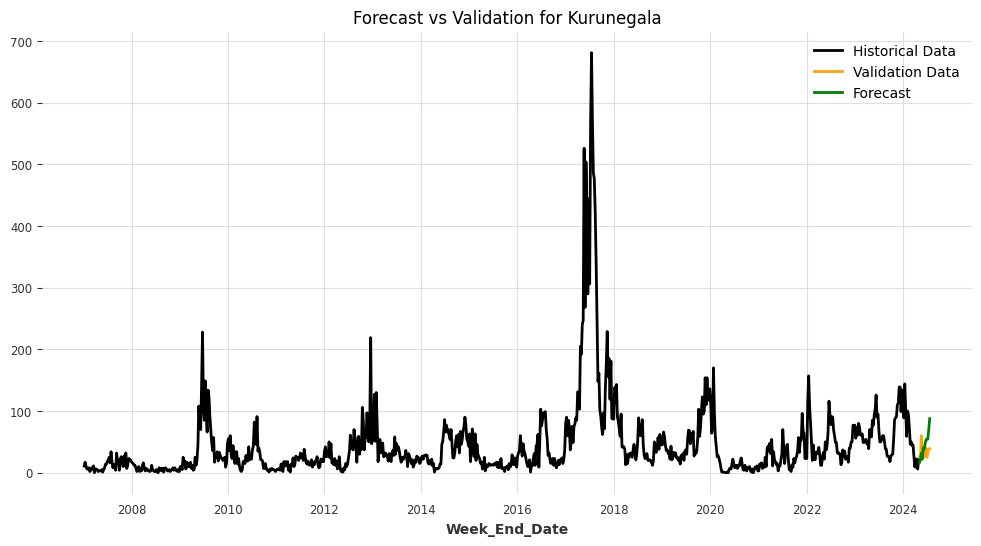

<ipython-input-20-9a1940f4a35d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Mannar: /content/drive/MyDrive/Models/Mannar_RegressionModel.pkl


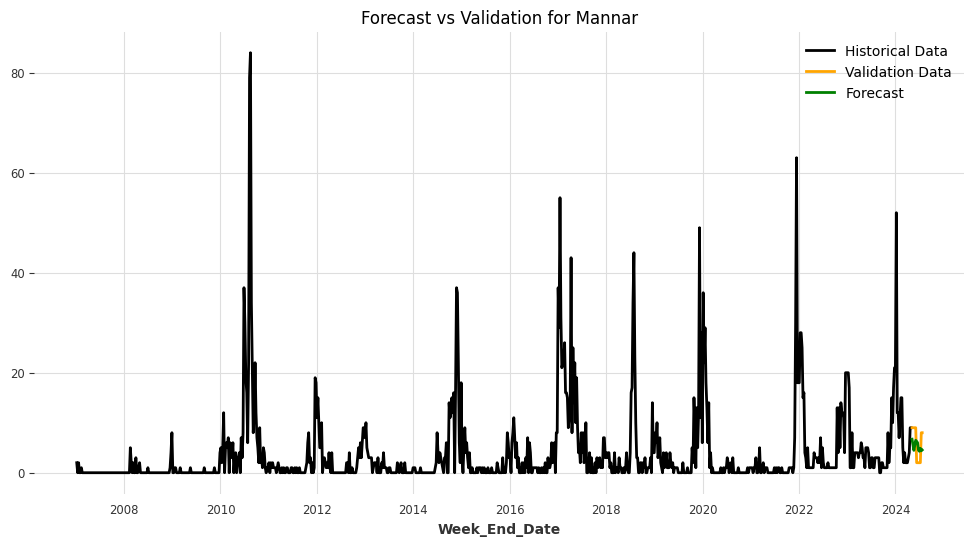

Model saved for /content/drive/MyDrive/Models/Mannar: /content/drive/MyDrive/Models/Mannar_LinearRegressionModel.pkl


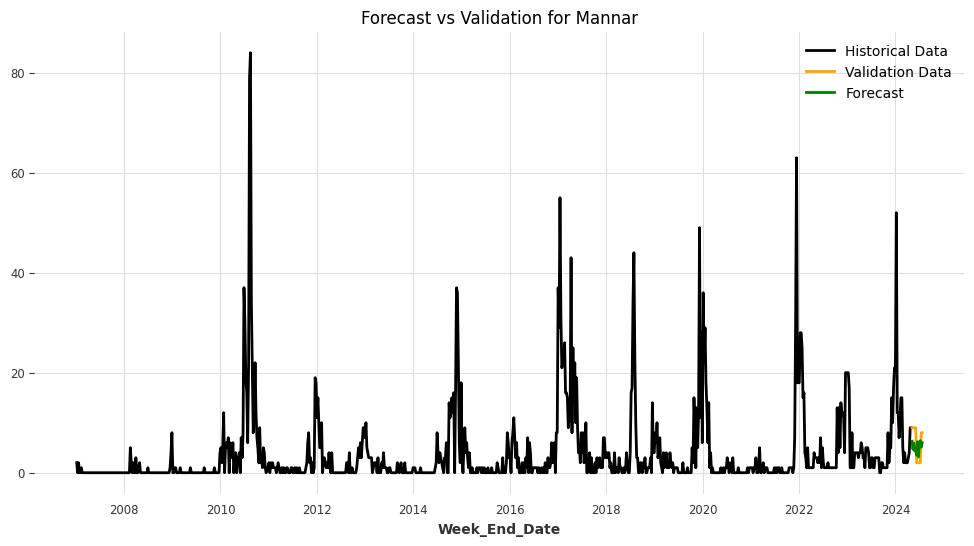

Model saved for /content/drive/MyDrive/Models/Mannar: /content/drive/MyDrive/Models/Mannar_RandomForest.pkl


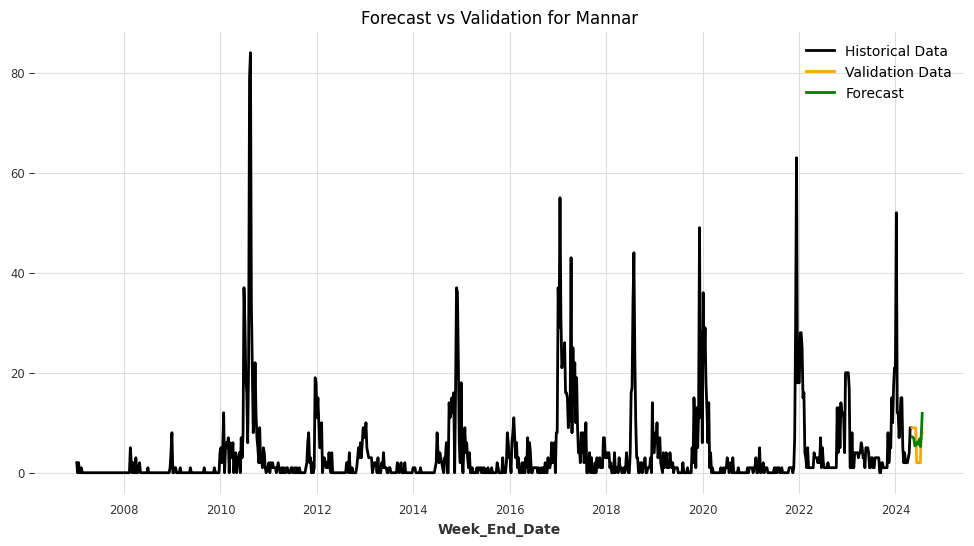

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000783 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7576
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 4.007134
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000763 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7576
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 4.024970
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning]

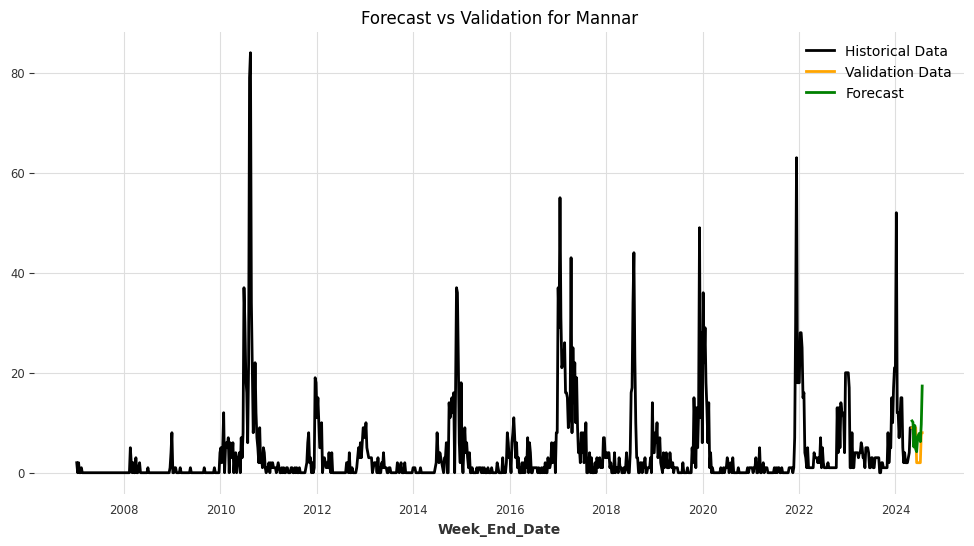

Model saved for /content/drive/MyDrive/Models/Mannar: /content/drive/MyDrive/Models/Mannar_XGBModel.pkl


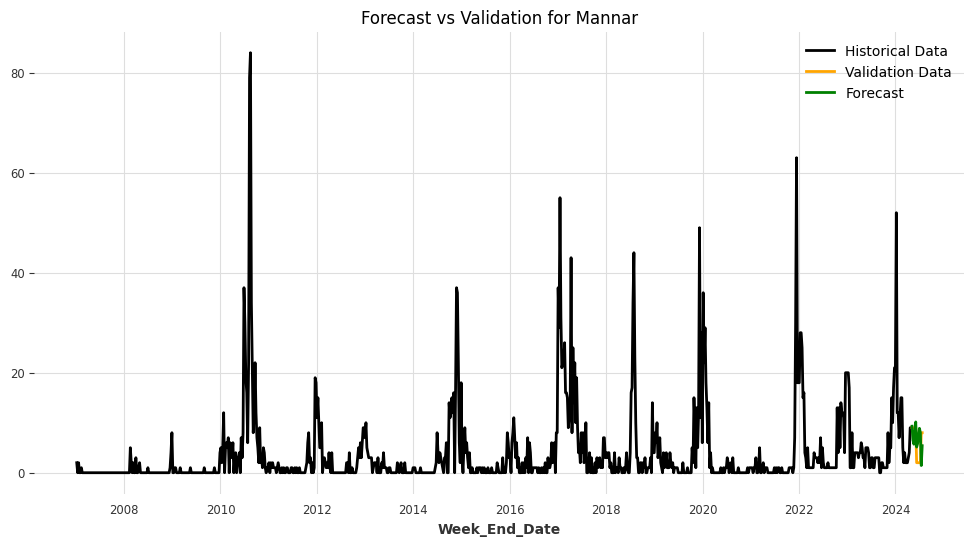

Model saved for /content/drive/MyDrive/Models/Mannar: /content/drive/MyDrive/Models/Mannar_CatBoostModel.pkl


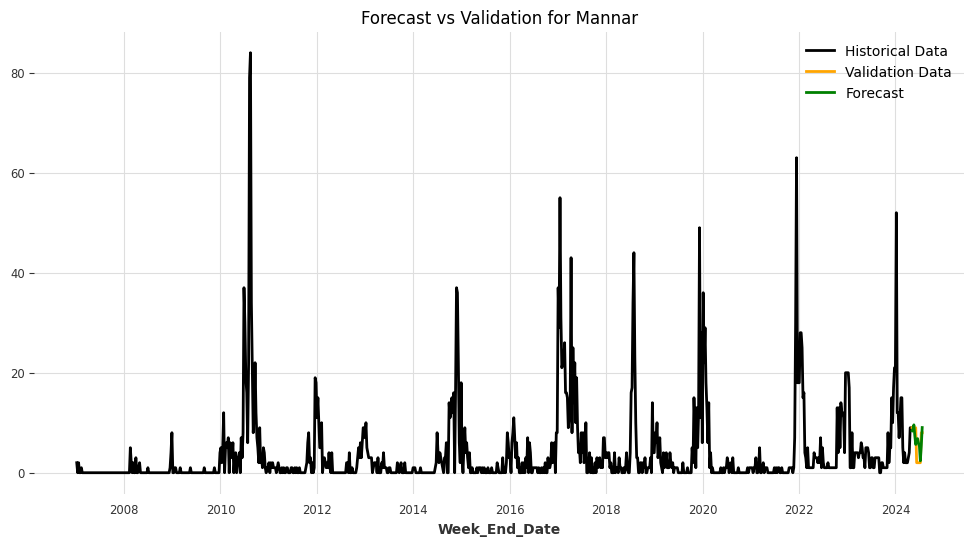

<ipython-input-20-9a1940f4a35d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Matale: /content/drive/MyDrive/Models/Matale_RegressionModel.pkl


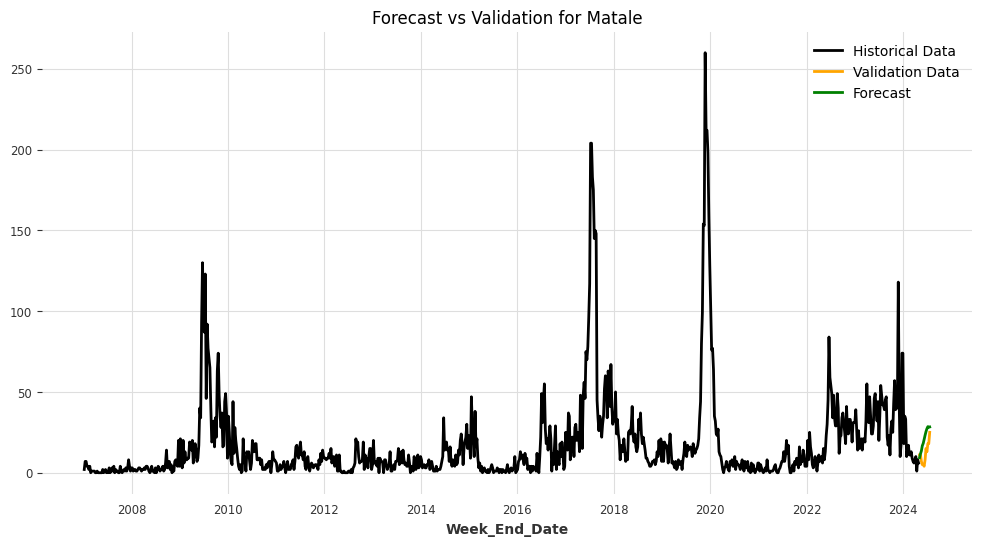

Model saved for /content/drive/MyDrive/Models/Matale: /content/drive/MyDrive/Models/Matale_LinearRegressionModel.pkl


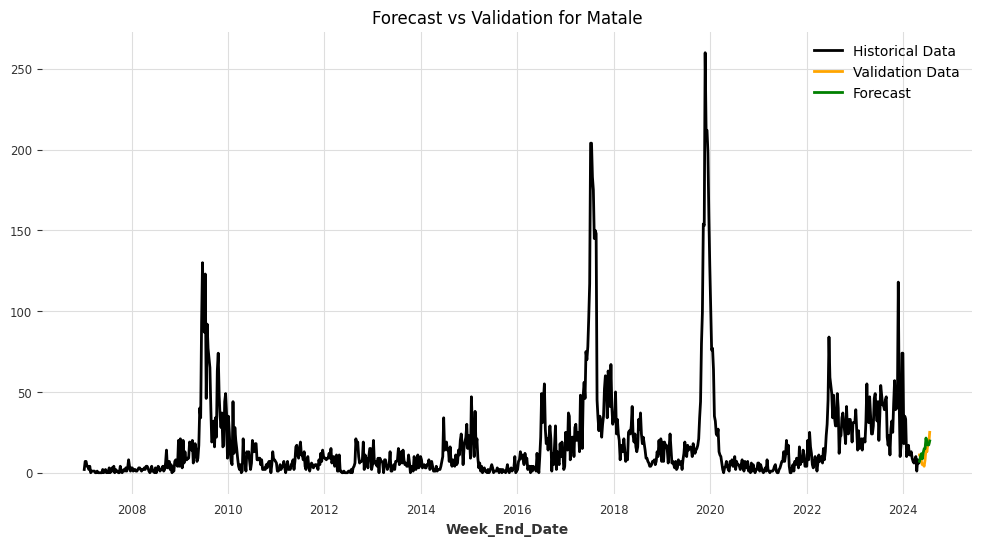

Model saved for /content/drive/MyDrive/Models/Matale: /content/drive/MyDrive/Models/Matale_RandomForest.pkl


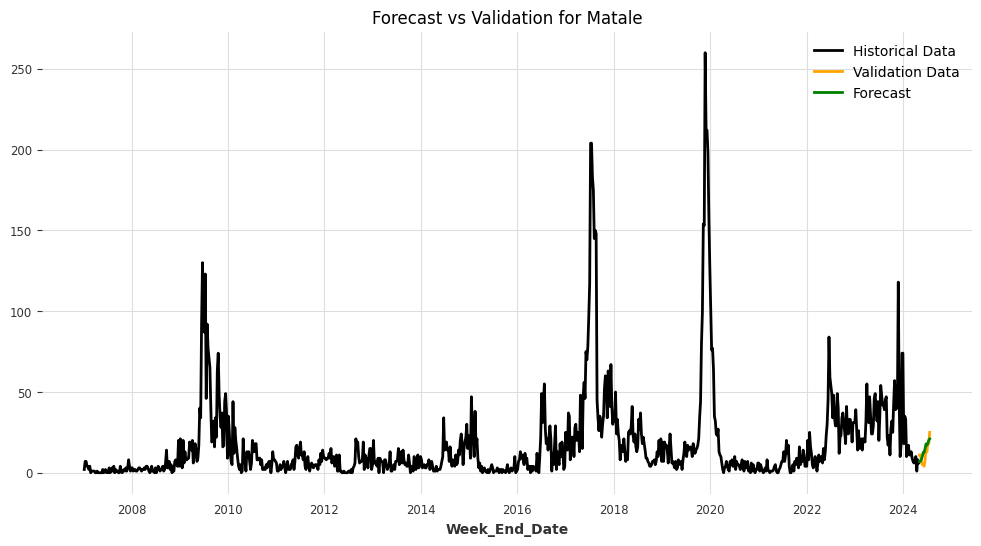

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000670 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7601
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 18.242568
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000703 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7601
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 

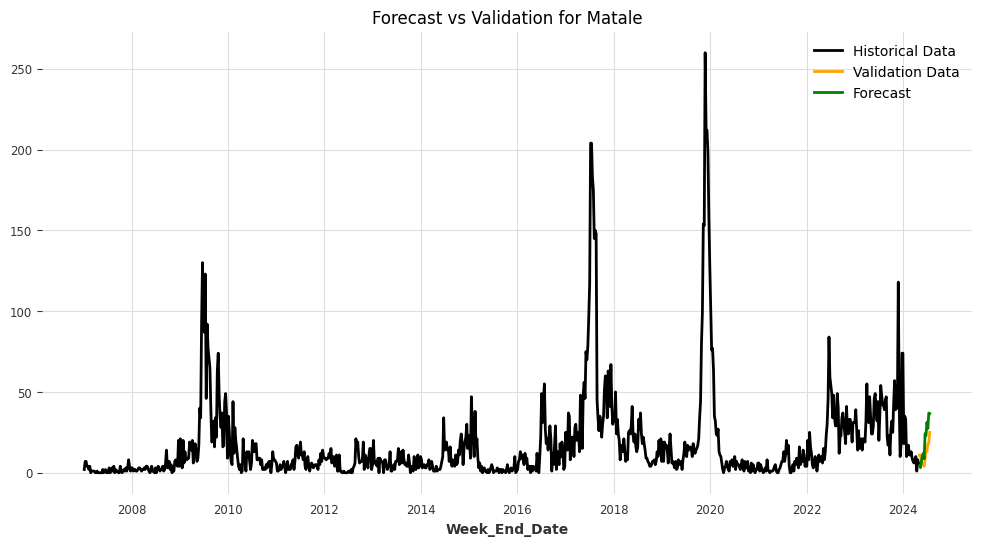

Model saved for /content/drive/MyDrive/Models/Matale: /content/drive/MyDrive/Models/Matale_XGBModel.pkl


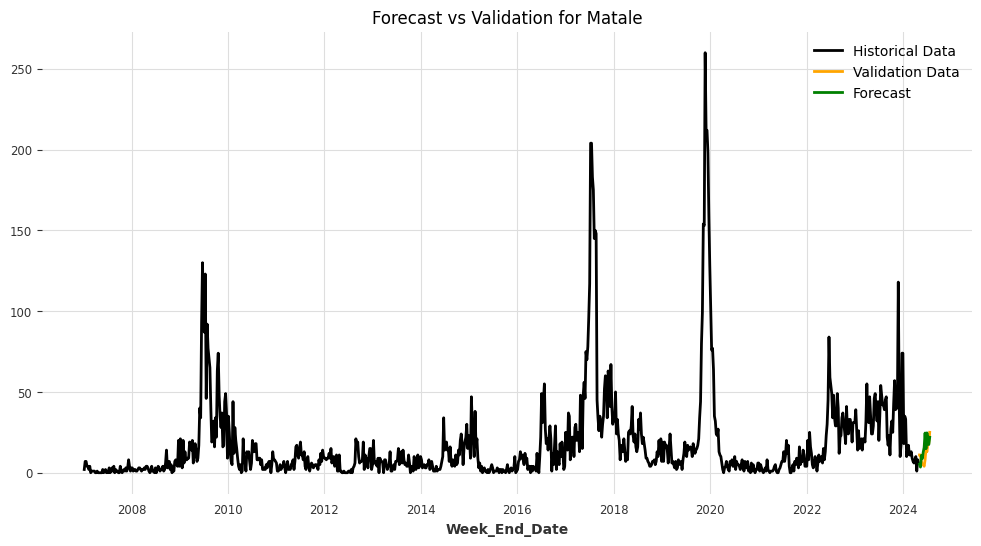

Model saved for /content/drive/MyDrive/Models/Matale: /content/drive/MyDrive/Models/Matale_CatBoostModel.pkl


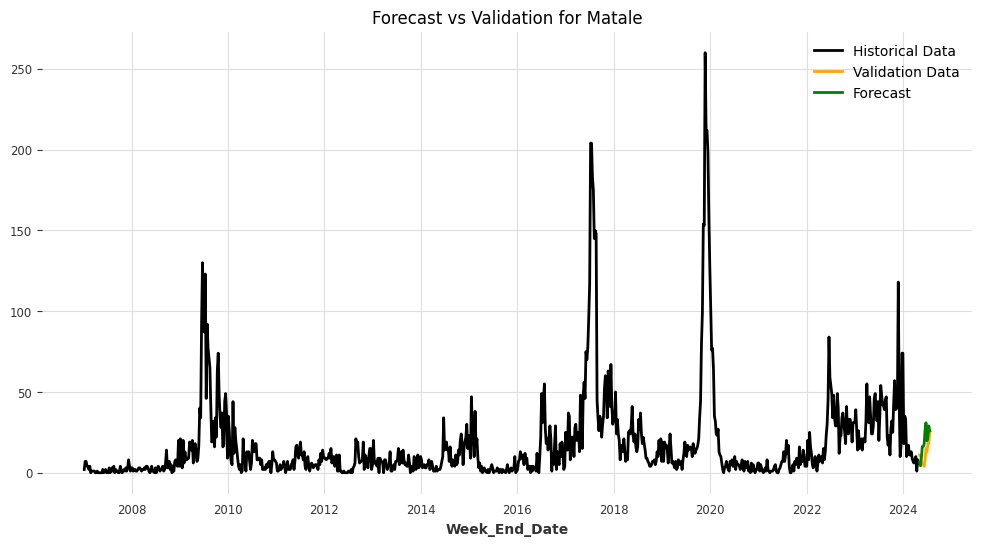

<ipython-input-20-9a1940f4a35d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Matara: /content/drive/MyDrive/Models/Matara_RegressionModel.pkl


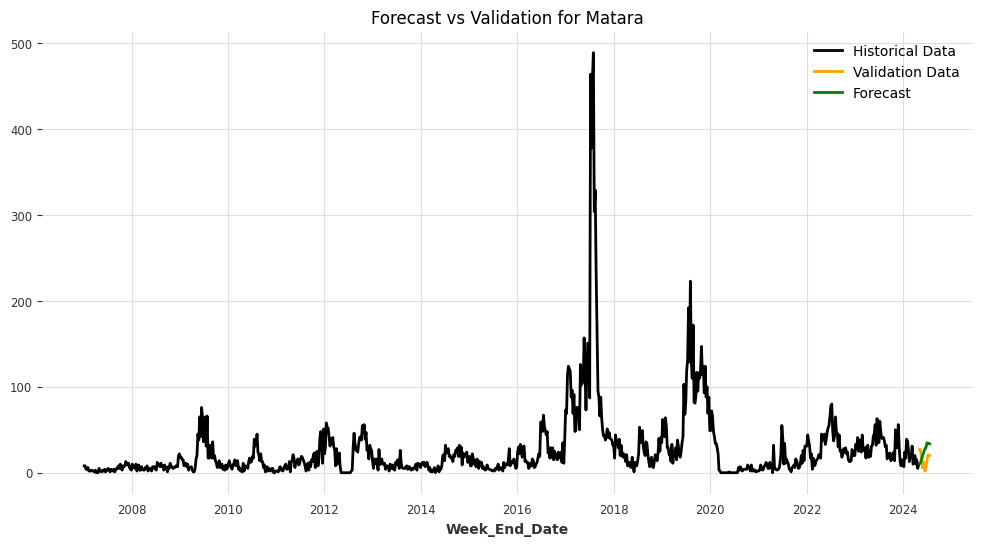

Model saved for /content/drive/MyDrive/Models/Matara: /content/drive/MyDrive/Models/Matara_LinearRegressionModel.pkl


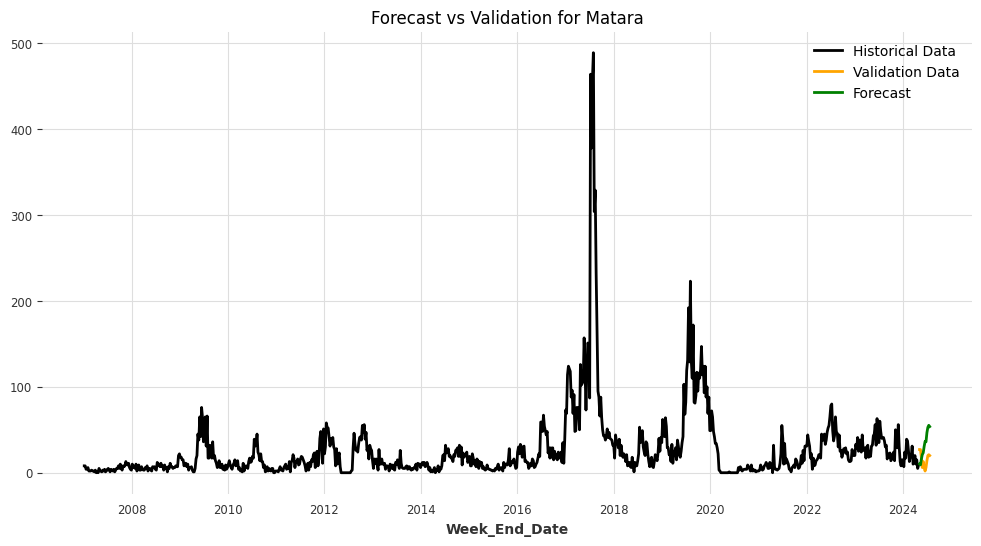

Model saved for /content/drive/MyDrive/Models/Matara: /content/drive/MyDrive/Models/Matara_RandomForest.pkl


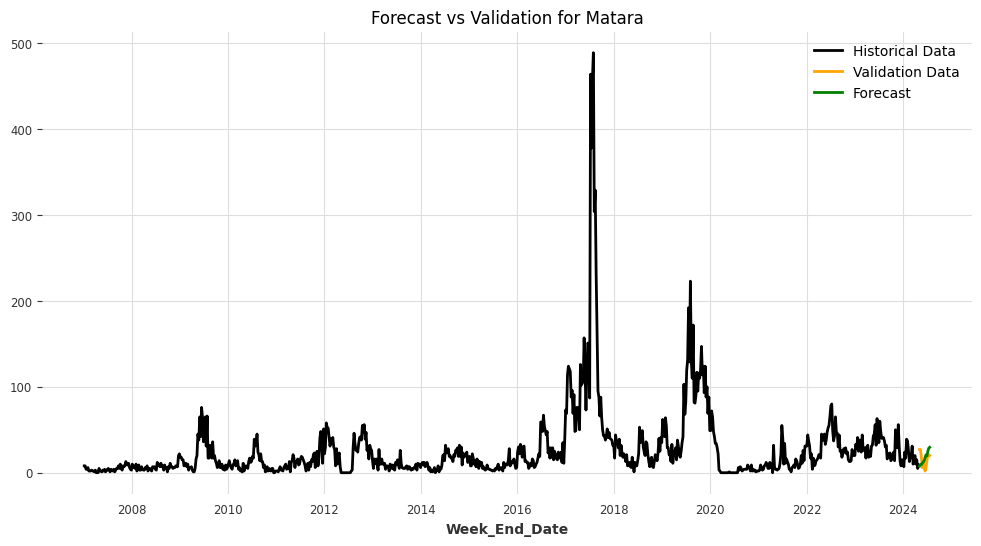

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000754 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7586
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 27.258026
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000662 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7586
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 27.261593
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

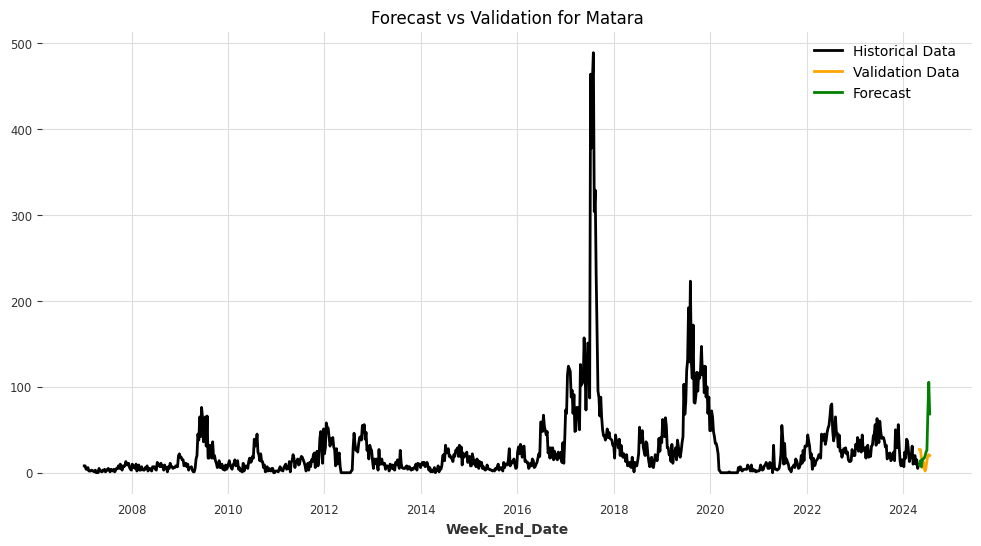

Model saved for /content/drive/MyDrive/Models/Matara: /content/drive/MyDrive/Models/Matara_XGBModel.pkl


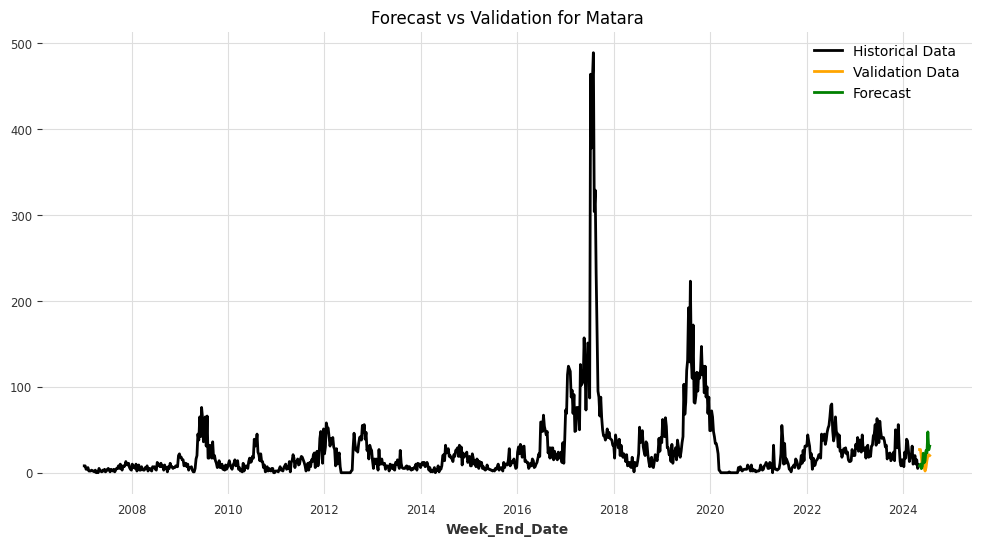

Model saved for /content/drive/MyDrive/Models/Matara: /content/drive/MyDrive/Models/Matara_CatBoostModel.pkl


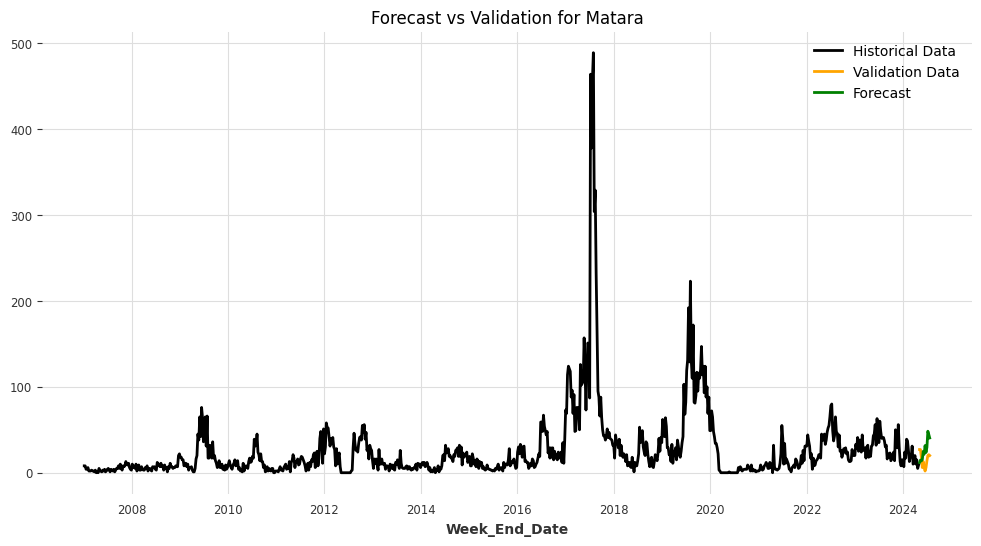

<ipython-input-20-9a1940f4a35d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Monaragala: /content/drive/MyDrive/Models/Monaragala_RegressionModel.pkl


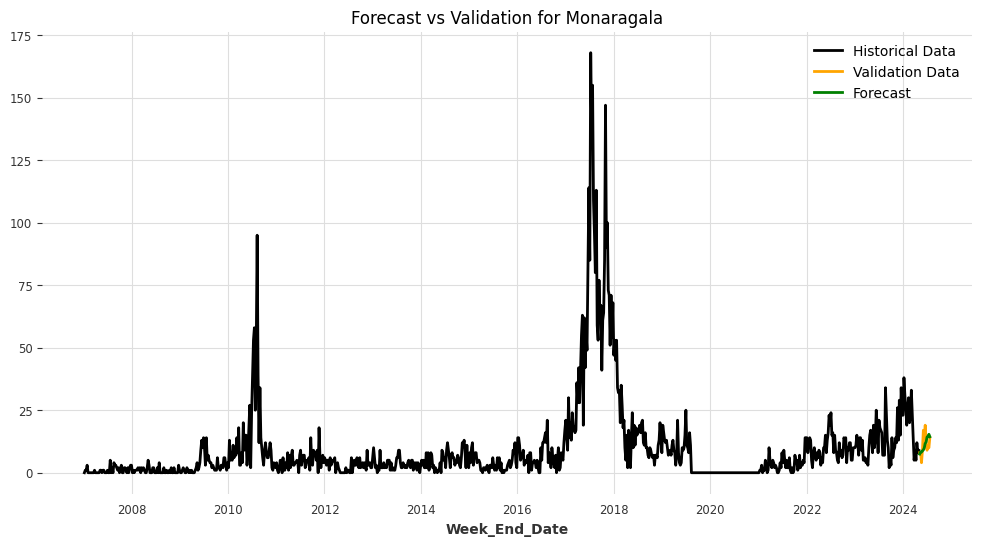

Model saved for /content/drive/MyDrive/Models/Monaragala: /content/drive/MyDrive/Models/Monaragala_LinearRegressionModel.pkl


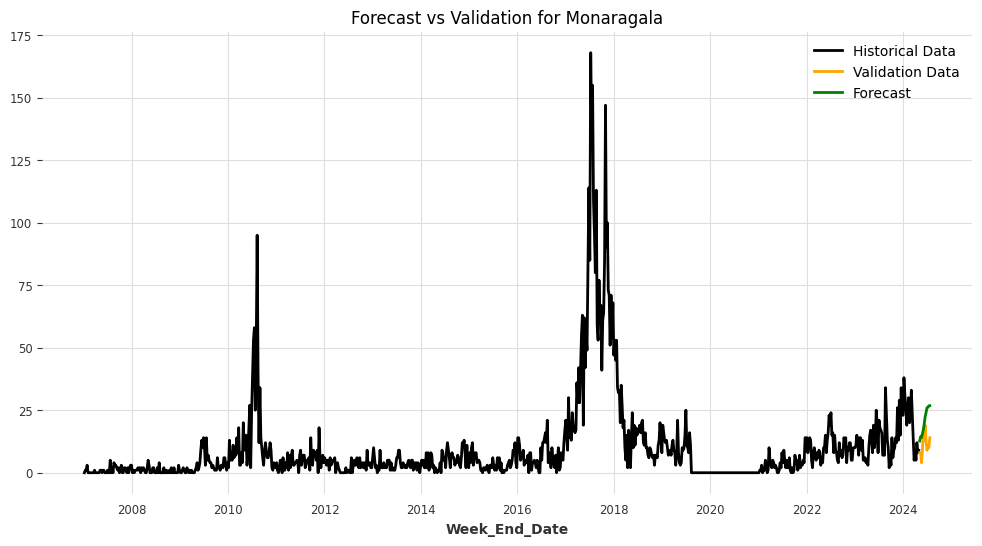

Model saved for /content/drive/MyDrive/Models/Monaragala: /content/drive/MyDrive/Models/Monaragala_RandomForest.pkl


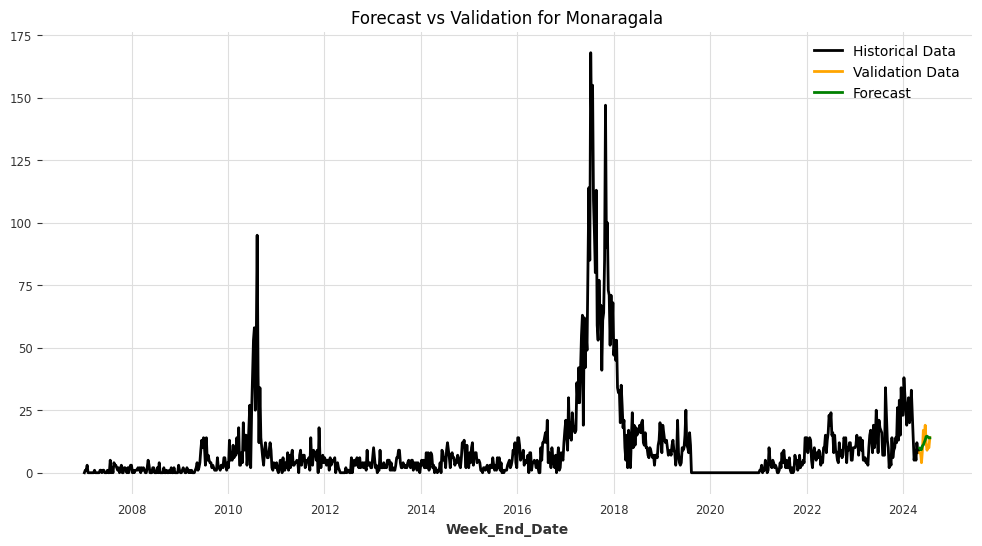

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000638 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7509
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 9.932224
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000420 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7509
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 9.956005
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Au

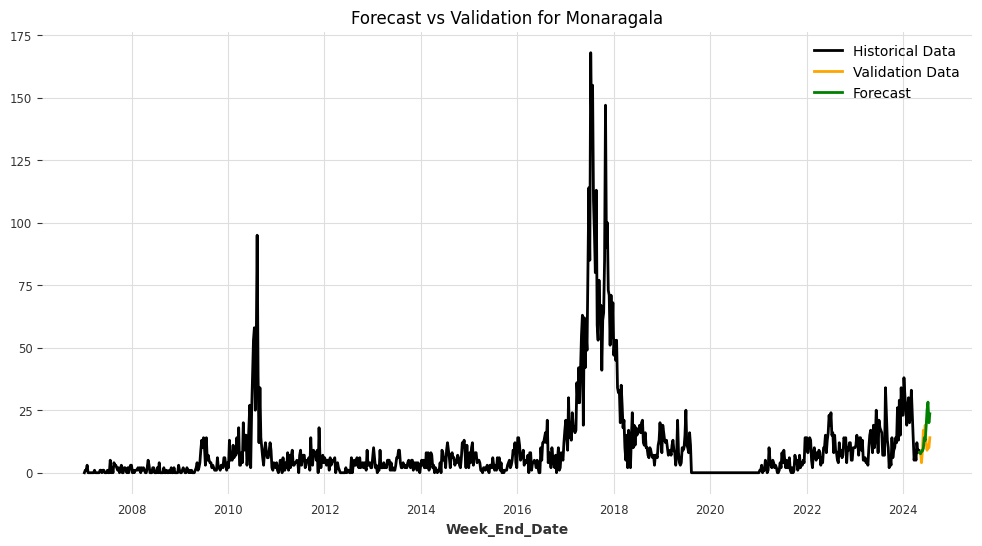

Model saved for /content/drive/MyDrive/Models/Monaragala: /content/drive/MyDrive/Models/Monaragala_XGBModel.pkl


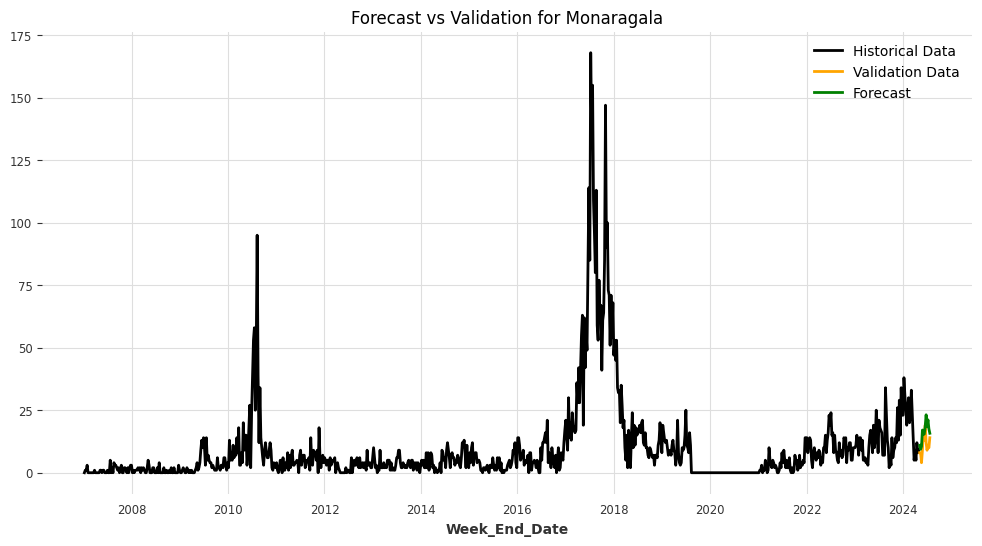

Model saved for /content/drive/MyDrive/Models/Monaragala: /content/drive/MyDrive/Models/Monaragala_CatBoostModel.pkl


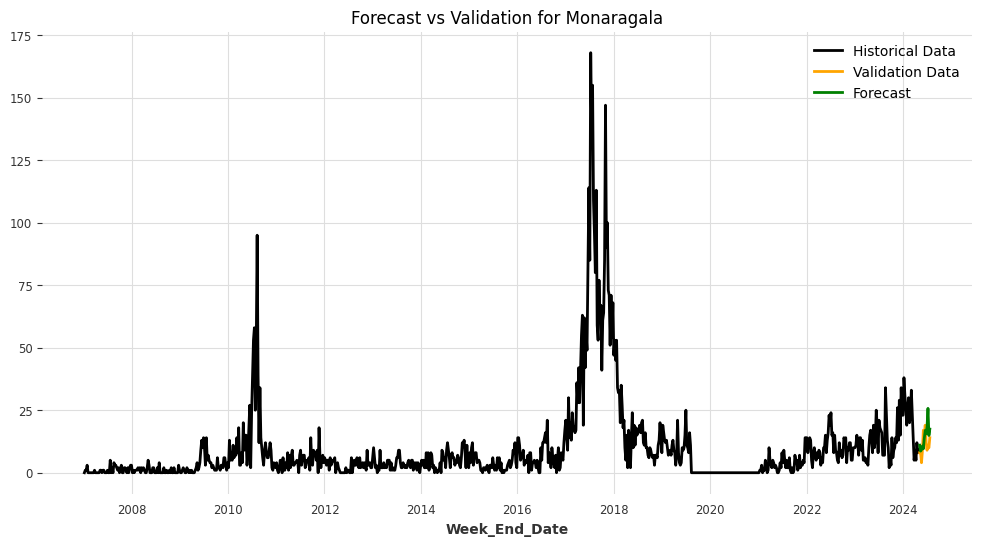

<ipython-input-20-9a1940f4a35d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Mullaitivu: /content/drive/MyDrive/Models/Mullaitivu_RegressionModel.pkl


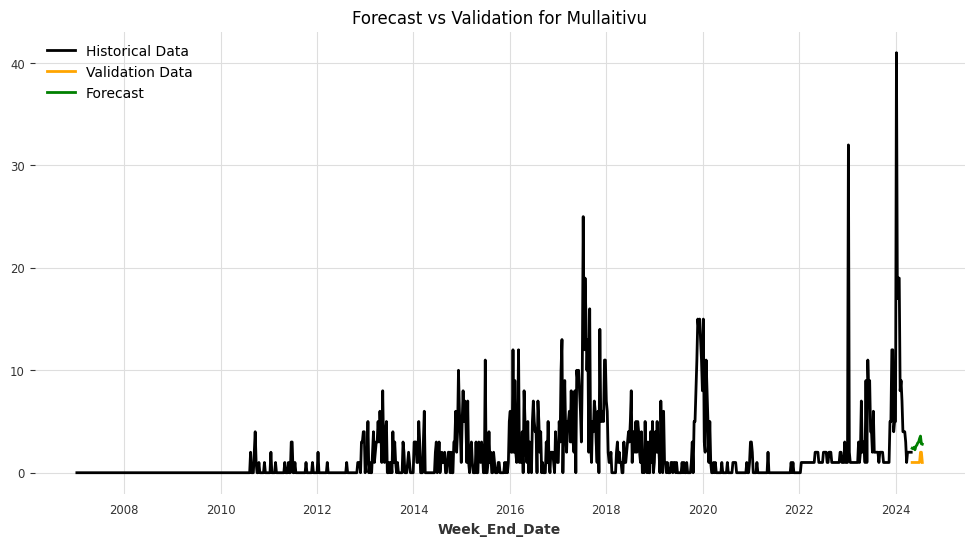

Model saved for /content/drive/MyDrive/Models/Mullaitivu: /content/drive/MyDrive/Models/Mullaitivu_LinearRegressionModel.pkl


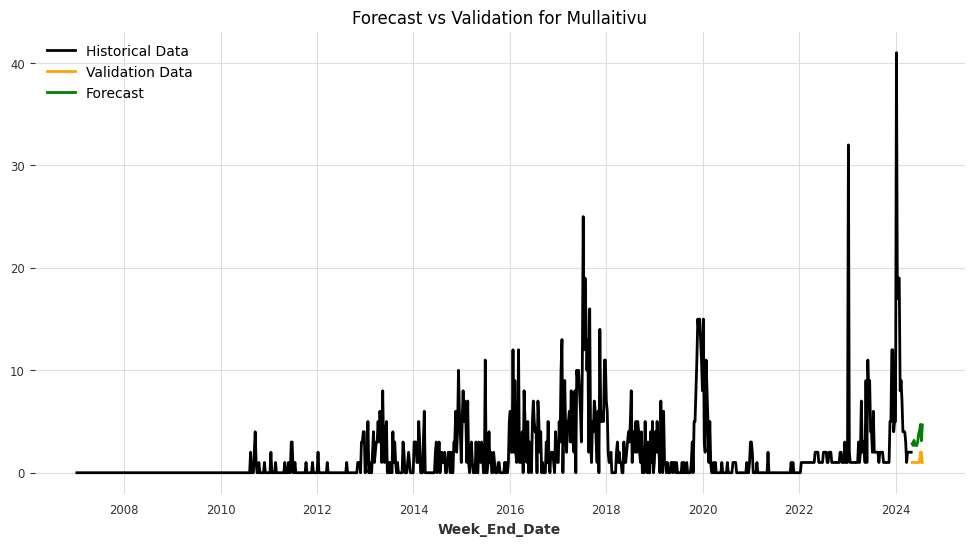

Model saved for /content/drive/MyDrive/Models/Mullaitivu: /content/drive/MyDrive/Models/Mullaitivu_RandomForest.pkl


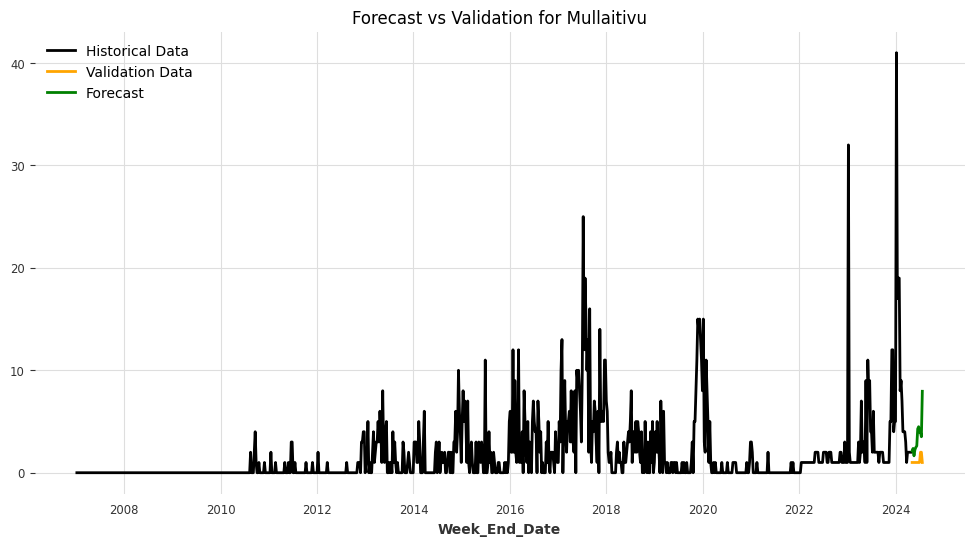

[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000231 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7493
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 1.822830
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000229 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7493
[LightGBM] [Info] Number of data poi

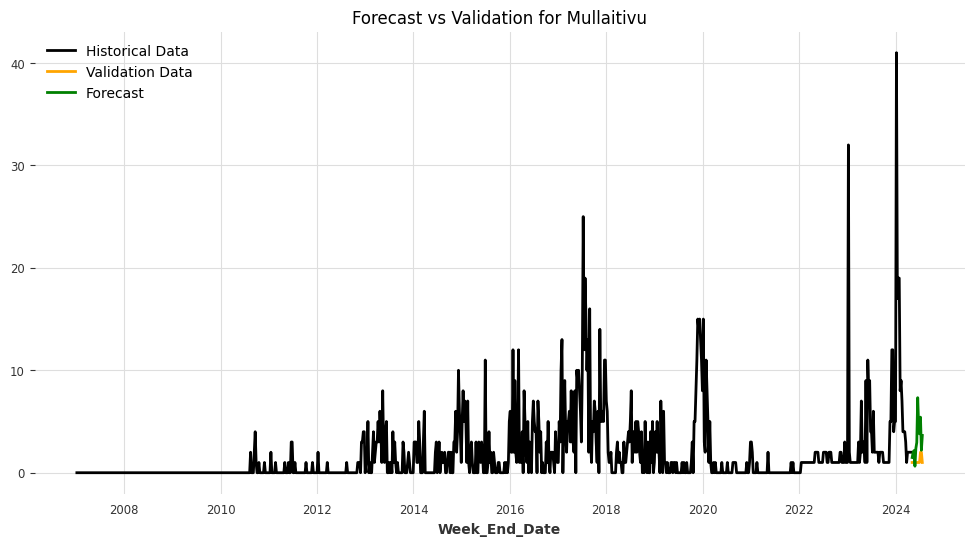

Model saved for /content/drive/MyDrive/Models/Mullaitivu: /content/drive/MyDrive/Models/Mullaitivu_XGBModel.pkl


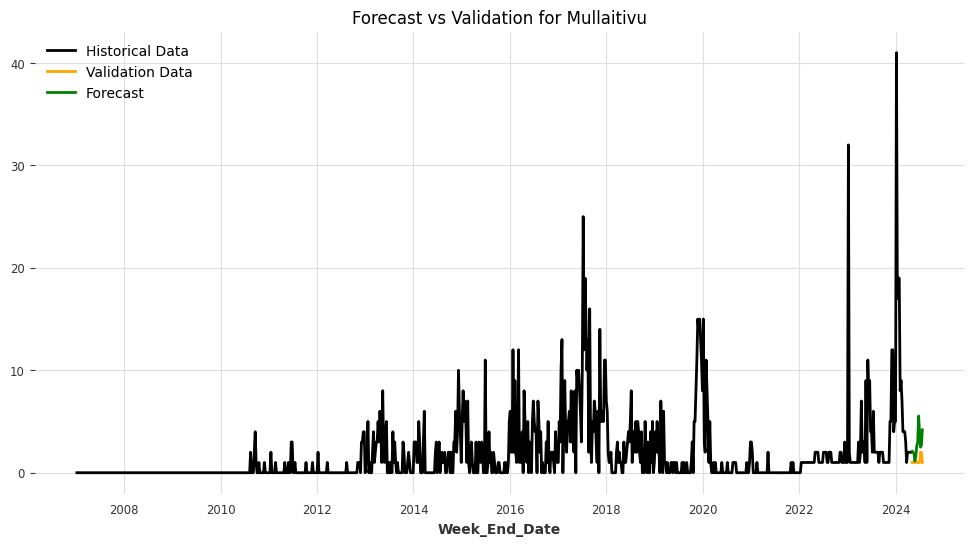

Model saved for /content/drive/MyDrive/Models/Mullaitivu: /content/drive/MyDrive/Models/Mullaitivu_CatBoostModel.pkl


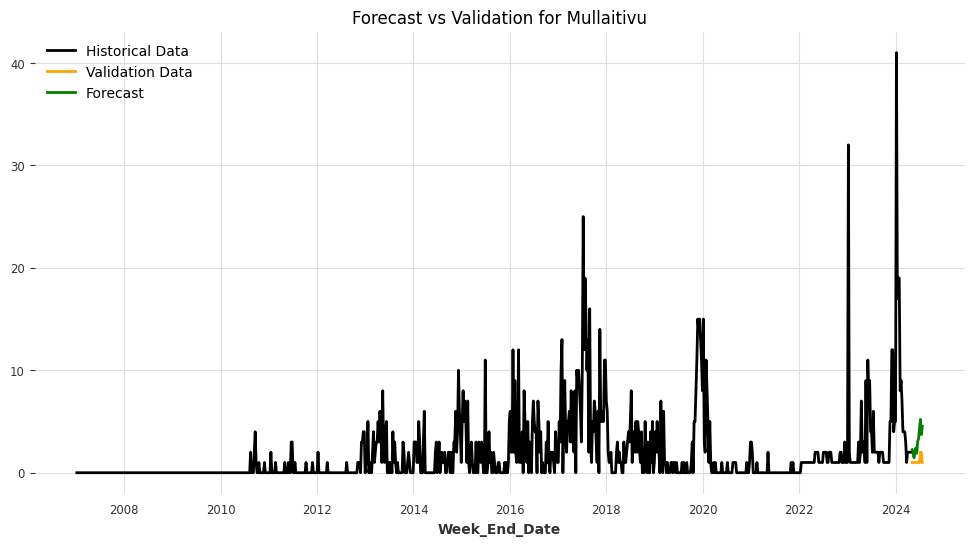

<ipython-input-20-9a1940f4a35d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/NuwaraEliya: /content/drive/MyDrive/Models/NuwaraEliya_RegressionModel.pkl


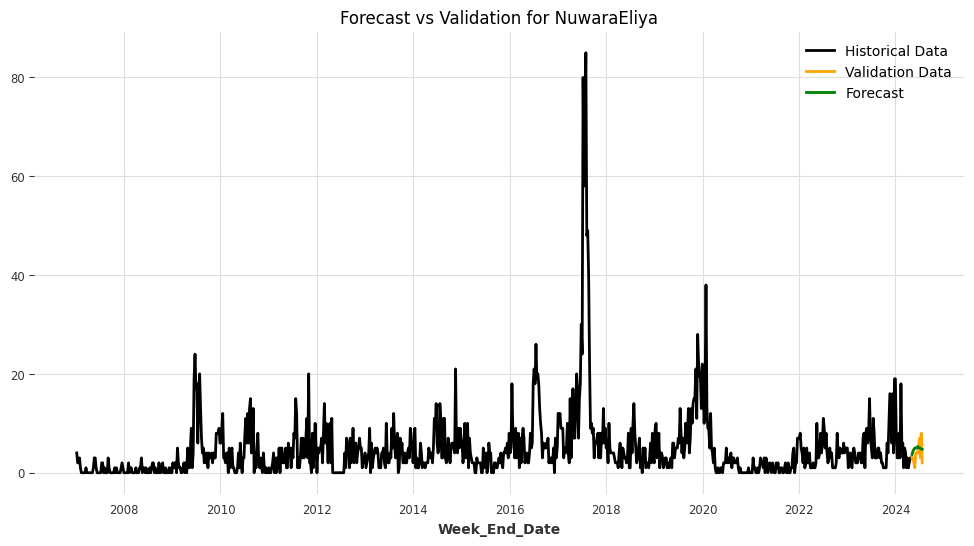

Model saved for /content/drive/MyDrive/Models/NuwaraEliya: /content/drive/MyDrive/Models/NuwaraEliya_LinearRegressionModel.pkl


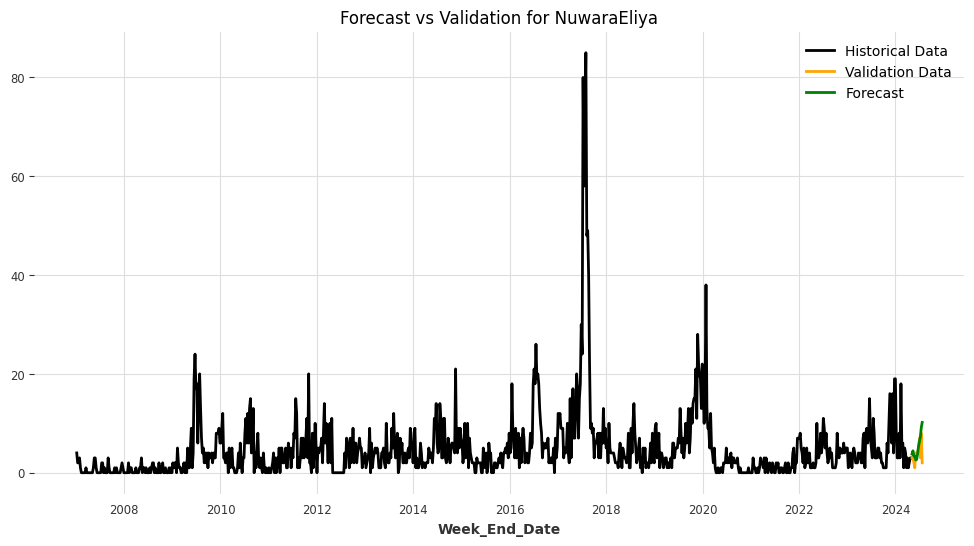

Model saved for /content/drive/MyDrive/Models/NuwaraEliya: /content/drive/MyDrive/Models/NuwaraEliya_RandomForest.pkl


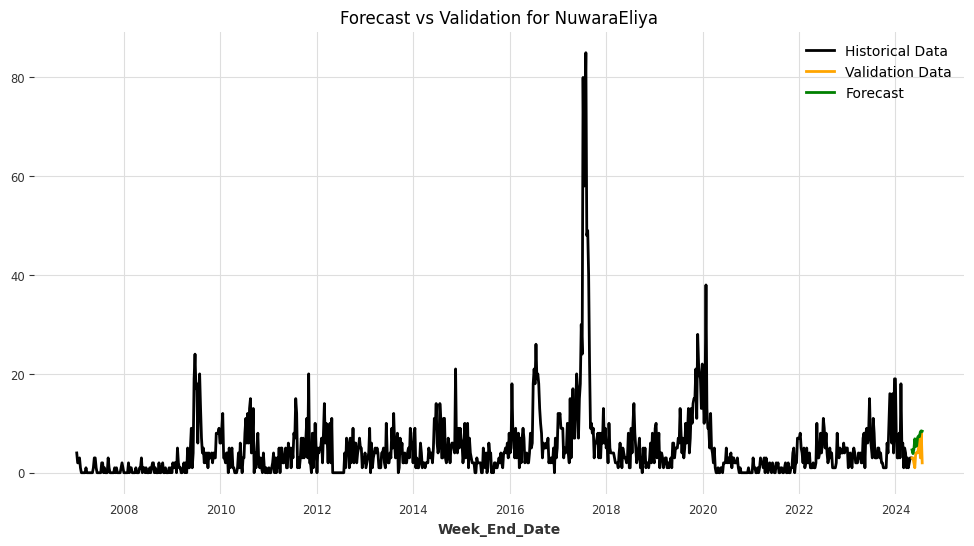

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000702 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7468
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 5.059453
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000721 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7468
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 5.065398
[LightGBM] [Warning]

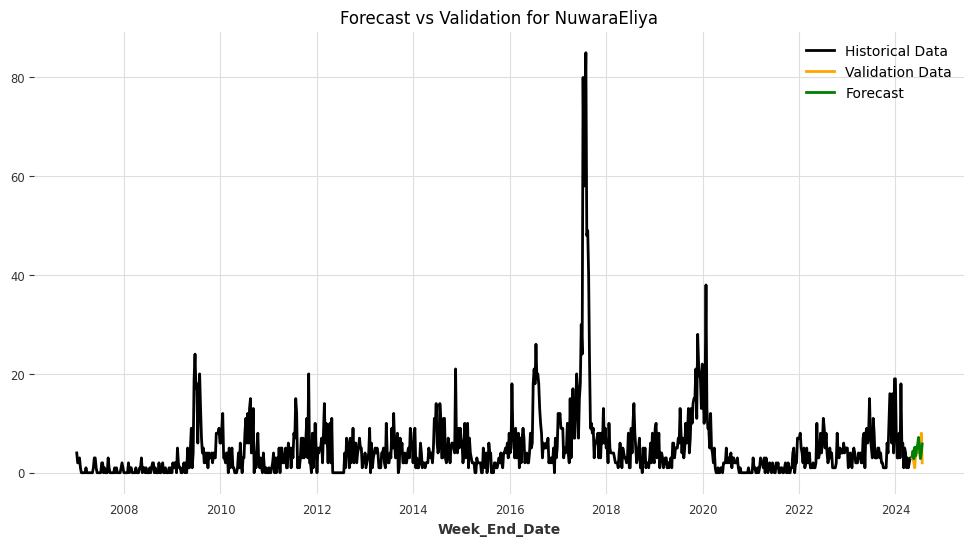

Model saved for /content/drive/MyDrive/Models/NuwaraEliya: /content/drive/MyDrive/Models/NuwaraEliya_XGBModel.pkl


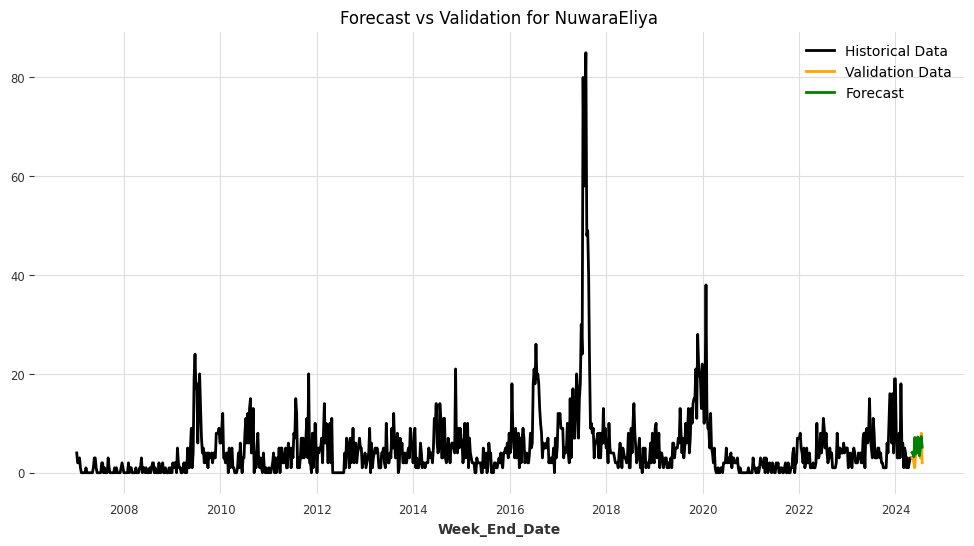

Model saved for /content/drive/MyDrive/Models/NuwaraEliya: /content/drive/MyDrive/Models/NuwaraEliya_CatBoostModel.pkl


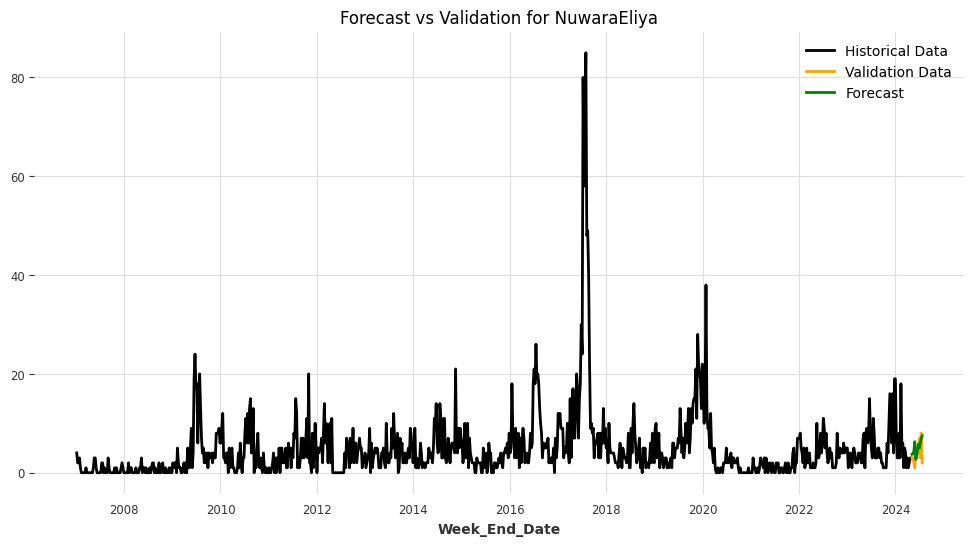

<ipython-input-20-9a1940f4a35d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Polonnaruwa: /content/drive/MyDrive/Models/Polonnaruwa_RegressionModel.pkl


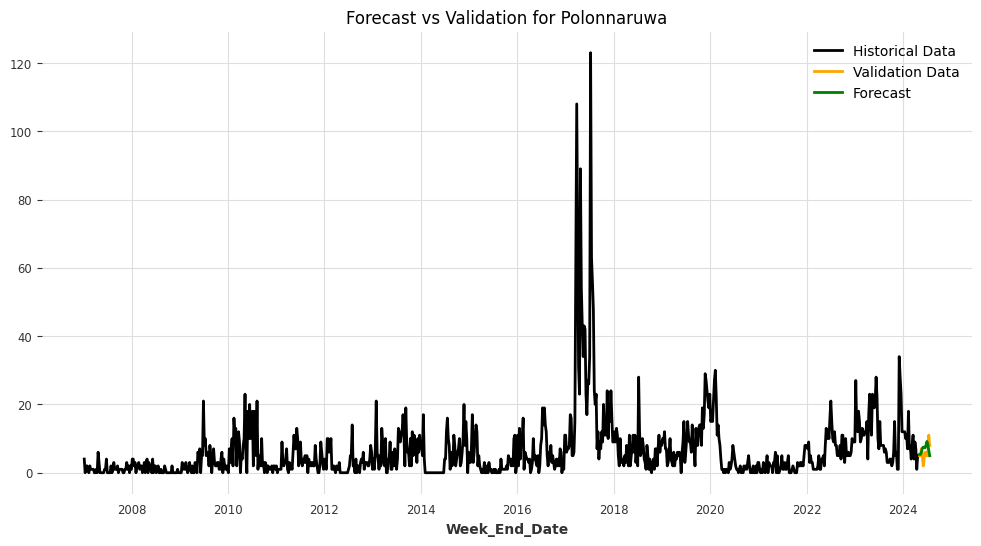

Model saved for /content/drive/MyDrive/Models/Polonnaruwa: /content/drive/MyDrive/Models/Polonnaruwa_LinearRegressionModel.pkl


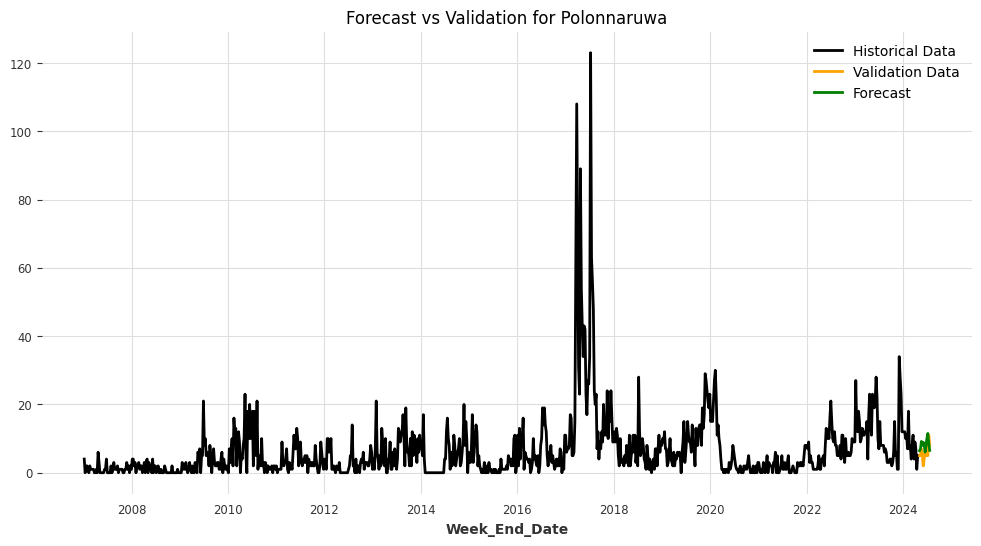

Model saved for /content/drive/MyDrive/Models/Polonnaruwa: /content/drive/MyDrive/Models/Polonnaruwa_RandomForest.pkl


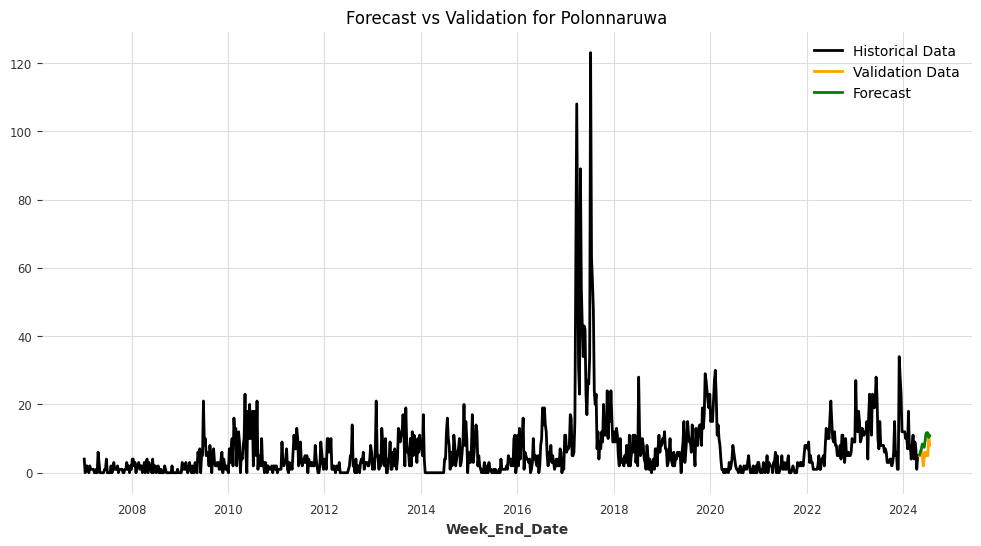

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000722 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7518
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 6.702735
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000722 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7518
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 4

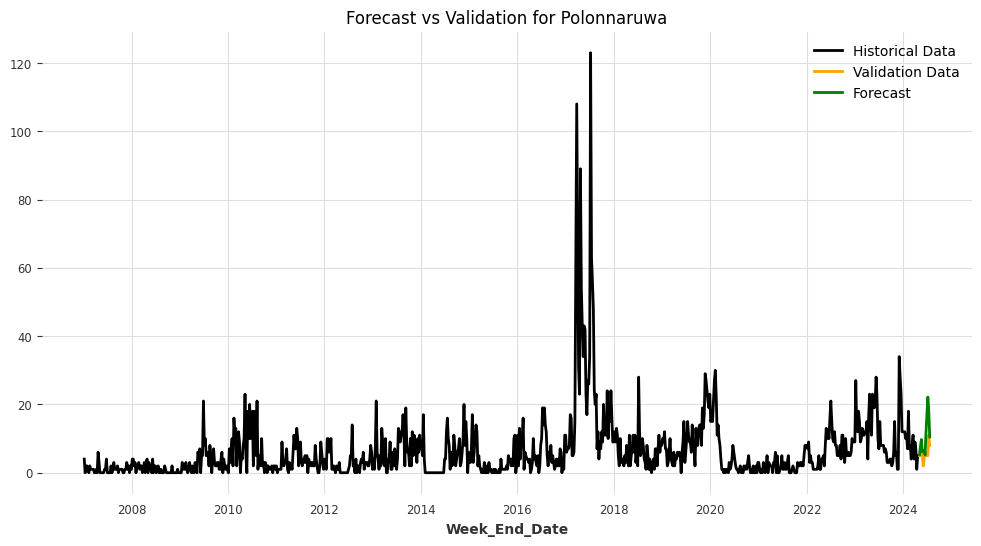

Model saved for /content/drive/MyDrive/Models/Polonnaruwa: /content/drive/MyDrive/Models/Polonnaruwa_XGBModel.pkl


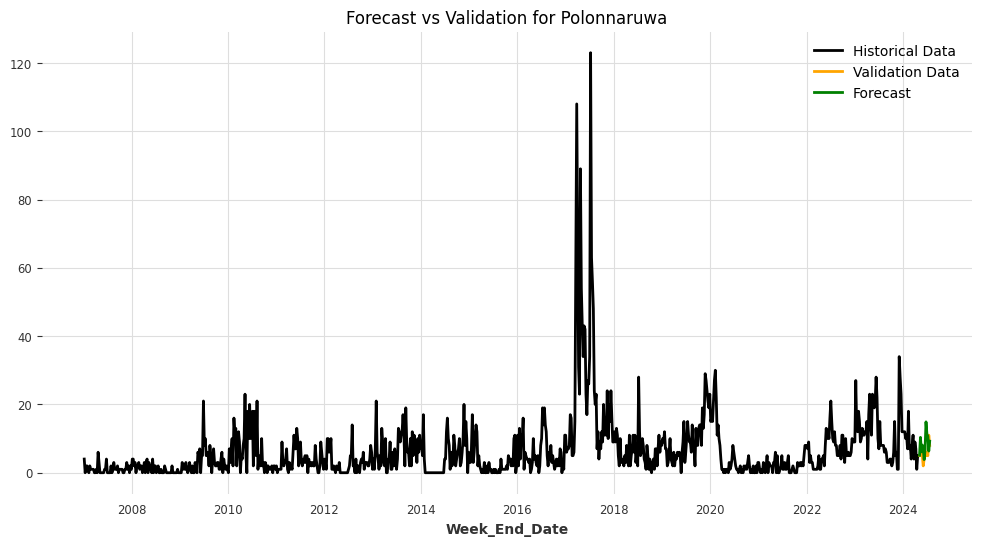

Model saved for /content/drive/MyDrive/Models/Polonnaruwa: /content/drive/MyDrive/Models/Polonnaruwa_CatBoostModel.pkl


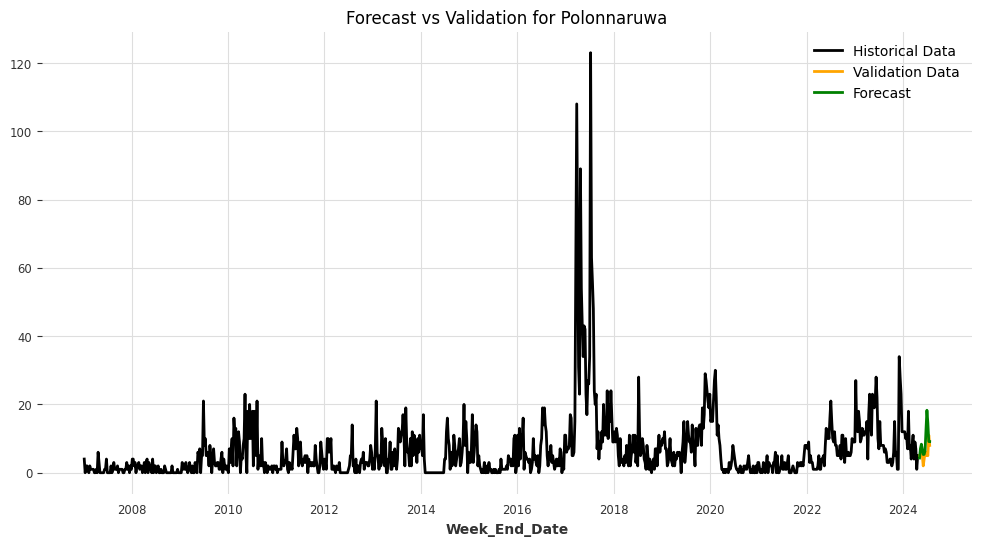

<ipython-input-20-9a1940f4a35d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Puttalam: /content/drive/MyDrive/Models/Puttalam_RegressionModel.pkl


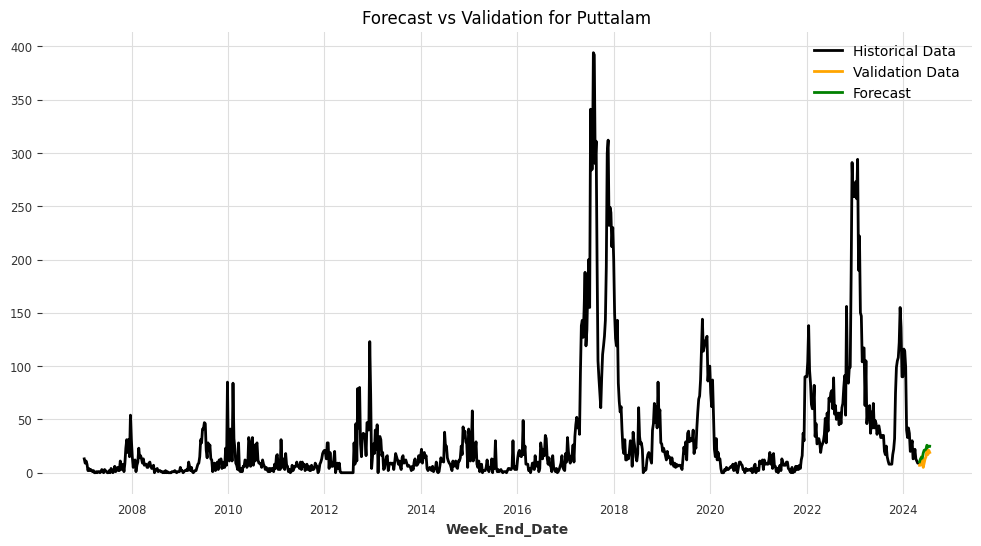

Model saved for /content/drive/MyDrive/Models/Puttalam: /content/drive/MyDrive/Models/Puttalam_LinearRegressionModel.pkl


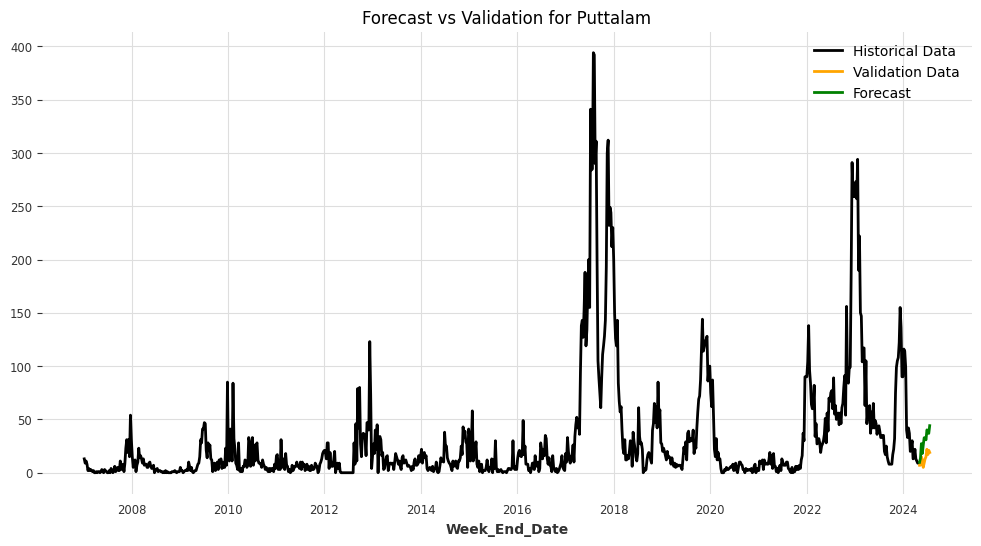

Model saved for /content/drive/MyDrive/Models/Puttalam: /content/drive/MyDrive/Models/Puttalam_RandomForest.pkl


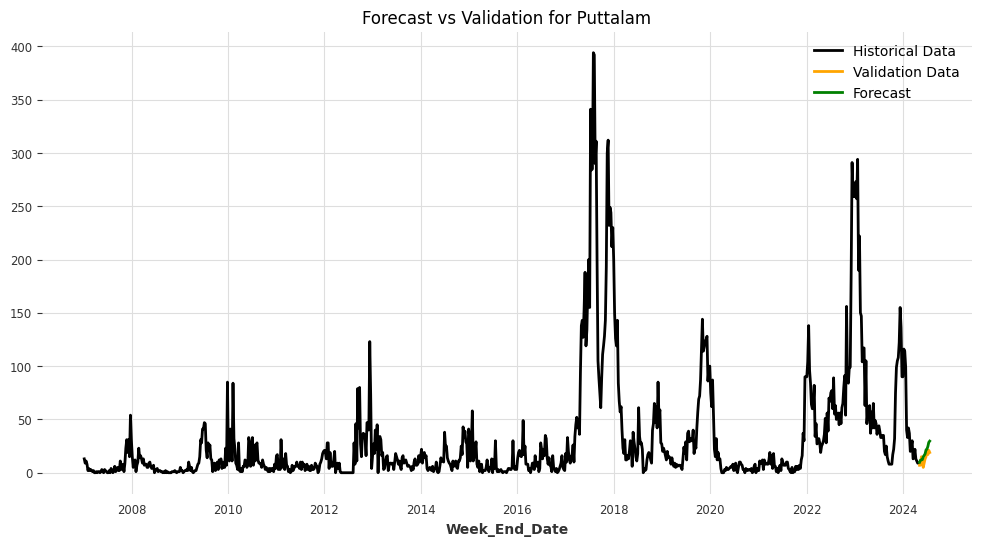

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000743 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7726
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 32.180737
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000736 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7726
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 32.206897
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.00071

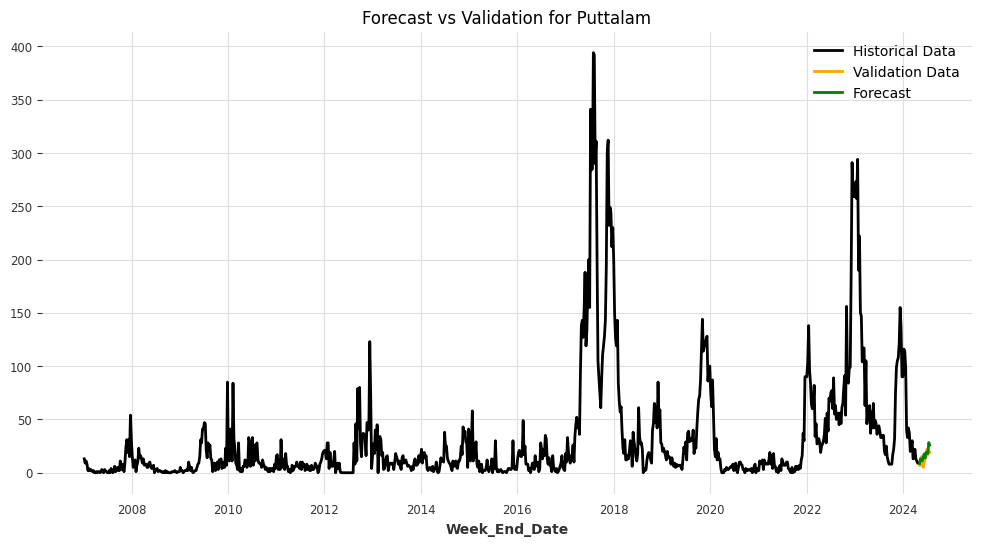

Model saved for /content/drive/MyDrive/Models/Puttalam: /content/drive/MyDrive/Models/Puttalam_XGBModel.pkl


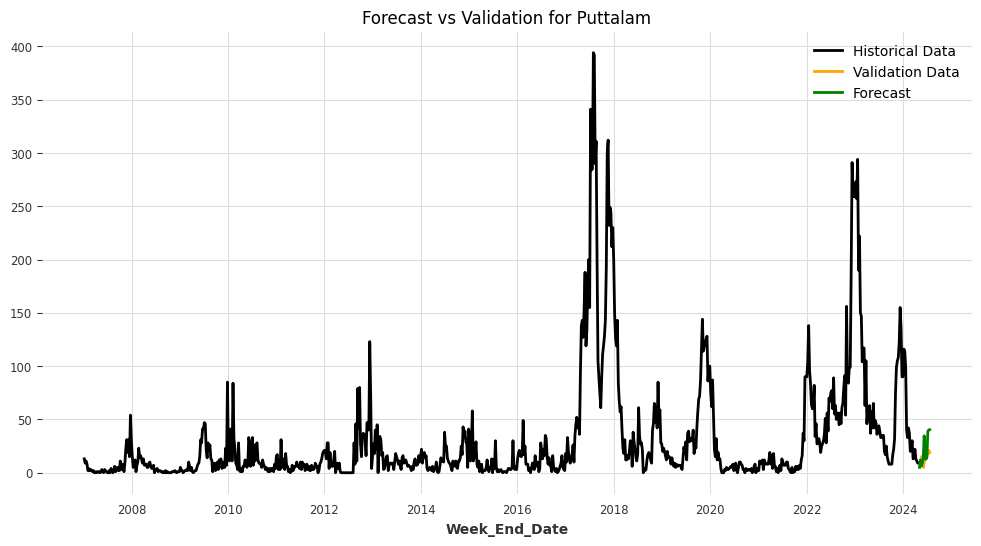

Model saved for /content/drive/MyDrive/Models/Puttalam: /content/drive/MyDrive/Models/Puttalam_CatBoostModel.pkl


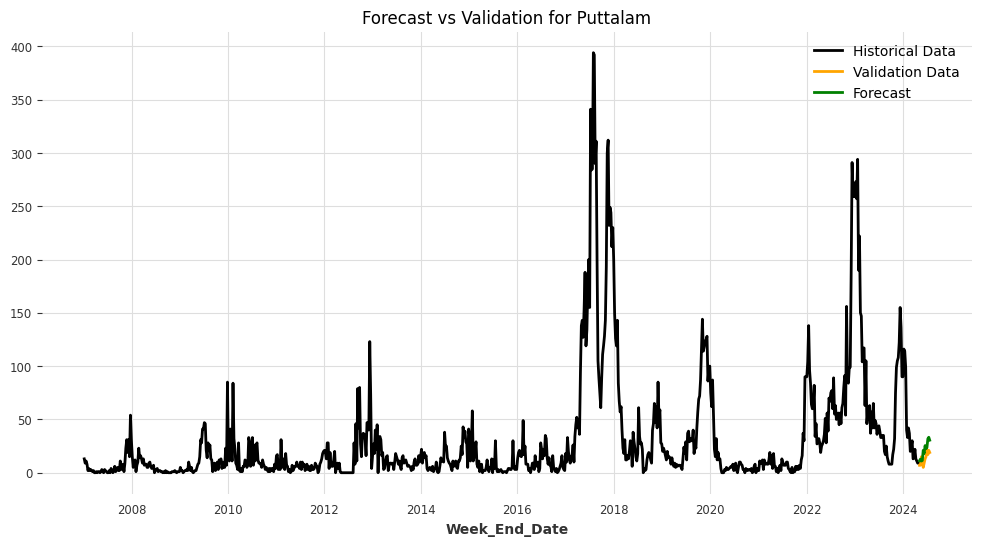

<ipython-input-20-9a1940f4a35d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Ratnapura: /content/drive/MyDrive/Models/Ratnapura_RegressionModel.pkl


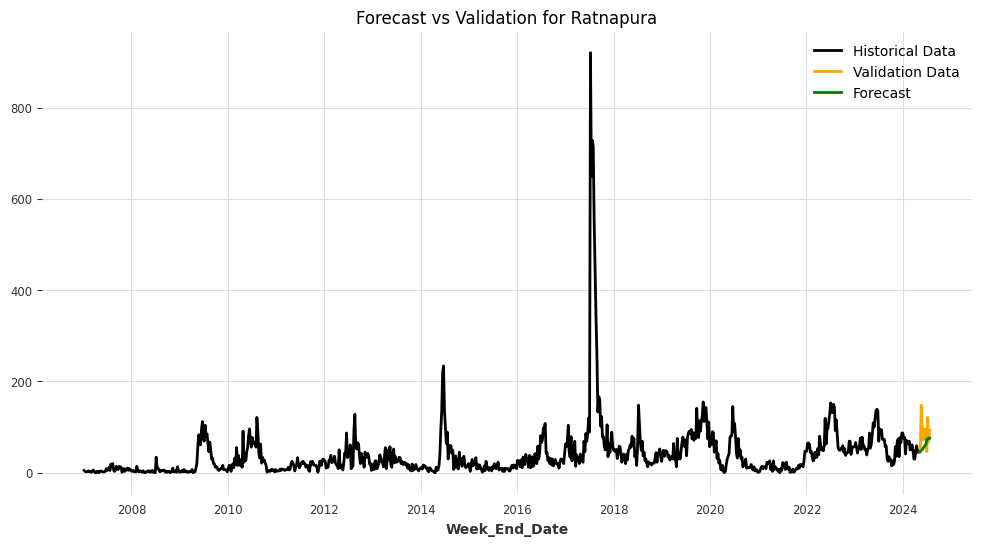

Model saved for /content/drive/MyDrive/Models/Ratnapura: /content/drive/MyDrive/Models/Ratnapura_LinearRegressionModel.pkl


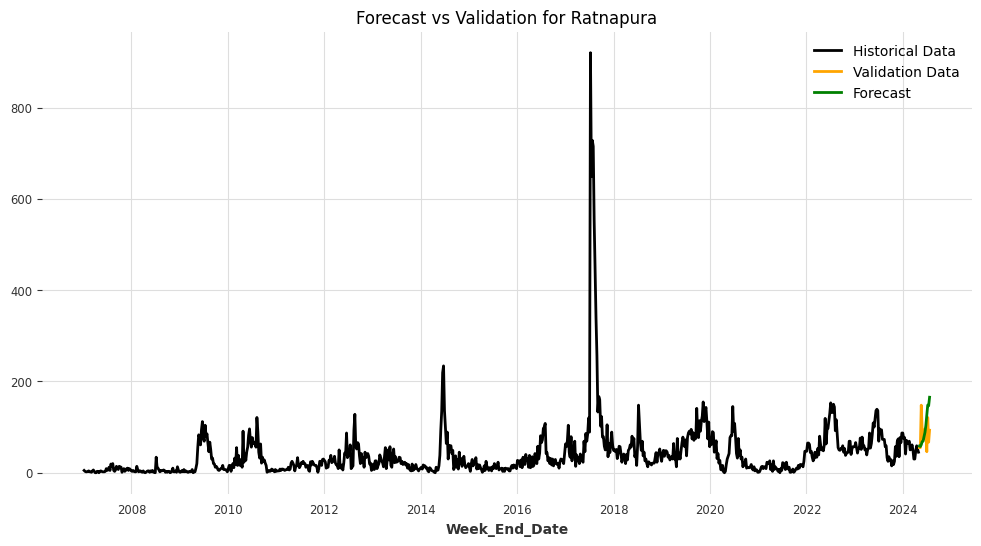

Model saved for /content/drive/MyDrive/Models/Ratnapura: /content/drive/MyDrive/Models/Ratnapura_RandomForest.pkl


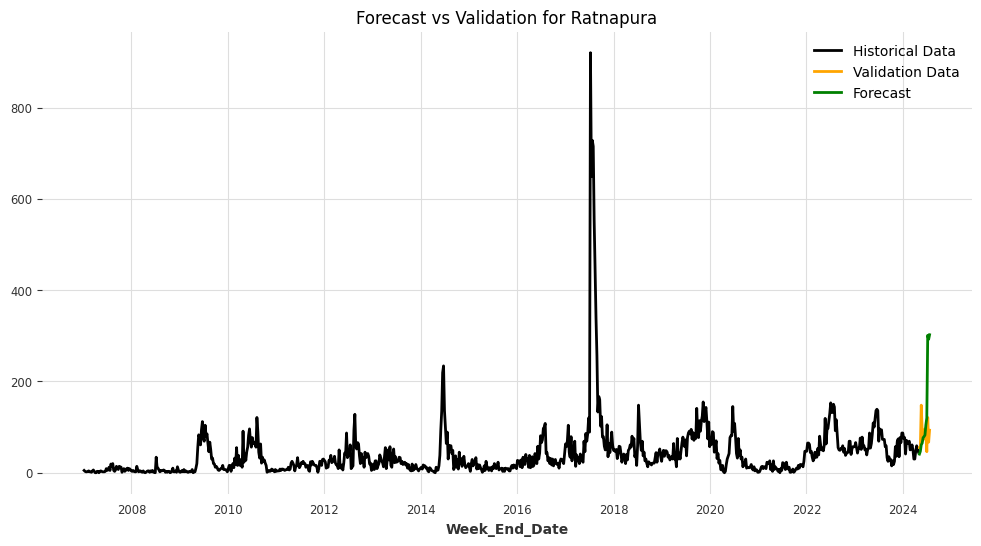

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000739 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7740
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 41.269917
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000669 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7740
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 41.348395
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warnin

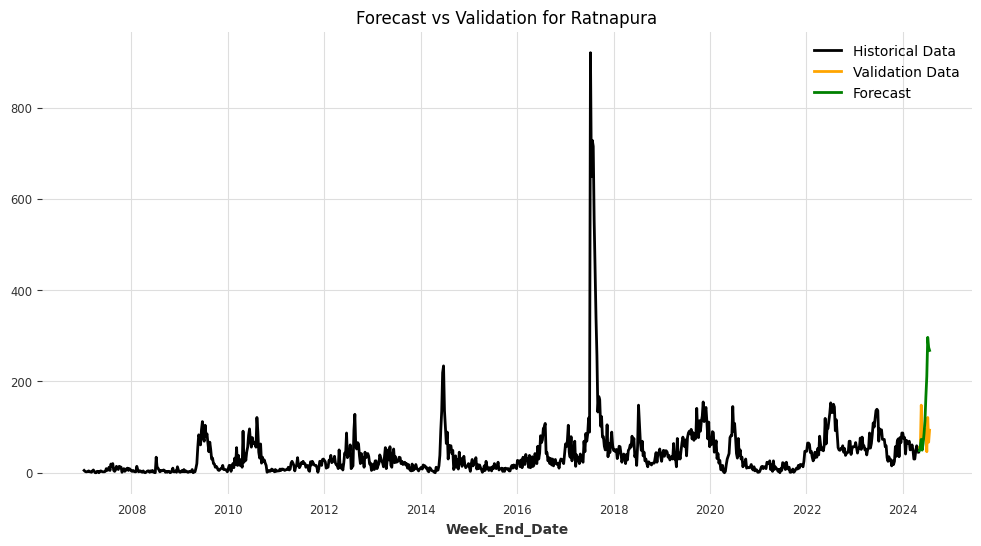

Model saved for /content/drive/MyDrive/Models/Ratnapura: /content/drive/MyDrive/Models/Ratnapura_XGBModel.pkl


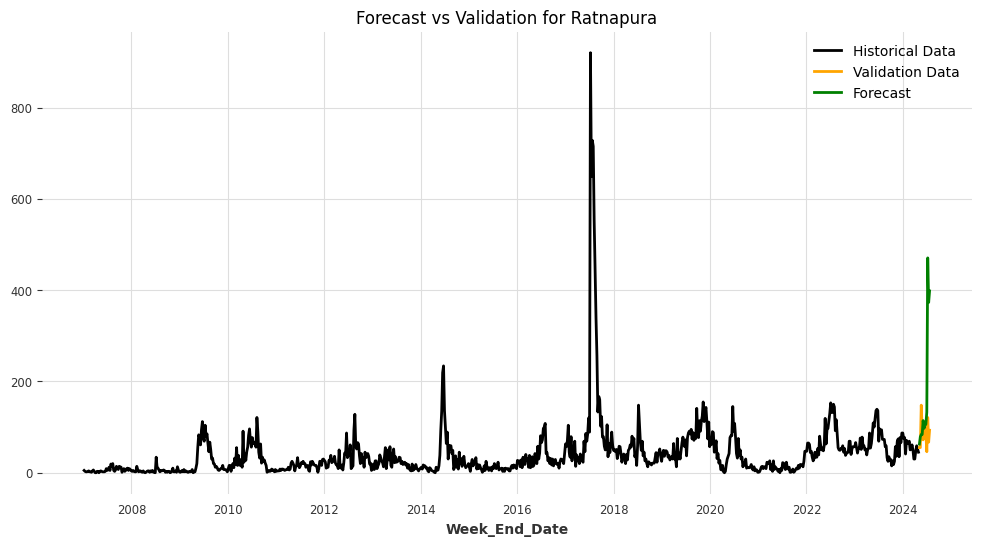

Model saved for /content/drive/MyDrive/Models/Ratnapura: /content/drive/MyDrive/Models/Ratnapura_CatBoostModel.pkl


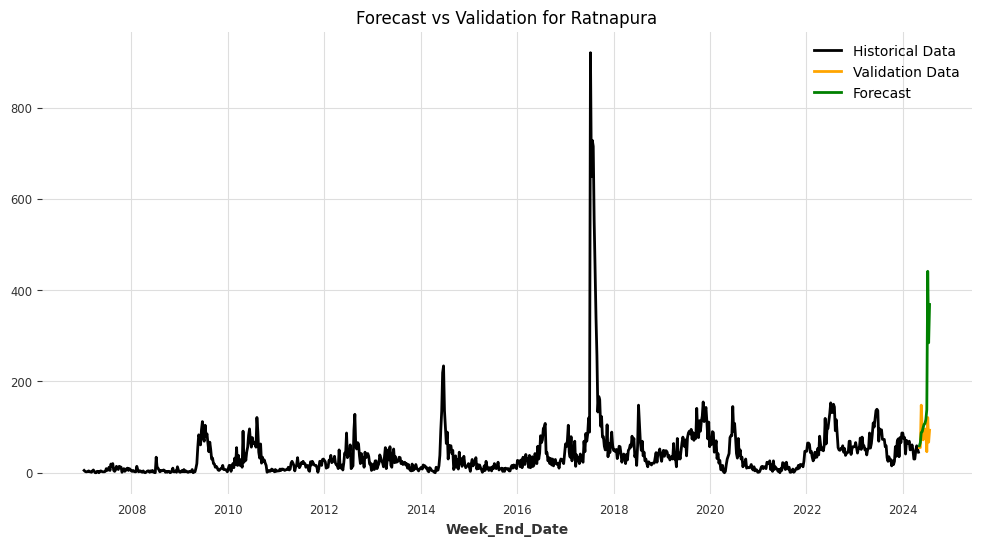

<ipython-input-20-9a1940f4a35d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Trincomalee: /content/drive/MyDrive/Models/Trincomalee_RegressionModel.pkl


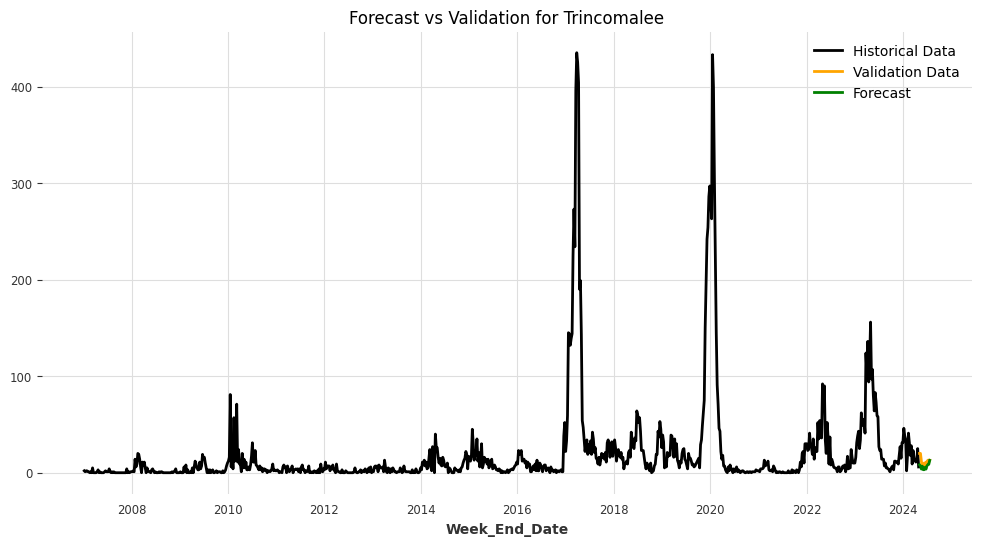

Model saved for /content/drive/MyDrive/Models/Trincomalee: /content/drive/MyDrive/Models/Trincomalee_LinearRegressionModel.pkl


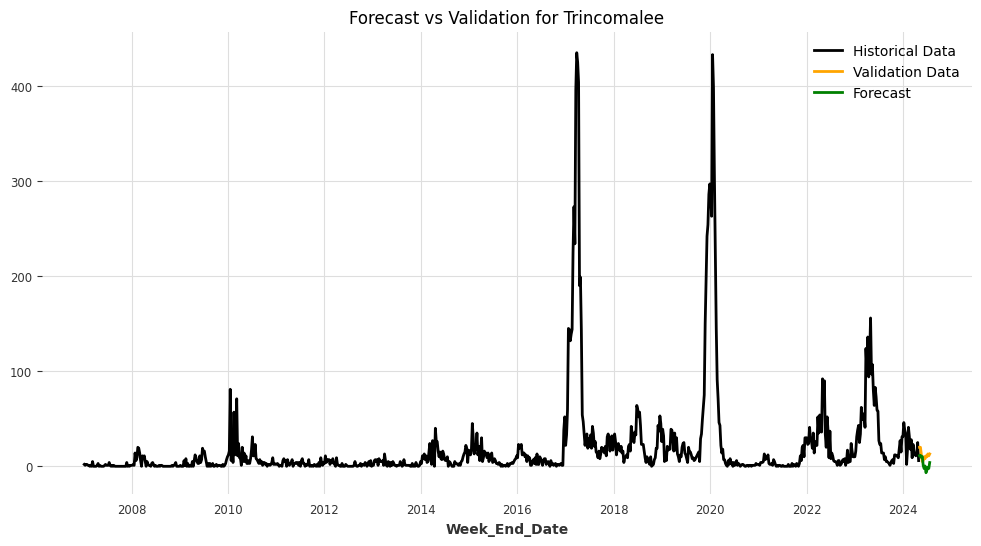

/usr/local/lib/python3.10/dist-packages/darts/metrics/metrics.py:1647: RuntimeWarning:

invalid value encountered in log



Model saved for /content/drive/MyDrive/Models/Trincomalee: /content/drive/MyDrive/Models/Trincomalee_RandomForest.pkl


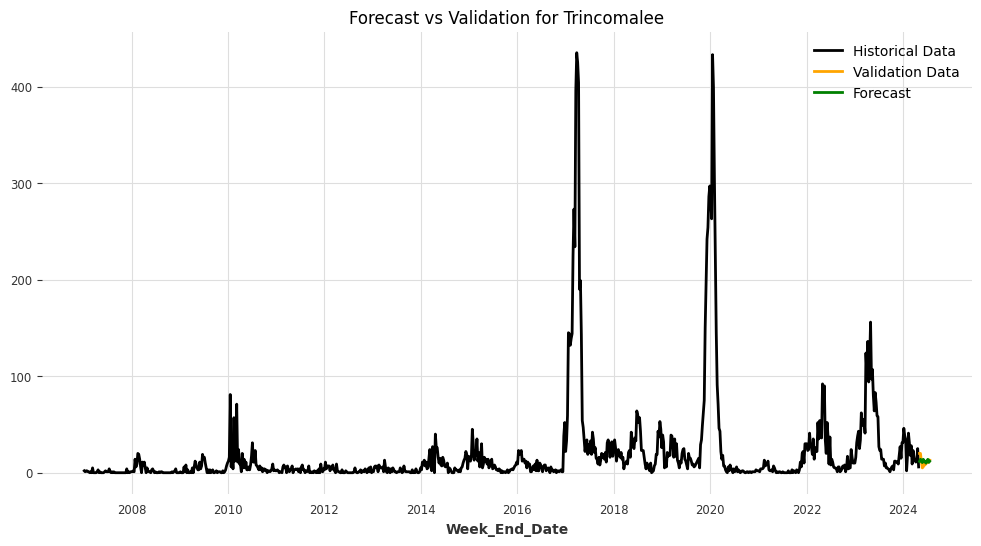

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000727 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7632
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 20.311534
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000734 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7632
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 20.347206
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000442 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7632
[LightGBM] [Info] Number of data points in the 

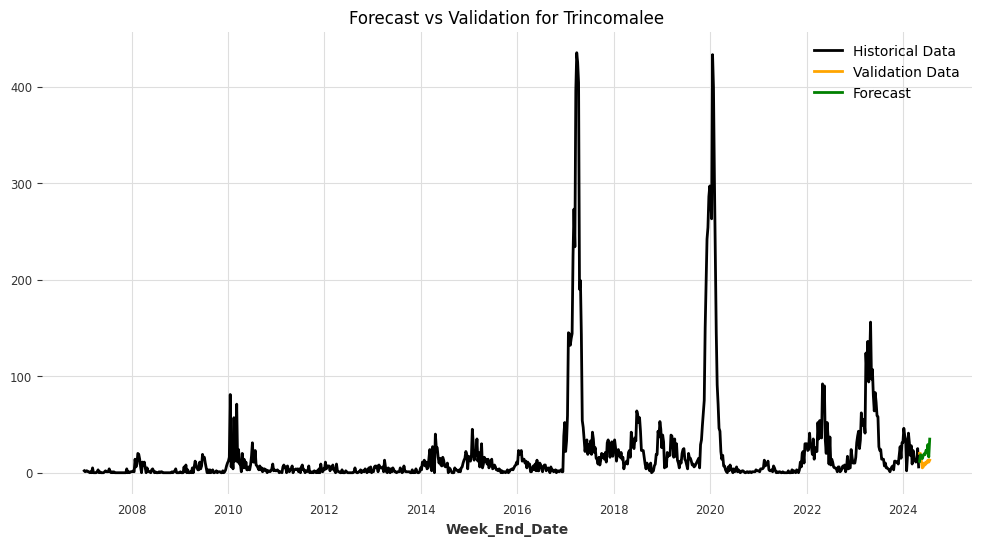

Model saved for /content/drive/MyDrive/Models/Trincomalee: /content/drive/MyDrive/Models/Trincomalee_XGBModel.pkl


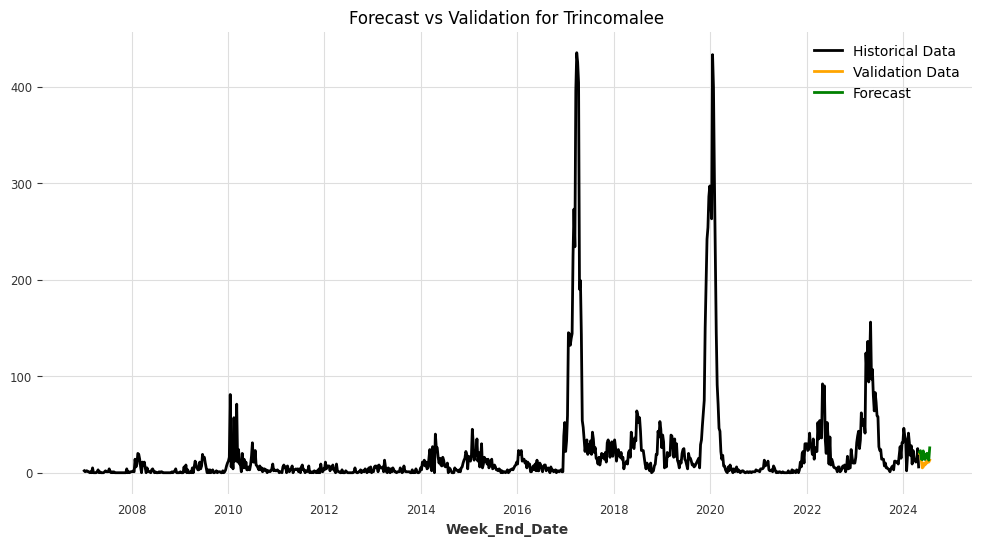

Model saved for /content/drive/MyDrive/Models/Trincomalee: /content/drive/MyDrive/Models/Trincomalee_CatBoostModel.pkl


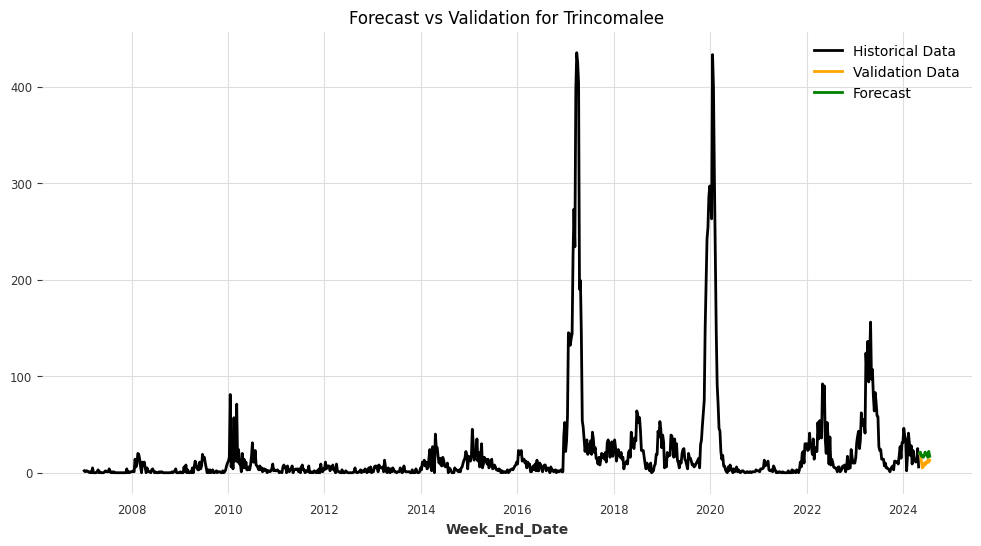

<ipython-input-20-9a1940f4a35d>:9: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



Training length: 904
Validation length: 12
Model saved for /content/drive/MyDrive/Models/Vavuniya: /content/drive/MyDrive/Models/Vavuniya_RegressionModel.pkl


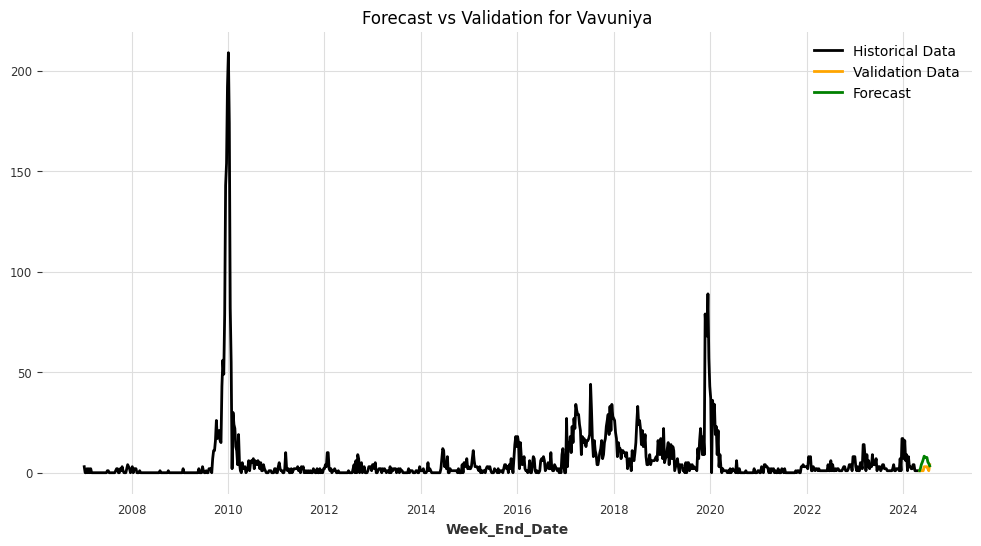

Model saved for /content/drive/MyDrive/Models/Vavuniya: /content/drive/MyDrive/Models/Vavuniya_LinearRegressionModel.pkl


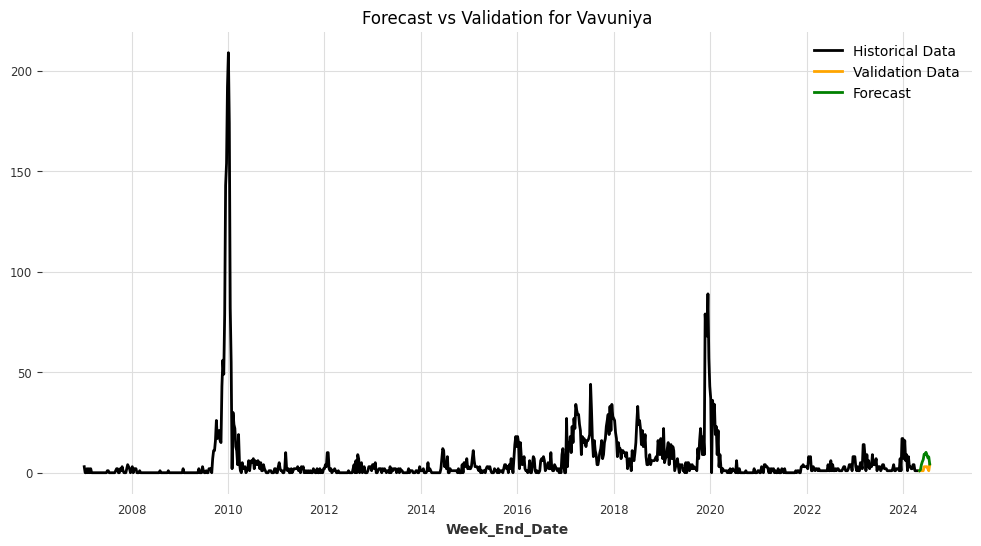

Model saved for /content/drive/MyDrive/Models/Vavuniya: /content/drive/MyDrive/Models/Vavuniya_RandomForest.pkl


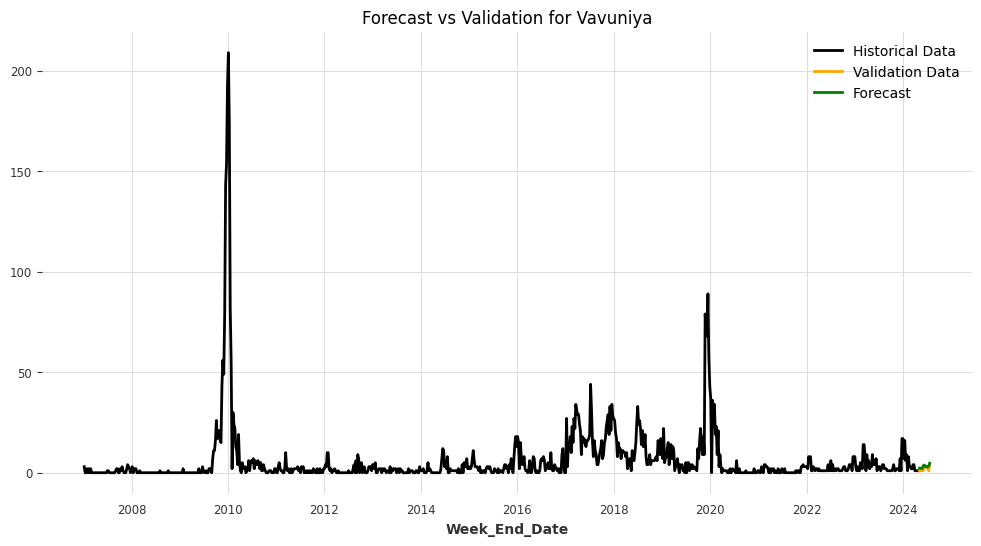

[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000708 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7543
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 6.323424
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000259 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 7543
[LightGBM] [Info] Number of data points in the train set: 841, number of used features: 40
[LightGBM] [Info] Start training from score 6.323424
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further

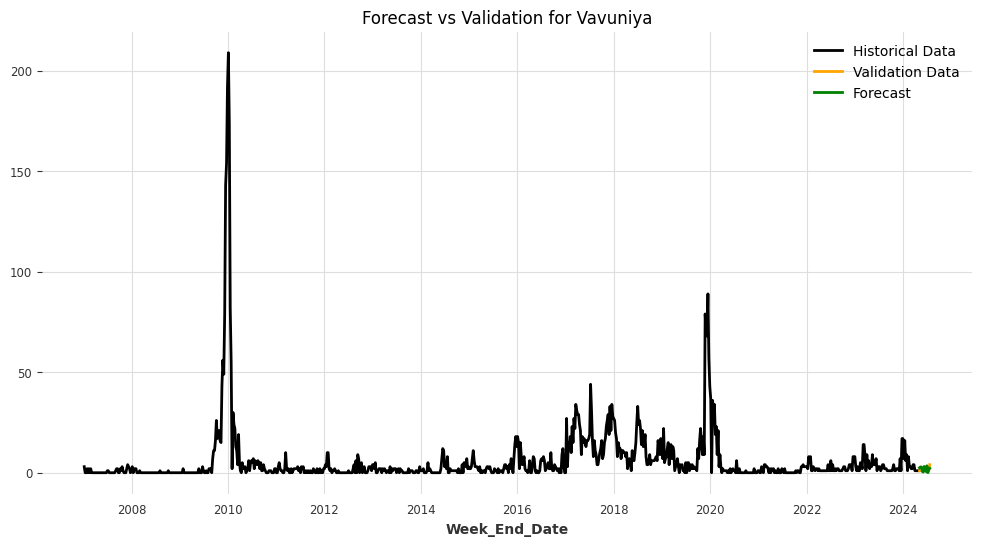

Model saved for /content/drive/MyDrive/Models/Vavuniya: /content/drive/MyDrive/Models/Vavuniya_XGBModel.pkl


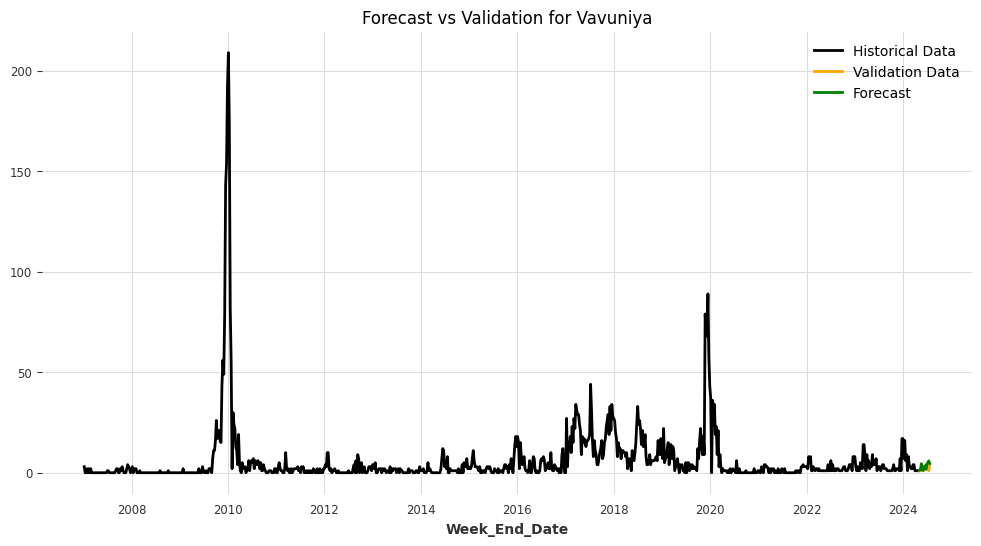

Model saved for /content/drive/MyDrive/Models/Vavuniya: /content/drive/MyDrive/Models/Vavuniya_CatBoostModel.pkl


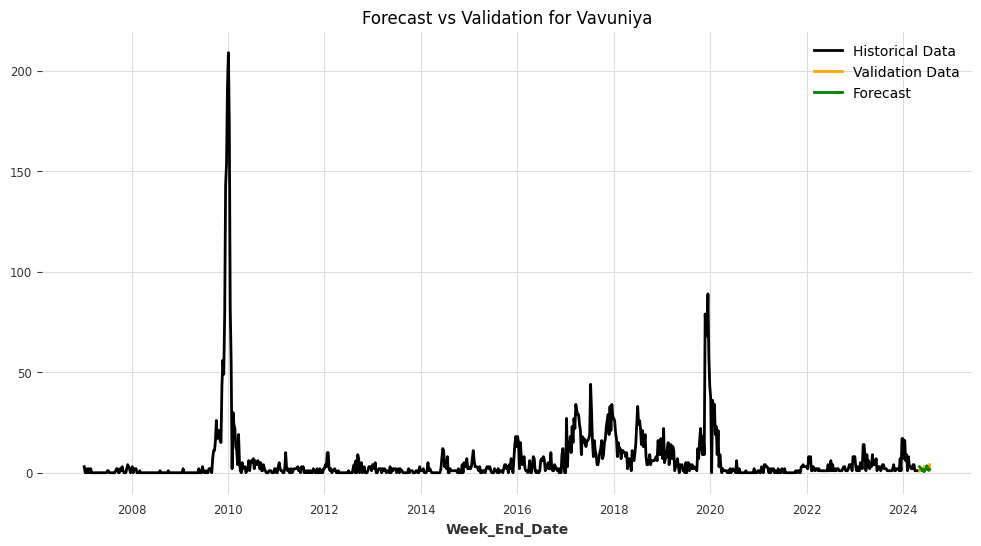

In [21]:
results = main(df, models)

## 6. Result

In [22]:
# Initialize a list to store metrics
metrics_list = []
districts = df['District'].unique()

# Iterate over results and extract metrics
for district_index, district_results in enumerate(results):
    for model_index, (forecast, metrics) in enumerate(district_results):
        metrics_list.append({
            'District': f'{districts[district_index]}',
            'Model': type(models[model_index]).__name__,
            'RMSE': metrics['RMSE'],
            'MAE': metrics['MAE'],
            'SMAPE': metrics['SMAPE'],
            'R2': metrics['R2'],
            'RMSLE': metrics['RMSLE']
        })

# Create a DataFrame from the metrics list
df_metrics = pd.DataFrame(metrics_list)
df_metrics.set_index(['District', 'Model'], inplace=True)

In [23]:
from IPython.display import display
from IPython.display import HTML

def display_district_metrics(df_metrics):
    districts = df_metrics.index.get_level_values('District').unique()

    for district in districts:
        print(f"Metrics for {district}:")
        district_df = df_metrics.loc[district]
        styled_df = district_df.style \
         .highlight_min(color="lightgreen", axis=0)

        display(styled_df)

# Example usage
display_district_metrics(df_metrics)


Metrics for Ampara:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,9.125870,8.203162,60.913205,-1.968450,0.689696
LinearRegressionModel,11.173175,9.961727,68.697089,-3.449737,0.771031
RandomForest,5.650718,4.575833,41.588893,-0.138121,0.504363
LightGBMModel,7.357375,5.617585,57.818472,-0.929421,0.842632
XGBModel,15.591645,12.126172,85.270451,-7.664929,1.073573
CatBoostModel,5.359866,4.342313,40.631590,-0.023974,0.447166


Metrics for Anuradhapura:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,6.581583,5.454763,73.465058,-1.780955,0.937010
LinearRegressionModel,20.952986,20.127419,130.397217,-27.185457,1.591092
RandomForest,3.234289,2.674167,50.135407,0.328431,0.577398
LightGBMModel,15.787614,11.160592,91.794043,-15.001704,1.209487
XGBModel,5.501973,3.487900,49.249358,-0.943436,0.780890
CatBoostModel,7.731091,5.485138,68.889919,-2.837204,0.968173


Metrics for Badulla:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,12.620523,12.092150,88.566252,-6.003351,0.990231
LinearRegressionModel,19.552186,18.775934,107.707758,-15.808998,1.215964
RandomForest,12.839330,12.200833,87.604745,-6.248296,0.944335
LightGBMModel,10.034114,8.132638,65.241809,-3.426997,0.746461
XGBModel,12.136738,10.038576,72.887644,-5.476721,0.823987
CatBoostModel,10.888564,9.609085,71.463427,-4.213056,0.783622


Metrics for Batticaloa:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,6.744537,5.722330,36.743503,-1.050199,0.415914
LinearRegressionModel,6.973392,5.947434,36.661111,-1.191693,0.422911
RandomForest,6.032199,4.887500,31.653302,-0.639997,0.358963
LightGBMModel,9.564452,7.074881,40.901320,-3.122986,0.515705
XGBModel,9.392439,8.388308,49.122232,-2.976019,0.538420
CatBoostModel,9.960582,7.348081,38.869361,-3.471581,0.518992


Metrics for Colombo:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,67.773719,54.585127,27.178327,0.375736,0.332353
LinearRegressionModel,40.438618,34.347456,19.724916,0.777752,0.264563
RandomForest,30.394788,26.380000,13.786935,0.874442,0.157005
LightGBMModel,31.879261,26.698928,15.002497,0.861878,0.181471
XGBModel,35.824425,29.143366,16.170777,0.825577,0.199201
CatBoostModel,40.060690,35.155200,18.602162,0.781887,0.214970


Metrics for Galle:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,20.323099,18.835947,50.665933,-3.522208,0.568397
LinearRegressionModel,13.633371,11.901584,36.912980,-1.035060,0.434639
RandomForest,7.955028,6.690833,22.481469,0.307126,0.252750
LightGBMModel,13.622842,11.709550,38.210347,-1.031918,0.460634
XGBModel,16.943952,13.950905,42.080258,-2.143403,0.476882
CatBoostModel,11.211315,8.758963,27.043230,-0.376207,0.333563


Metrics for Gampaha:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,15.925999,11.962757,11.877554,0.819955,0.143651
LinearRegressionModel,42.706616,33.660233,29.960279,-0.294668,0.347779
RandomForest,31.686784,25.314167,26.399708,0.287271,0.309144
LightGBMModel,40.804223,32.150898,32.952271,-0.181894,0.382652
XGBModel,47.911486,37.750094,44.874224,-0.629474,0.603810
CatBoostModel,25.829238,19.357285,18.092789,0.526422,0.222738


Metrics for Hambantota:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,14.968066,13.993757,117.843182,-5.483560,1.628105
LinearRegressionModel,17.672873,16.503050,122.945226,-8.038501,1.731966
RandomForest,14.501038,13.557500,117.067364,-5.085276,1.540118
LightGBMModel,15.799897,14.829274,121.265582,-6.224215,1.598635
XGBModel,20.027046,17.336101,120.678993,-10.606891,1.625974
CatBoostModel,14.937111,13.858454,117.367980,-5.456770,1.548809


Metrics for Jaffna:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,60.071633,56.706967,128.180059,-85.910614,1.635536
LinearRegressionModel,82.089950,76.104526,137.332156,-161.298282,1.853910
RandomForest,24.828005,22.855000,88.619407,-13.846278,1.061810
LightGBMModel,31.995326,24.553993,83.770539,-23.655114,1.102428
XGBModel,36.274512,29.111784,90.508740,-30.691084,1.235455
CatBoostModel,21.051513,18.258665,76.995108,-9.673346,0.965632


Metrics for Kalutara:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,13.102190,11.322422,23.613309,0.357903,0.262065
LinearRegressionModel,38.626551,32.182207,47.861851,-4.580651,0.563186
RandomForest,19.334371,15.005000,26.905388,-0.398212,0.333953
LightGBMModel,16.882471,13.859426,25.909642,-0.066068,0.309708
XGBModel,14.634938,9.905611,19.399171,0.198885,0.257856
CatBoostModel,17.508346,14.228030,26.482478,-0.146577,0.326100


Metrics for Kandy:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,15.003699,13.692307,16.201923,0.297428,0.178924
LinearRegressionModel,145.382872,123.742651,77.078268,-64.966099,0.898655
RandomForest,53.708677,49.726667,45.735844,-8.002916,0.496112
LightGBMModel,98.728976,91.270284,69.266358,-29.421707,0.753952
XGBModel,87.095966,78.727972,62.857853,-22.675022,0.696517
CatBoostModel,86.767117,81.080404,64.608215,-22.496580,0.699633


Metrics for Kegalle:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,17.944568,16.871112,43.546525,-1.357710,0.475071
LinearRegressionModel,45.781833,38.941122,71.206664,-14.346549,0.873565
RandomForest,28.394033,25.817500,59.540452,-4.903078,0.660771
LightGBMModel,39.919510,31.122762,61.009505,-10.667956,0.797899
XGBModel,20.626917,16.359589,40.282055,-2.115251,0.492374
CatBoostModel,30.701364,24.546428,53.067436,-5.901440,0.684233


Metrics for Kilinochchi:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,0.821428,0.459901,11.359724,0.018553,0.187976
LinearRegressionModel,3.068904,2.410368,39.308162,-12.699161,0.465884
RandomForest,4.230292,3.215000,47.174513,-25.029624,0.565768
LightGBMModel,5.604367,4.121507,56.390361,-44.685724,0.682336
XGBModel,5.817305,3.881181,49.247192,-48.223335,0.662786
CatBoostModel,5.260082,3.964768,53.724357,-39.245044,0.638661


Metrics for Kurunegala:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,15.052398,11.768849,30.453034,-1.438654,0.372407
LinearRegressionModel,42.652533,36.791472,65.742730,-18.580713,0.767898
RandomForest,28.991764,25.299167,52.189264,-8.046657,0.600269
LightGBMModel,19.423677,14.445873,35.525249,-3.060708,0.435689
XGBModel,30.630114,25.528174,54.440890,-9.098016,0.610222
CatBoostModel,23.394563,19.540878,46.361135,-4.890725,0.512129


Metrics for Mannar:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,3.351902,3.269503,64.479013,-0.014342,0.578157
LinearRegressionModel,3.450235,3.249113,62.252001,-0.074730,0.578047
RandomForest,3.312929,3.105000,59.540946,0.009108,0.591495
LightGBMModel,4.454979,3.729471,63.220058,-0.791815,0.670202
XGBModel,4.130644,3.553806,69.107359,-0.540414,0.759494
CatBoostModel,2.791795,2.262946,46.366322,0.296330,0.531272


Metrics for Matale:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,10.812089,9.527695,63.694091,-2.085370,0.772976
LinearRegressionModel,5.551038,4.744077,43.199489,0.186727,0.514646
RandomForest,4.867673,4.229167,41.456186,0.374639,0.487886
LightGBMModel,10.959125,9.468298,66.239250,-2.169859,0.699381
XGBModel,7.852477,6.214307,55.860993,-0.627427,0.670742
CatBoostModel,10.382282,8.923164,66.422183,-1.844944,0.768278


Metrics for Matara:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,16.725739,15.593402,83.832797,-3.196255,1.055836
LinearRegressionModel,25.945078,23.709196,100.421563,-9.097206,1.256343
RandomForest,11.191071,9.700833,66.825608,-0.878601,0.842456
LightGBMModel,33.621856,24.683381,96.206520,-15.956438,1.116434
XGBModel,14.346514,12.556408,77.162955,-2.087337,0.899360
CatBoostModel,18.428564,16.970685,84.663402,-4.094179,1.039454


Metrics for Monaragala:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,4.211099,3.212158,28.265120,-0.121970,0.340384
LinearRegressionModel,10.725475,9.350215,60.585345,-6.278189,0.674112
RandomForest,3.758765,3.168333,28.525016,0.106117,0.323746
LightGBMModel,8.670852,6.591237,43.728265,-3.756788,0.530601
XGBModel,6.474708,5.291036,40.871183,-1.652348,0.471262
CatBoostModel,6.132166,4.719992,36.903098,-1.379129,0.430366


Metrics for Mullaitivu:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,1.637508,1.593828,82.789822,-18.306311,0.574491
LinearRegressionModel,2.293070,2.181474,96.541740,-36.858830,0.718326
RandomForest,2.829822,2.304167,91.707608,-56.656820,0.758138
LightGBMModel,2.712580,2.110849,84.560761,-51.978245,0.728002
XGBModel,2.036313,1.594410,73.330904,-28.855323,0.616948
CatBoostModel,2.116480,1.857972,83.696709,-31.252326,0.638600


Metrics for NuwaraEliya:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,2.136017,1.834599,46.590537,-0.198923,0.474735
LinearRegressionModel,2.890090,1.948536,46.191995,-1.194848,0.528005
RandomForest,3.336894,2.649167,56.492065,-1.925948,0.640825
LightGBMModel,2.302388,1.826313,43.719276,-0.392961,0.479482
XGBModel,2.631311,2.019058,47.175721,-0.819392,0.544747
CatBoostModel,2.641578,2.046711,49.202700,-0.833618,0.559547


Metrics for Polonnaruwa:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,2.993007,2.571618,41.045880,-0.981513,0.444358
LinearRegressionModel,3.704444,3.147428,46.204401,-2.035481,0.516236
RandomForest,4.065201,3.322500,46.583512,-2.655489,0.528849
LightGBMModel,6.883038,4.965489,54.133655,-9.479530,0.636209
XGBModel,4.537565,3.527004,46.959567,-3.554358,0.544832
CatBoostModel,5.243799,3.646878,45.382929,-5.082381,0.538907


Metrics for Puttalam:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,7.117225,6.080484,40.841361,-0.712278,0.502339
LinearRegressionModel,17.274209,15.766740,72.640609,-9.086703,0.807733
RandomForest,6.332457,5.407500,36.819610,-0.355493,0.427617
LightGBMModel,5.449546,4.531129,32.809068,-0.003861,0.408665
XGBModel,13.744037,11.062163,60.028035,-5.385303,0.664149
CatBoostModel,9.672566,8.319511,49.582293,-2.162542,0.576664


Metrics for Ratnapura:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,39.064954,30.862184,39.588899,-0.962178,0.475622
LinearRegressionModel,47.740771,34.406148,34.029211,-1.930507,0.489125
RandomForest,108.657023,72.580000,51.754452,-14.180269,0.724720
LightGBMModel,110.327002,79.982259,56.198166,-14.650474,0.790129
XGBModel,164.237065,102.781314,56.587675,-33.682166,0.849536
CatBoostModel,141.454549,89.220421,52.363687,-24.727506,0.780234


Metrics for Trincomalee:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,6.617724,5.342113,59.599929,-1.199642,0.655043
LinearRegressionModel,10.750770,9.884533,137.771842,-4.805157,2.331653
RandomForest,4.296875,3.300000,28.894757,0.072657,0.358180
LightGBMModel,11.463952,10.290828,65.691048,-5.600905,0.698635
XGBModel,8.107196,6.713911,47.977780,-2.301233,0.574634
CatBoostModel,8.306388,7.147697,51.892916,-2.465447,0.610672


Metrics for Vavuniya:


,RMSE,MAE,SMAPE,R2,RMSLE
Model,,,,,
RegressionModel,3.849795,3.415934,89.801241,-11.703648,0.832438
LinearRegressionModel,4.984681,4.289273,94.652042,-20.297465,0.953205
RandomForest,1.258097,1.032500,50.532659,-0.356693,0.429688
LightGBMModel,1.448321,1.241525,77.646913,-0.797972,0.564802
XGBModel,2.051669,1.392119,49.596201,-2.608011,0.536226
CatBoostModel,1.418042,1.158085,59.355090,-0.723581,0.489662


## 7. Conclusion
To assess each models we need to see the error metrics of each model and then we have to decide which model outperformed.

Note: `We also need to do backtesting to make sure model is performing as intended`